# XGBoost Tuning

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from rdkit import Chem, RDLogger
from rdkit.Chem import Descriptors
from rdkit.Chem.MolStandardize import rdMolStandardize
from rdkit.ML.Descriptors import MoleculeDescriptors as md
from sklearn.model_selection import (
    train_test_split,
    StratifiedKFold,
    RepeatedStratifiedKFold,
    cross_val_score
)
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    precision_score,
    recall_score,
    roc_auc_score,
    confusion_matrix,
    classification_report,
    roc_curve
)
import xgboost as xgb
from xgboost import XGBClassifier
import optuna

## Molecule, Descriptor, and Outlier Utility Functions

### `molecule_from_smiles(smiles)`
Converts a SMILES string into a cleaned **RDKit molecule object**, while temporarily silencing RDKit logs to avoid console spam.

**Process:**
1. Parse the SMILES into an RDKit molecule (`Chem.MolFromSmiles`).
2. Remove salts and keep the **largest fragment** using `LargestFragmentChooser`.
3. Re-sanitize the molecule to ensure validity.
4. Logging is muted during processing and restored afterward.

**Returns:**
- `(molecule, status)`  
  - `molecule`: RDKit molecule object or `None`  
  - `status`: `"succeed"`, `"failed"`, or `"error: <message>"`

---

### `calculate_descriptors(molecule)`
Calculates all available **1D and 2D molecular descriptors** using RDKit’s built-in descriptor list.

**Steps:**
1. Collect all descriptor names from `Descriptors._descList`.  
2. Use `MolecularDescriptorCalculator` to compute their values for the molecule.  
3. Return as a dictionary mapping *descriptor name → value*.

**Returns:**
- `dict`: `{ descriptor_name: value }`

---

### `outliers_iqr(df, factor=1.5)`
Applies the **Interquartile Range (IQR)** rule to cap extreme numeric values.

**Process:**
- Compute Q1 (25%) and Q3 (75%) for each column.  
- Define bounds: `[Q1 − 1.5×IQR, Q3 + 1.5×IQR]`.  
- Values beyond these limits are **clipped** to the nearest boundary.  
- Columns with zero IQR (flat values) are skipped.

**Purpose:**
Removes the influence of outliers **without deleting rows**, preserving dataset structure and stabilizing machine learning models.

In [51]:
def molecule_from_smiles(smiles):
    lg = RDLogger.logger()
    # Temporarily silence RDKit logs (Only critical)
    lg.setLevel(RDLogger.CRITICAL)
    try:
        # Extract molecule
        molecule = Chem.MolFromSmiles(smiles, sanitize=True)
        if molecule is None:
            return None, "failed"

        # Remove salts
        clean_molecule = rdMolStandardize.LargestFragmentChooser()
        molecule = clean_molecule.choose(molecule)

        # Sanitize molecule again to reflect changes
        Chem.SanitizeMol(molecule)
        return molecule, "succeed"
    except Exception as e:
        return None, f"error: {e}"
    finally:
        # re-enable logging afterward
        lg.setLevel(RDLogger.INFO)


def calculate_descriptors(molecule):
    # Get all descriptors (1D/2D)
    descriptor_names = []
    for descriptor, _ in Descriptors._descList:
        descriptor_names.append(descriptor)

    # Use descriptors to calculate values
    calculator = md.MolecularDescriptorCalculator(descriptor_names)
    descriptor_values = calculator.CalcDescriptors(molecule)

    # Create dictionary
    descriptors = dict(zip(descriptor_names, descriptor_values))
    return descriptors


def outliers_iqr(df, factor=1.5):
    df_copy = df.copy()
    for col in df_copy.columns:
        # Only for numeric columns, but clean_desc should already be numeric
        q1 = df_copy[col].quantile(0.25)
        q3 = df_copy[col].quantile(0.75)
        iqr = q3 - q1

        # If IQR is 0 - column is too flat → skip
        if iqr == 0:
            continue

        lower = q1 - factor * iqr
        upper = q3 + factor * iqr

        # Apply the IQR limits
        df_copy[col] = df_copy[col].clip(lower, upper)
    return df_copy

## Dataset Processing and Descriptor Cleaning Pipeline

This notebook processes the *in chemico* dataset by:
- Converting SMILES strings into RDKit molecule objects  
- Computing 1D/2D molecular descriptors  
- Cleaning and preparing descriptors for machine learning  

It produces two key outputs:
1. **Full Excel report** – original dataset + raw descriptors + molecule build status  
2. **Clean CSV files** – train/test feature matrices ready for ML modeling

---

### Configuration Variables

| Variable | Description |
|-----------|--------------|
| `ORIG_DATASET` | Path to the original Excel file with SMILES and labels |
| `SKIP_ROWS` | Number of rows to skip at the top of the Excel file (e.g. non-data header) |
| `SMILES_COL` | Column name containing SMILES strings |
| `TARGET_COL` | Column name of the target variable (e.g. `Phototoxicity`) |
| `FULL_OUTPUT_DATASET` | Excel output with all raw descriptors + molecule status |
| `TRAIN_X_CSV`, `TEST_X_CSV` | Clean numeric descriptor files for ML (train/test) |
| `TRAIN_Y_CSV`, `TEST_Y_CSV` | Corresponding label files for ML (train/test) |
| `SIMILARITY_THRESHOLD` | Drop descriptors where ≥ this fraction of values are identical (e.g. 0.80 = 80%) |

---

### Workflow Overview

#### 1 Load the Dataset
- Read the Excel file specified by `ORIG_DATASET` using `pandas.read_excel()`.
- Skip any non-data rows (`SKIP_ROWS`).

#### 2 Convert SMILES → RDKit Molecules
- Loop through the SMILES column (`SMILES_COL`).
- Convert each SMILES to an RDKit `Mol` object using `molecule_from_smiles()`.
- Track molecule build status (`"succeed"`, `"failed"`, or `"error: ..."`).

#### 3 Compute RDKit Descriptors
- For each valid molecule, compute 1D/2D descriptors with `calculate_descriptors()`.
- Store descriptor values as dictionaries in a list.

#### 4 Build the Descriptor Table
- Convert the list of descriptor dictionaries into a single `pandas.DataFrame`.
- Each **descriptor** becomes a **column**; each **molecule** becomes a **row**.

#### 5 Descriptor Cleaning (Leak-Free)
All cleaning is fitted **only on the training set** to prevent data leakage:
- Keep only **numeric** descriptor columns.
- Replace `inf` and `-inf` values with `NaN`.
- Fill missing values with the **median** from the **training set**.
- Drop **constant or near-constant** descriptors where ≥ `SIMILARITY_THRESHOLD` of values are identical.
- Apply **IQR-based clipping** (`outliers_iqr(df, factor=1.5)`) on the **training data only** to cap extreme outliers.

#### 6 Merge and Save Outputs
- Merge the **original dataset** and **raw descriptor data** into one DataFrame,  
  adding a `MoleculeStatus` column.
- Save:
  - The full annotated dataset → `FULL_OUTPUT_DATASET` (Excel)
  - Cleaned train/test features → `TRAIN_X_CSV` and `TEST_X_CSV`
  - Train/test labels → `TRAIN_Y_CSV` and `TEST_Y_CSV`

#### 7 Logging and Summary
After processing:
- Print the number of rows/columns for the full and clean datasets.
- List descriptors dropped as constant or almost constant.
- Show a preview (`head()`) of both full and cleaned feature sets.

---

### Notes
- Columns that are **completely NaN** are dropped *before splitting* (safe operation).
- Missing values, constant-column filtering, and IQR clipping are all **fit only on the training set**.
- This ensures a fully **data leakage–free** preprocessing pipeline, ready for ML experiments.

In [52]:
# Configuration
ORIG_DATASET = "in_chemico_dataset.xlsx"
SKIP_ROWS = 1
SMILES_COL = "SMILES code"
TARGET_COL = "Phototoxicity"
FULL_OUTPUT_DATASET = "in_chemico_dataset_processed.xlsx"

# Outputs
TRAIN_X_CSV = "in_chemico_x_train.csv"
TEST_X_CSV = "in_chemico_x_test.csv"
TRAIN_Y_CSV = "in_chemico_y_train.csv"
TEST_Y_CSV = "in_chemico_y_test.csv"

# Near constant treshold - tolerance
SIMILARITY_THRESHOLD = 0.80

# Load dataset and skip first row (Header)
dataset = pd.read_excel(ORIG_DATASET, engine="openpyxl", skiprows=SKIP_ROWS)

# Build descriptors
descriptor_rows = []
state_molecules = []
molecules = []

# Loop over the SMILES column
for smiles in dataset[SMILES_COL].astype(str):
    molecule, state = molecule_from_smiles(smiles)
    state_molecules.append(state)
    molecules.append(molecule)

    # If molecule construction failed - empty placeholder
    if molecule is None:
        descriptor_rows.append({})
        continue
    # Calculate descriptors for each molecule
    descriptor_rows.append(calculate_descriptors(molecule))

# Convert list of dictionaries into dataframe
descriptor_data_all = pd.DataFrame(descriptor_rows)

# Keep everything + status
output = pd.concat(
    [dataset.reset_index(drop=True), descriptor_data_all.reset_index(drop=True)],
    axis=1
)
output["MoleculeStatus"] = state_molecules

# Output whole dataset with descriptors and state
with pd.ExcelWriter(FULL_OUTPUT_DATASET, engine="openpyxl") as writer:
    output.to_excel(writer, index=False, sheet_name="Descriptors")

print(f"Full - Rows: {len(output)}/Columns: {output.shape[1]}")
print(output.head().to_string(index=False))

# Drop failed molecules - boolean array
molecules_right = []
for molecule in molecules:
    if molecule is not None:
        molecules_right.append(True)
    else:
        molecules_right.append(False)
if not any(molecules_right):
    raise ValueError("No valid molecules after SMILES parsing.")

dataset_ok = dataset.loc[molecules_right].reset_index(drop=True)
descriptor_ok = descriptor_data_all.loc[molecules_right].reset_index(drop=True)

# Target
y_full = dataset_ok[TARGET_COL].astype(int)

# Take only numeric descriptor columns
X_full = descriptor_ok.select_dtypes(include=[np.number]).copy()
for column in X_full.columns:
    X_full[column] = X_full[column].replace([np.inf, -np.inf], np.nan)

# Drop columns that are entirely NaN
all_nan_cols = X_full.columns[X_full.isna().all()].tolist()
if all_nan_cols:
    print(f"Dropping {len(all_nan_cols)} NaN columns.")
    X_full = X_full.drop(columns=all_nan_cols)

# Split dataset - train and test
X_train, X_test, y_train, y_test = train_test_split(
    X_full, y_full, test_size=0.2, random_state=42, stratify=y_full
)

# Calculate medians for each column in train only
train_medians = X_train.median(numeric_only=True)

# Fill missing values in both train and test using those medians
X_train = X_train.fillna(train_medians)
X_test = X_test.fillna(train_medians)

# Compute constants on train only
constant_cols = []
for col in X_train.columns:
    top_freq = X_train[col].value_counts(normalize=True, dropna=False).max()
    if top_freq >= SIMILARITY_THRESHOLD:
        constant_cols.append(col)

# Drop from train and apply same drop to test
if constant_cols:
    X_train = X_train.drop(columns=constant_cols)
    X_test = X_test.drop(columns=constant_cols)
    print(f"Dropped {len(constant_cols)} constant/almost-constant columns.")

X_train = outliers_iqr(X_train, factor=1.5)

X_train.to_csv(TRAIN_X_CSV, index=False)
X_test.to_csv(TEST_X_CSV, index=False)
y_train.to_csv(TRAIN_Y_CSV, index=False, header=[TARGET_COL])
y_test.to_csv(TEST_Y_CSV, index=False, header=[TARGET_COL])

print(f"Train - Rows: {len(X_train)}/Columns: {X_train.shape[1]}")
print("First rows of train x:")
print(X_train.head().to_string(index=False))
print(f"Test - Rows: {len(X_test)}/Columns: {X_test.shape[1]}")
print("First rows of train y:")
print(y_train.head().to_string(index=False))
X_train.describe()

Full - Rows: 162/Columns: 230
                          Name                                                                                              IUPAC name CAS registry number    Structure  Phototoxicity                                                      SMILES code                            Sources               Note    Unnamed: 8 Unnamed: 9  Unnamed: 10 Unnamed: 11  MaxAbsEStateIndex  MaxEStateIndex  MinAbsEStateIndex  MinEStateIndex      qed       SPS   MolWt  HeavyAtomMolWt  ExactMolWt  NumValenceElectrons  NumRadicalElectrons  MaxPartialCharge  MinPartialCharge  MaxAbsPartialCharge  MinAbsPartialCharge  FpDensityMorgan1  FpDensityMorgan2  FpDensityMorgan3  BCUT2D_MWHI  BCUT2D_MWLOW  BCUT2D_CHGHI  BCUT2D_CHGLO  BCUT2D_LOGPHI  BCUT2D_LOGPLOW  BCUT2D_MRHI  BCUT2D_MRLOW   AvgIpc  BalabanJ    BertzCT      Chi0     Chi0n     Chi0v      Chi1    Chi1n    Chi1v    Chi2n    Chi2v    Chi3n    Chi3v    Chi4n    Chi4v  HallKierAlpha           Ipc    Kappa1   Kappa2   Kappa3  Labute

,MaxAbsEStateIndex,MaxEStateIndex,MinAbsEStateIndex,MinEStateIndex,qed,SPS,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,...,fr_C_O_noCOO,fr_NH0,fr_NH1,fr_aniline,fr_benzene,fr_bicyclic,fr_ether,fr_halogen,fr_para_hydroxylation,fr_pyridine
count,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000,...,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000,129.000000
mean,11.352259,11.352259,0.193352,-0.913807,0.606684,14.198433,317.702837,300.605333,317.265179,115.248062,...,0.593023,1.263566,0.434109,0.500000,1.317829,0.604651,0.523256,0.670543,0.294574,0.232558
std,2.430989,2.430989,0.188957,1.107129,0.211797,4.792314,126.620808,122.168050,126.421616,43.814066,...,0.772495,1.444382,0.632393,0.728869,0.819532,0.797149,0.800050,0.913219,0.564622,0.476177
min,6.194108,6.194108,0.000297,-3.038324,0.139518,6.000000,46.069000,40.021000,46.041865,20.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,10.206402,10.206402,0.052299,-1.315329,0.481898,10.857143,232.239000,220.143000,232.084792,88.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,11.846296,11.846296,0.124071,-0.830880,0.652473,12.333333,313.788000,297.660000,313.098190,112.000000,...,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,12.881264,12.881264,0.277145,-0.166667,0.791627,16.678571,381.379000,367.267000,381.075882,138.000000,...,1.000000,2.000000,1.000000,1.000000,2.000000,1.000000,1.000000,1.000000,0.000000,0.000000
max,15.645307,15.645307,0.614414,1.311296,0.893230,25.410714,605.089000,587.953000,604.562518,213.000000,...,2.500000,5.000000,2.500000,2.500000,3.000000,2.500000,2.500000,2.500000,2.000000,2.000000


## Model Training and Evaluation (XGBoost)

This section loads the **preprocessed, leak-free** training and testing datasets generated earlier  
and trains an **XGBoost binary classifier** to predict phototoxicity outcomes.

### Workflow Summary
1. **Load data**  
   - `X_train`, `X_test`: feature matrices (numeric descriptors)  
   - `y_train`, `y_test`: corresponding target labels  
   - Performs alignment checks to ensure features and labels match.

2. **Initialize XGBoost model**  
   Uses default core hyperparameters (tunable later via Optuna or grid search).  
   - `tree_method="auto"` automatically selects the best GPU/CPU backend.  
   - `eval_metric=["logloss", "auc"]` tracks classification performance.

3. **Train model**  
   Fits on `X_train`, evaluates on `(X_test, y_test)` without printing per-epoch logs.

4. **Predict and evaluate**  
   - Computes Accuracy, Precision, Recall, F1, and ROC AUC.  
   - Prints a full classification report.  
   - Plots a **confusion matrix** and **ROC curve** for visual performance assessment.

5. **Feature importance analysis**  
   - Extracts and ranks features by gain-based importance (`model.feature_importances_`).  
   - Saves the full ordered feature list to `top_features_best.csv`.

---

**Outputs**
- Model performance metrics printed in console  
- Confusion matrix and ROC curve plots  
- `top_features_best.csv` with feature importance ranking


Model performance:
Accuracy: 0.6061
Precision: 0.6667
Recall: 0.5556
F1 score: 0.6061
ROC AUC: 0.6889

Classification report:
              precision    recall  f1-score   support

           0      0.556     0.667     0.606        15
           1      0.667     0.556     0.606        18

    accuracy                          0.606        33
   macro avg      0.611     0.611     0.606        33
weighted avg      0.616     0.606     0.606        33


Top 15 features (by XGBoost importance):
                feature  importance
NumAromaticHeterocycles    0.113731
              PEOE_VSA8    0.099809
    MinAbsPartialCharge    0.044533
               SMR_VSA4    0.043976
       MinPartialCharge    0.040365
                   TPSA    0.040314
            VSA_EState7    0.031364
          BCUT2D_LOGPHI    0.031339
                BertzCT    0.024400
               SMR_VSA9    0.022846
       FpDensityMorgan2    0.021536
                    qed    0.020458
               SMR_VSA3    0.019890


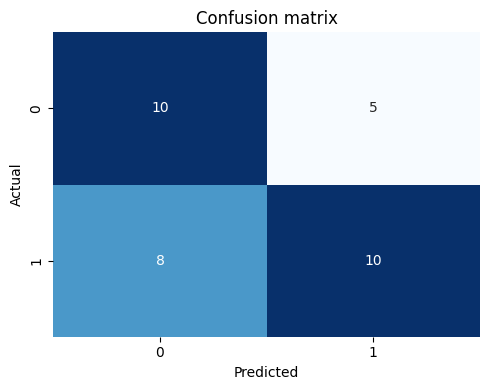

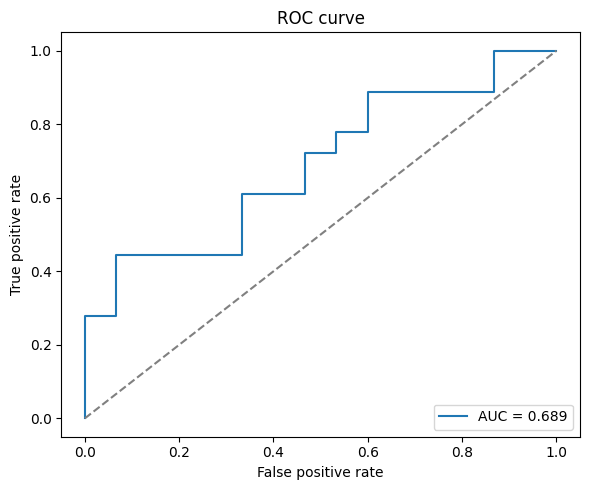

In [53]:
# Config
TRAIN_X_CSV = "in_chemico_x_train.csv"
TEST_X_CSV = "in_chemico_x_test.csv"
TRAIN_Y_CSV = "in_chemico_y_train.csv"
TEST_Y_CSV = "in_chemico_y_test.csv"
FEATURE_IMPORT_CSV = "top_features_best.csv"

# Read X
X_train = pd.read_csv(TRAIN_X_CSV)
X_test = pd.read_csv(TEST_X_CSV)

# Read y
y_train = pd.read_csv(TRAIN_Y_CSV)
y_test = pd.read_csv(TEST_Y_CSV)

# Checks
assert list(X_train.columns) == list(X_test.columns), "Train/Test feature columns are misaligned."
assert len(X_train) == len(y_train) and len(X_test) == len(y_test), "X/y rows are misaligned."

model = xgb.XGBClassifier(
    random_state=42,
    tree_method="auto",
    n_jobs=-1,
    eval_metric=["logloss", "auc"],
    # --- Core training parameters ---
    # n_estimators=100,     # number of boosting rounds (default=100)
    # learning_rate=0.3,    # step size shrinkage used in update (default=0.3)
    # max_depth=6,          # maximum depth of each tree (default=6)
    # min_child_weight=1,   # minimum sum of instance weight (default=1)
    # gamma=0.0,            # minimum loss reduction to make a split (default=0.0)
    # subsample=1.0,        # fraction of samples per tree (default=1.0)
    # colsample_bytree=1.0, # fraction of features per tree (default=1.0)

    # --- Regularization (model complexity control) ---
    # reg_alpha=0.0,        # L1 regularization term (default=0.0)
    # reg_lambda=1.0,       # L2 regularization term (default=1.0)

    # --- Randomization ---
    # colsample_bylevel=1.0,  # fraction of columns for each tree level (default=1.0)
    # colsample_bynode=1.0,   # fraction of columns per split (default=1.0)
    # scale_pos_weight=1.0,   # control imbalance between classes (default=1.0)

    # --- Learning task ---
    # objective="binary:logistic",  # default for binary classification
    # eval_metric="logloss",        # default for classification (can add "auc")

    # --- Advanced / system ---
    # booster="gbtree",     # default booster type ("gbtree", "dart", "gblinear")
    # verbosity=1,          # 0 = silent, 1 = warning, 2 = info, 3 = debug
)

# Train
model.fit(
    X_train,
    y_train,
    eval_set=[(X_test, y_test)],
    verbose=False,
)

# Predict
y_pred = model.predict(X_test)
y_prob = model.predict_proba(X_test)[:, 1]

acc = accuracy_score(y_test, y_pred)
prec = precision_score(y_test, y_pred)
rec = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
auc = roc_auc_score(y_test, y_prob)

print("\nModel performance:")
print(f"Accuracy: {acc:.4f}")
print(f"Precision: {prec:.4f}")
print(f"Recall: {rec:.4f}")
print(f"F1 score: {f1:.4f}")
print(f"ROC AUC: {auc:.4f}")

print("\nClassification report:")
print(classification_report(y_test, y_pred, digits=3))

# Gain-based by default model.feature_importances_
feat_imp = pd.DataFrame({
    "feature": X_train.columns,
    "importance": model.feature_importances_,
})

# Most important first
feat_imp = feat_imp.sort_values("importance", ascending=False).reset_index(drop=True)

print("\nTop 15 features (by XGBoost importance):")
print(feat_imp.head(15).to_string(index=False))

# Save ordered features
feat_imp.to_csv(FEATURE_IMPORT_CSV, index=False)

# Confusion Matrix
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(5, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion matrix")
plt.tight_layout()
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
plt.figure(figsize=(6, 5))
plt.plot(fpr, tpr, label=f"AUC = {auc:.3f}")
plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False positive rate")
plt.ylabel("True positive rate")
plt.title("ROC curve")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

## Feature Selection Performance Sweep

This section evaluates how the model’s performance changes as we include more top-ranked features  
(based on XGBoost’s feature importances).

### Workflow Summary

1. **Iterative training loop**  
   - Start with the **top 5 most important features**.  
   - Incrementally add more features up to the full set.  
   - For each subset size `n`, train a new XGBoost model and record:
     - **Accuracy**
     - **F1 Score**
     - **ROC AUC**

2. **Result collection**  
   - Results are stored in a DataFrame (`res_df`) with columns:  
     `Top_N`, `Accuracy`, `F1`, and `ROC_AUC`.

3. **Best feature count selection**  
   - Identify the number of top features (`best_n`) that gives the **highest F1 score**.  
   - This helps balance precision and recall performance.

4. **Visualization**  
   - Plot model performance (Accuracy, F1, ROC AUC) against the number of top features.  
   - Observe whether performance plateaus or degrades with too many features.

5. **Output**  
   - Prints the best-performing feature count and its corresponding metrics.

---

**Purpose**
This helps determine the **optimal number of descriptors** for the model,  
avoiding redundant or noisy features while retaining strong predictive power.

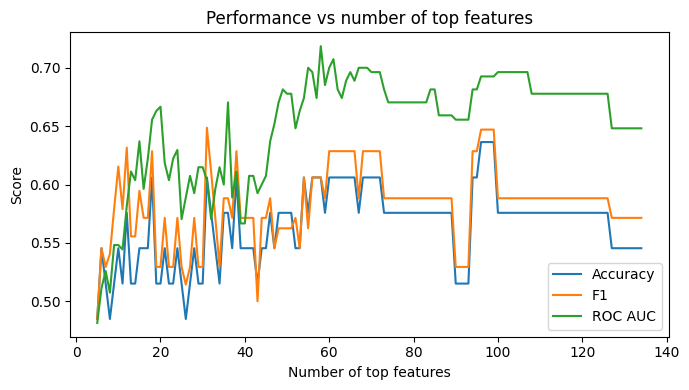


Best number of features: 31
Top_N       31.000000
Accuracy     0.606061
F1           0.648649
ROC_AUC      0.603704
Name: 26, dtype: float64


In [54]:
results = []

# Test from top 5 features up to all available
for n in range(5, len(feat_imp) + 1):
    top_feats = feat_imp["feature"].head(n).tolist()

    model = xgb.XGBClassifier(
        random_state=42,
        tree_method="auto",
        n_jobs=-1,
        eval_metric=["logloss", "auc"],
    )

    model.fit(X_train[top_feats], y_train)
    y_pred = model.predict(X_test[top_feats])
    y_prob = model.predict_proba(X_test[top_feats])[:, 1]

    acc = accuracy_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_prob)

    results.append((n, acc, f1, auc))

# Convert results to DataFrame
res_df = pd.DataFrame(results, columns=["Top_N", "Accuracy", "F1", "ROC_AUC"])

# Find best by F1 score
best = res_df.iloc[res_df["F1"].idxmax()]
best_n = int(best.Top_N)

# Plot performance curves
plt.figure(figsize=(7, 4))
plt.plot(res_df["Top_N"], res_df["Accuracy"], label="Accuracy")
plt.plot(res_df["Top_N"], res_df["F1"], label="F1")
plt.plot(res_df["Top_N"], res_df["ROC_AUC"], label="ROC AUC")
plt.xlabel("Number of top features")
plt.ylabel("Score")
plt.title("Performance vs number of top features")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

print("\nBest number of features:", best_n)
print(best)

[I 2025-11-03 19:16:30,291] A new study created in memory with name: no-name-a3858c5c-514b-4b06-b9c1-2de0441dd023
[I 2025-11-03 19:16:30,444] Trial 0 finished with value: 0.5 and parameters: {'n_estimators': 127, 'learning_rate': 0.22917066233108935, 'max_depth': 4, 'min_child_weight': 14, 'subsample': 0.930646347579167, 'colsample_bytree': 0.86545688745852, 'gamma': 3.4413428694345782, 'reg_alpha': 0.6254579578618032, 'reg_lambda': 0.5258939543924397}. Best is trial 0 with value: 0.5.
[I 2025-11-03 19:16:30,497] Trial 1 finished with value: 0.6636904761904763 and parameters: {'n_estimators': 107, 'learning_rate': 0.03229053312579258, 'max_depth': 7, 'min_child_weight': 8, 'subsample': 0.8900077731692895, 'colsample_bytree': 0.6879026806318749, 'gamma': 1.5065940161481155, 'reg_alpha': 0.8662496633837449, 'reg_lambda': 0.5863755232148375}. Best is trial 1 with value: 0.6636904761904763.
[I 2025-11-03 19:16:30,532] Trial 2 finished with value: 0.6815476190476191 and parameters: {'n_esti


Best number of features by VAL AUC: 73 (Val ROC AUC = 0.8274)


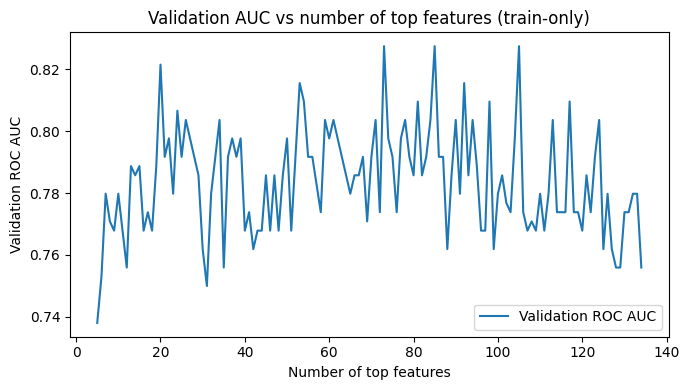


Final model (selected by validation AUC):
Top-N features: 73
Best params: {'n_estimators': 230, 'learning_rate': 0.15512423369998138, 'max_depth': 9, 'min_child_weight': 2, 'subsample': 0.6187587025279929, 'colsample_bytree': 0.651565417267076, 'gamma': 2.6420869511057434, 'reg_alpha': 0.32962705629337186, 'reg_lambda': 1.1679839915499686}

Test performance:
Accuracy: 0.6061
Precision:0.6471
Recall:   0.6111
F1 score: 0.6286
ROC AUC:  0.7259


In [ ]:
results = []
best_params_per_n = {}

# iterate from top 5 features up to all
for n in range(5, len(feat_imp) + 1):
    top_feats = feat_imp["feature"].head(n).tolist()

    # Split
    X_tr, X_val, y_tr, y_val = train_test_split(
        X_train[top_feats], y_train, test_size=0.2, random_state=42, stratify=y_train
    )

    # Define objective
    def objective(trial):
        params = {
            "objective": "binary:logistic",
            "eval_metric": "auc",
            "tree_method": "hist",
            "random_state": 42,
            "n_estimators": trial.suggest_int("n_estimators", 20, 250),
            "learning_rate": trial.suggest_float("learning_rate", 0.01, 0.3, log=True),
            "max_depth": trial.suggest_int("max_depth", 3, 10),
            "min_child_weight": trial.suggest_int("min_child_weight", 1, 20),
            "subsample": trial.suggest_float("subsample", 0.6, 1.0),
            "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
            "gamma": trial.suggest_float("gamma", 0.0, 5.0),
            "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),
            "reg_lambda": trial.suggest_float("reg_lambda", 0.5, 3.0),
        }

        model = xgb.XGBClassifier(**params, n_jobs=-1)
        model.fit(
            X_tr, y_tr,
            eval_set=[(X_val, y_val)],
            verbose=False
        )

        y_prob_val = model.predict_proba(X_val)[:, 1]
        auc_val = roc_auc_score(y_val, y_prob_val)
        return auc_val

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=200)

    # store best per-N
    best_val_auc = study.best_value
    results.append((n, best_val_auc))
    best_params_per_n[n] = study.best_trial.params

res_df = pd.DataFrame(results, columns=["Top_N", "Val_ROC_AUC"])

# Pick best N by validation AUC
best_row = res_df.iloc[res_df["Val_ROC_AUC"].idxmax()]
best_n = int(best_row.Top_N)
best_val_auc = float(best_row.Val_ROC_AUC)
print(f"\nBest number of features by VAL AUC: {best_n} (Val ROC AUC = {best_val_auc:.4f})")

# Plot validation AUC curve vs N
plt.figure(figsize=(7, 4))
plt.plot(res_df["Top_N"], res_df["Val_ROC_AUC"], label="Validation ROC AUC")
plt.xlabel("Number of top features")
plt.ylabel("Validation ROC AUC")
plt.title("Validation AUC vs number of top features (train-only)")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

# Final training
selected_features = feat_imp["feature"].head(best_n).tolist()
X_train_sel = X_train[selected_features].copy()
X_test_sel  = X_test[selected_features].copy()

best_params = best_params_per_n[best_n]
final_model = xgb.XGBClassifier(
    **best_params,
    objective="binary:logistic",
    eval_metric="auc",
    tree_method="hist",
    random_state=42,
    n_jobs=-1,
)
final_model.fit(X_train_sel, y_train)

# Final test evaluation
y_prob_test = final_model.predict_proba(X_test_sel)[:, 1]
y_pred_test = final_model.predict(X_test_sel)

acc = accuracy_score(y_test, y_pred_test)
prec = precision_score(y_test, y_pred_test, zero_division=0)
rec = recall_score(y_test, y_pred_test, zero_division=0)
f1 = f1_score(y_test, y_pred_test, zero_division=0)
auc = roc_auc_score(y_test, y_prob_test)

print("\nFinal model (selected by validation AUC):")
print(f"Top-N features: {best_n}")
print("Best params:", best_params)
print("\nTest performance:")
print(f"Accuracy: {acc:.4f}")
print(f"Precision: {prec:.4f}")
print(f"Recall: {rec:.4f}")
print(f"F1 score: {f1:.4f}")
print(f"ROC AUC: {auc:.4f}")

In [ ]:
# Pick top features
top_feats = feat_imp["feature"].head(40).tolist()

def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 20, 200),
        "max_depth": trial.suggest_int("max_depth", 2, 8),
        "learning_rate": trial.suggest_float("learning_rate", 0.05, 0.3, log=True),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0, 5),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 20),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.1, 10.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.1, 10.0),
        "random_state": 42,
        "n_jobs": -1,
        "tree_method": "hist",
        "eval_metric": "logloss",
    }

    model = xgb.XGBClassifier(**params)
    model.fit(X_train[top_feats], y_train)

    preds = model.predict(X_test[top_feats])
    f1 = f1_score(y_test, preds)
    return f1

# Run optimization
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=400, show_progress_bar=True)

print("Best F1 Score:", study.best_value)
print("Best Hyperparameters:", study.best_params)

# Train final model
best_params = study.best_params
final_model = xgb.XGBClassifier(**best_params)
final_model.fit(X_train[top_feats], y_train)

y_pred = final_model.predict(X_test[top_feats])
y_prob = final_model.predict_proba(X_test[top_feats])[:, 1]

print("\nFinal Model Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("F1:", f1_score(y_test, y_pred))
print("ROC AUC:", roc_auc_score(y_test, y_prob))

[I 2025-11-04 01:47:38,656] A new study created in memory with name: no-name-a32548d2-e8df-4a5e-bdff-35f59338891a
Best trial: 2. Best value: 0.666667:   1%|          | 3/400 [00:00<00:34, 11.53it/s]

[I 2025-11-04 01:47:38,801] Trial 0 finished with value: 0.6190476190476191 and parameters: {'n_estimators': 55, 'max_depth': 6, 'learning_rate': 0.15180369500862914, 'subsample': 0.6671066096124675, 'colsample_bytree': 0.5665971862649747, 'gamma': 2.679311831484833, 'min_child_weight': 6, 'reg_alpha': 6.177138053098082, 'reg_lambda': 9.90124444881563}. Best is trial 0 with value: 0.6190476190476191.
[I 2025-11-04 01:47:38,849] Trial 1 finished with value: 0.6341463414634146 and parameters: {'n_estimators': 56, 'max_depth': 3, 'learning_rate': 0.10291721343160923, 'subsample': 0.6352762672734866, 'colsample_bytree': 0.7140921368832822, 'gamma': 3.28614204803171, 'min_child_weight': 6, 'reg_alpha': 6.203059837060149, 'reg_lambda': 3.448047393278112}. Best is trial 1 with value: 0.6341463414634146.
[I 2025-11-04 01:47:38,933] Trial 2 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 77, 'max_depth': 5, 'learning_rate': 0.10607911789567682, 'subsample': 0.8636487029

Best trial: 2. Best value: 0.666667:   1%|▏         | 5/400 [00:00<00:33, 11.71it/s]

[I 2025-11-04 01:47:39,102] Trial 4 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 146, 'max_depth': 4, 'learning_rate': 0.0685401649188603, 'subsample': 0.6492421134108202, 'colsample_bytree': 0.6187049804442597, 'gamma': 3.0836291041055324, 'min_child_weight': 11, 'reg_alpha': 1.2934188973127025, 'reg_lambda': 1.2055418139808616}. Best is trial 2 with value: 0.6666666666666666.
[I 2025-11-04 01:47:39,211] Trial 5 finished with value: 0.65 and parameters: {'n_estimators': 186, 'max_depth': 2, 'learning_rate': 0.06318733100825935, 'subsample': 0.6236863842517673, 'colsample_bytree': 0.5263715388863603, 'gamma': 0.24175723778642189, 'min_child_weight': 4, 'reg_alpha': 8.520832980744515, 'reg_lambda': 0.3029777093933287}. Best is trial 2 with value: 0.6666666666666666.


Best trial: 9. Best value: 0.705882:   2%|▏         | 9/400 [00:00<00:38, 10.10it/s]

[I 2025-11-04 01:47:39,441] Trial 6 finished with value: 0.6046511627906976 and parameters: {'n_estimators': 187, 'max_depth': 6, 'learning_rate': 0.24159003431445153, 'subsample': 0.6872603581372807, 'colsample_bytree': 0.8703970992003702, 'gamma': 2.7206659216961624, 'min_child_weight': 8, 'reg_alpha': 9.288821468944876, 'reg_lambda': 0.5814446718697885}. Best is trial 2 with value: 0.6666666666666666.
[I 2025-11-04 01:47:39,514] Trial 7 finished with value: 0.6341463414634146 and parameters: {'n_estimators': 113, 'max_depth': 7, 'learning_rate': 0.15347170325093476, 'subsample': 0.8597225853324029, 'colsample_bytree': 0.5689593445007661, 'gamma': 4.927824619964439, 'min_child_weight': 10, 'reg_alpha': 5.309640508416411, 'reg_lambda': 7.54545825815218}. Best is trial 2 with value: 0.6666666666666666.
[I 2025-11-04 01:47:39,567] Trial 8 finished with value: 0.6486486486486487 and parameters: {'n_estimators': 100, 'max_depth': 2, 'learning_rate': 0.09308108713772287, 'subsample': 0.886

Best trial: 9. Best value: 0.705882:   3%|▎         | 13/400 [00:01<00:33, 11.46it/s]

[I 2025-11-04 01:47:39,676] Trial 10 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 22, 'max_depth': 8, 'learning_rate': 0.2955179796562885, 'subsample': 0.7589147099604817, 'colsample_bytree': 0.6485215799035278, 'gamma': 1.41083091501951, 'min_child_weight': 20, 'reg_alpha': 3.707791976856077, 'reg_lambda': 5.944865942341352}. Best is trial 9 with value: 0.7058823529411765.
[I 2025-11-04 01:47:39,829] Trial 11 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 38, 'max_depth': 8, 'learning_rate': 0.29336227525935693, 'subsample': 0.7584147131243284, 'colsample_bytree': 0.9900593913182645, 'gamma': 1.3391016686064605, 'min_child_weight': 20, 'reg_alpha': 3.49438428307184, 'reg_lambda': 6.058905851364849}. Best is trial 9 with value: 0.7058823529411765.
[I 2025-11-04 01:47:39,865] Trial 12 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 22, 'max_depth': 8, 'learning_rate': 0.21505790933090924, 'subsample': 0.76351

Best trial: 9. Best value: 0.705882:   4%|▍         | 16/400 [00:01<00:33, 11.46it/s]

[I 2025-11-04 01:47:39,959] Trial 13 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 133, 'max_depth': 5, 'learning_rate': 0.29291628406633763, 'subsample': 0.7299984938649401, 'colsample_bytree': 0.6442425336148813, 'gamma': 1.4661503026638978, 'min_child_weight': 16, 'reg_alpha': 0.27546267423785853, 'reg_lambda': 3.3223754549746216}. Best is trial 9 with value: 0.7058823529411765.
[I 2025-11-04 01:47:40,041] Trial 14 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 154, 'max_depth': 4, 'learning_rate': 0.20749196765821615, 'subsample': 0.8038964468777744, 'colsample_bytree': 0.5116110472075952, 'gamma': 1.8786675835139919, 'min_child_weight': 16, 'reg_alpha': 2.2505506667744553, 'reg_lambda': 7.1517028827380695}. Best is trial 9 with value: 0.7058823529411765.
[I 2025-11-04 01:47:40,069] Trial 15 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 20, 'max_depth': 7, 'learning_rate': 0.17797658290937732, 'subsampl

Best trial: 9. Best value: 0.705882:   5%|▌         | 20/400 [00:01<00:28, 13.45it/s]

[I 2025-11-04 01:47:40,208] Trial 17 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 118, 'max_depth': 3, 'learning_rate': 0.1816446975073413, 'subsample': 0.7061676235697107, 'colsample_bytree': 0.5779792215285215, 'gamma': 0.7909265182830989, 'min_child_weight': 14, 'reg_alpha': 0.4985955791509076, 'reg_lambda': 8.073393661066014}. Best is trial 9 with value: 0.7058823529411765.
[I 2025-11-04 01:47:40,314] Trial 18 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 162, 'max_depth': 6, 'learning_rate': 0.24996098182068385, 'subsample': 0.7642934724116002, 'colsample_bytree': 0.5075965744916406, 'gamma': 2.137646479249816, 'min_child_weight': 14, 'reg_alpha': 3.2635867058939527, 'reg_lambda': 1.9456544189286475}. Best is trial 9 with value: 0.7058823529411765.
[I 2025-11-04 01:47:40,357] Trial 19 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 43, 'max_depth': 4, 'learning_rate': 0.07638306715671332, 'subsample': 

Best trial: 9. Best value: 0.705882:   6%|▋         | 25/400 [00:02<00:24, 15.01it/s]

[I 2025-11-04 01:47:40,481] Trial 21 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 37, 'max_depth': 8, 'learning_rate': 0.29044413036889044, 'subsample': 0.757752559956019, 'colsample_bytree': 0.8928436539340026, 'gamma': 1.4631590575472115, 'min_child_weight': 20, 'reg_alpha': 3.619362957943457, 'reg_lambda': 5.7057736031988595}. Best is trial 9 with value: 0.7058823529411765.
[I 2025-11-04 01:47:40,544] Trial 22 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 35, 'max_depth': 8, 'learning_rate': 0.2879906865107709, 'subsample': 0.7289345964962729, 'colsample_bytree': 0.9955300434407902, 'gamma': 1.7436205423418265, 'min_child_weight': 18, 'reg_alpha': 4.956070809023675, 'reg_lambda': 4.548201433126302}. Best is trial 9 with value: 0.7058823529411765.
[I 2025-11-04 01:47:40,593] Trial 23 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 60, 'max_depth': 7, 'learning_rate': 0.2209049006372705, 'subsample': 0.775

Best trial: 26. Best value: 0.717949:   7%|▋         | 29/400 [00:02<00:24, 15.23it/s]

[I 2025-11-04 01:47:40,761] Trial 26 finished with value: 0.717948717948718 and parameters: {'n_estimators': 126, 'max_depth': 7, 'learning_rate': 0.2973401002110323, 'subsample': 0.7818344828256311, 'colsample_bytree': 0.9222143582968345, 'gamma': 0.5833009152279149, 'min_child_weight': 13, 'reg_alpha': 5.802557811175327, 'reg_lambda': 5.037710858370973}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:40,848] Trial 27 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 130, 'max_depth': 7, 'learning_rate': 0.2019273211312053, 'subsample': 0.7884060115838536, 'colsample_bytree': 0.9153657348867287, 'gamma': 0.5415676509665281, 'min_child_weight': 12, 'reg_alpha': 7.81889933677129, 'reg_lambda': 2.5104607448613985}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:40,907] Trial 28 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 104, 'max_depth': 5, 'learning_rate': 0.1512078735231222, 'subsample': 0.68

[I 2025-11-04 01:47:40,982] Trial 29 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 173, 'max_depth': 6, 'learning_rate': 0.14441767774140724, 'subsample': 0.6628721422061785, 'colsample_bytree': 0.7255075547175986, 'gamma': 0.5000892931948675, 'min_child_weight': 9, 'reg_alpha': 7.279399098638457, 'reg_lambda': 5.076246632638496}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:41,097] Trial 30 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 129, 'max_depth': 7, 'learning_rate': 0.24689958549859156, 'subsample': 0.6076835665314956, 'colsample_bytree': 0.6143737735159912, 'gamma': 2.3586963181689113, 'min_child_weight': 15, 'reg_alpha': 5.803496853557384, 'reg_lambda': 1.5155917093759181}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:41,141] Trial 31 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 48, 'max_depth': 8, 'learning_rate': 0.2978372035876782, 'subsample': 0.

Best trial: 26. Best value: 0.717949:   9%|▉         | 35/400 [00:02<00:24, 14.66it/s]

[I 2025-11-04 01:47:41,184] Trial 32 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 63, 'max_depth': 8, 'learning_rate': 0.26928858153711244, 'subsample': 0.7858557653815618, 'colsample_bytree': 0.9341612424354351, 'gamma': 1.1365647143172972, 'min_child_weight': 17, 'reg_alpha': 6.687473672071734, 'reg_lambda': 3.874842359641021}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:41,276] Trial 33 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 90, 'max_depth': 8, 'learning_rate': 0.22126767765559213, 'subsample': 0.7110036063877012, 'colsample_bytree': 0.8757910022885291, 'gamma': 1.9869541528474828, 'min_child_weight': 19, 'reg_alpha': 4.615477496883067, 'reg_lambda': 5.784112512821604}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:41,326] Trial 34 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 79, 'max_depth': 7, 'learning_rate': 0.2349575768198573, 'subsample': 0.75

Best trial: 26. Best value: 0.717949:  10%|▉         | 39/400 [00:02<00:22, 15.73it/s]

[I 2025-11-04 01:47:41,472] Trial 36 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 143, 'max_depth': 6, 'learning_rate': 0.19516449264546212, 'subsample': 0.7440418317316964, 'colsample_bytree': 0.9767799290224136, 'gamma': 0.5432413411423388, 'min_child_weight': 20, 'reg_alpha': 5.321385179927016, 'reg_lambda': 7.631818884136443}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:41,541] Trial 37 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 72, 'max_depth': 3, 'learning_rate': 0.10728254777937538, 'subsample': 0.6945322686741466, 'colsample_bytree': 0.5475568285621745, 'gamma': 2.1070493608217378, 'min_child_weight': 18, 'reg_alpha': 2.577207227037797, 'reg_lambda': 3.8035065601719533}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:41,576] Trial 38 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 29, 'max_depth': 5, 'learning_rate': 0.2781180758604725, 'subsample': 0.

Best trial: 26. Best value: 0.717949:  10%|█         | 42/400 [00:03<00:26, 13.39it/s]

[I 2025-11-04 01:47:41,698] Trial 39 finished with value: 0.5714285714285714 and parameters: {'n_estimators': 117, 'max_depth': 7, 'learning_rate': 0.23375755585020816, 'subsample': 0.8800914494809069, 'colsample_bytree': 0.7645821008751797, 'gamma': 0.0059549069884820005, 'min_child_weight': 1, 'reg_alpha': 2.1229211104402985, 'reg_lambda': 0.9423396614395891}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:41,789] Trial 40 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 100, 'max_depth': 8, 'learning_rate': 0.13168991579052244, 'subsample': 0.7886800443693527, 'colsample_bytree': 0.8494802539263029, 'gamma': 3.387946125600478, 'min_child_weight': 15, 'reg_alpha': 5.624066789160321, 'reg_lambda': 2.5894260479375912}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:41,819] Trial 41 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 29, 'max_depth': 8, 'learning_rate': 0.29877666365407674, 'subsample

Best trial: 26. Best value: 0.717949:  12%|█▏        | 46/400 [00:03<00:22, 15.77it/s]

[I 2025-11-04 01:47:41,914] Trial 43 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 51, 'max_depth': 4, 'learning_rate': 0.26349366298560367, 'subsample': 0.7937162268000526, 'colsample_bytree': 0.6506485077044625, 'gamma': 1.749618372959609, 'min_child_weight': 20, 'reg_alpha': 6.227834843457098, 'reg_lambda': 4.9013571518655565}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:41,979] Trial 44 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 20, 'max_depth': 7, 'learning_rate': 0.20600869941247002, 'subsample': 0.7661610072442396, 'colsample_bytree': 0.7325745086108878, 'gamma': 0.38326093893192326, 'min_child_weight': 17, 'reg_alpha': 4.082159605415321, 'reg_lambda': 7.144301428474032}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:42,044] Trial 45 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 142, 'max_depth': 8, 'learning_rate': 0.16670394673138736, 'subsample': 0

Best trial: 26. Best value: 0.717949:  12%|█▏        | 48/400 [00:03<00:24, 14.48it/s]

[I 2025-11-04 01:47:42,125] Trial 46 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 196, 'max_depth': 2, 'learning_rate': 0.23513417616546858, 'subsample': 0.7147341243949146, 'colsample_bytree': 0.6039296371083451, 'gamma': 4.826781686162365, 'min_child_weight': 18, 'reg_alpha': 3.5490603065715454, 'reg_lambda': 5.853866765904893}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:42,213] Trial 47 finished with value: 0.5882352941176471 and parameters: {'n_estimators': 121, 'max_depth': 7, 'learning_rate': 0.27421926945066255, 'subsample': 0.7427029851643858, 'colsample_bytree': 0.704235798591289, 'gamma': 1.9214187365376576, 'min_child_weight': 10, 'reg_alpha': 1.800181041131169, 'reg_lambda': 4.086851554643596}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:42,258] Trial 48 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 45, 'max_depth': 8, 'learning_rate': 0.0877116932772677, 'subsample': 0.6

Best trial: 26. Best value: 0.717949:  13%|█▎        | 52/400 [00:03<00:26, 13.29it/s]

[I 2025-11-04 01:47:42,330] Trial 49 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 167, 'max_depth': 3, 'learning_rate': 0.2518196582241304, 'subsample': 0.7782948111551076, 'colsample_bytree': 0.784677722487201, 'gamma': 3.050851428648146, 'min_child_weight': 16, 'reg_alpha': 2.7824327708371803, 'reg_lambda': 7.880115027575188}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:42,414] Trial 50 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 35, 'max_depth': 7, 'learning_rate': 0.21837215460502474, 'subsample': 0.8290558610488786, 'colsample_bytree': 0.6589362393663911, 'gamma': 0.9256548236476915, 'min_child_weight': 15, 'reg_alpha': 1.006800124767022, 'reg_lambda': 4.768785158967413}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:42,525] Trial 51 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 133, 'max_depth': 5, 'learning_rate': 0.27979525120551785, 'subsample': 0.6

Best trial: 26. Best value: 0.717949:  14%|█▎        | 54/400 [00:04<00:31, 10.86it/s]

[I 2025-11-04 01:47:42,617] Trial 52 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 150, 'max_depth': 5, 'learning_rate': 0.29761293443070896, 'subsample': 0.7330868167706982, 'colsample_bytree': 0.5438340887229954, 'gamma': 1.4721240531074973, 'min_child_weight': 16, 'reg_alpha': 4.811805857575463, 'reg_lambda': 1.6848918102612251}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:42,792] Trial 53 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 108, 'max_depth': 4, 'learning_rate': 0.25287806765533505, 'subsample': 0.6799076375671799, 'colsample_bytree': 0.5960935431840126, 'gamma': 2.3500026746622877, 'min_child_weight': 20, 'reg_alpha': 3.357189249066529, 'reg_lambda': 5.336470992898658}. Best is trial 26 with value: 0.717948717948718.


Best trial: 26. Best value: 0.717949:  14%|█▍        | 56/400 [00:04<00:31, 10.86it/s]

[I 2025-11-04 01:47:42,891] Trial 54 finished with value: 0.5882352941176471 and parameters: {'n_estimators': 138, 'max_depth': 6, 'learning_rate': 0.2736579875721946, 'subsample': 0.7594481235798005, 'colsample_bytree': 0.6911665431165744, 'gamma': 0.774045585518373, 'min_child_weight': 13, 'reg_alpha': 0.596769429770916, 'reg_lambda': 3.4085754100325487}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:42,979] Trial 55 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 158, 'max_depth': 2, 'learning_rate': 0.19392070825157745, 'subsample': 0.8122690373082126, 'colsample_bytree': 0.7416910619346607, 'gamma': 1.716887964196169, 'min_child_weight': 18, 'reg_alpha': 1.7134793224824003, 'reg_lambda': 0.4536932273633941}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:43,048] Trial 56 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 124, 'max_depth': 8, 'learning_rate': 0.23755358454919587, 'subsample': 

Best trial: 26. Best value: 0.717949:  15%|█▌        | 60/400 [00:04<00:25, 13.22it/s]

[I 2025-11-04 01:47:43,105] Trial 57 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 94, 'max_depth': 3, 'learning_rate': 0.28133073618849647, 'subsample': 0.7179303767268105, 'colsample_bytree': 0.6315954971573001, 'gamma': 1.326061197523603, 'min_child_weight': 19, 'reg_alpha': 3.0392083370871834, 'reg_lambda': 7.015799558619122}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:43,187] Trial 58 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 112, 'max_depth': 7, 'learning_rate': 0.24986442515030483, 'subsample': 0.7613161325016237, 'colsample_bytree': 0.6629142250446293, 'gamma': 2.815642361065163, 'min_child_weight': 16, 'reg_alpha': 3.9384411394442846, 'reg_lambda': 4.3550321939590235}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:43,219] Trial 59 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 26, 'max_depth': 8, 'learning_rate': 0.29977927506838314, 'subsample': 0

Best trial: 62. Best value: 0.8:  16%|█▌        | 64/400 [00:04<00:25, 13.37it/s]     

[I 2025-11-04 01:47:43,353] Trial 61 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 178, 'max_depth': 4, 'learning_rate': 0.2081535913225715, 'subsample': 0.8065011437616078, 'colsample_bytree': 0.5256590998199523, 'gamma': 1.6438443881012714, 'min_child_weight': 15, 'reg_alpha': 1.1008971522680389, 'reg_lambda': 7.145447549981731}. Best is trial 26 with value: 0.717948717948718.
[I 2025-11-04 01:47:43,437] Trial 62 finished with value: 0.8 and parameters: {'n_estimators': 157, 'max_depth': 4, 'learning_rate': 0.26210625673636767, 'subsample': 0.8552617560472509, 'colsample_bytree': 0.5038846620392105, 'gamma': 2.0114984841585324, 'min_child_weight': 14, 'reg_alpha': 1.3913329001216268, 'reg_lambda': 6.506601749982799}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:43,510] Trial 63 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 147, 'max_depth': 4, 'learning_rate': 0.2598187953933091, 'subsample': 0.8639112774539018, 'colsampl

Best trial: 62. Best value: 0.8:  16%|█▋        | 66/400 [00:05<00:29, 11.48it/s]

[I 2025-11-04 01:47:43,604] Trial 64 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 163, 'max_depth': 4, 'learning_rate': 0.2617491456681163, 'subsample': 0.9189615240226091, 'colsample_bytree': 0.5006865612738021, 'gamma': 1.896148195857424, 'min_child_weight': 14, 'reg_alpha': 1.3899970248990083, 'reg_lambda': 6.706936913723939}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:43,742] Trial 65 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 150, 'max_depth': 4, 'learning_rate': 0.26066126956492325, 'subsample': 0.920495427264128, 'colsample_bytree': 0.5082004541586628, 'gamma': 1.9052694668227004, 'min_child_weight': 12, 'reg_alpha': 0.6088012274880172, 'reg_lambda': 7.505405686684633}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  17%|█▋        | 68/400 [00:05<00:28, 11.81it/s]

[I 2025-11-04 01:47:43,816] Trial 66 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 167, 'max_depth': 4, 'learning_rate': 0.23685488172352476, 'subsample': 0.9171371376468981, 'colsample_bytree': 0.5013686945697904, 'gamma': 2.5815404432415567, 'min_child_weight': 14, 'reg_alpha': 1.941608454838824, 'reg_lambda': 6.605799543189611}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:43,898] Trial 67 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 167, 'max_depth': 4, 'learning_rate': 0.22841586227181895, 'subsample': 0.9294467781604424, 'colsample_bytree': 0.5007024976494027, 'gamma': 2.5869020598788612, 'min_child_weight': 14, 'reg_alpha': 1.268971508677352, 'reg_lambda': 6.694694439380808}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:43,982] Trial 68 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 181, 'max_depth': 4, 'learning_rate': 0.1678574719214467, 'subsample': 0.8945498606315571, 'colsampl

Best trial: 62. Best value: 0.8:  18%|█▊        | 72/400 [00:05<00:28, 11.69it/s]

[I 2025-11-04 01:47:44,074] Trial 69 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 162, 'max_depth': 3, 'learning_rate': 0.24878360865224214, 'subsample': 0.9500593408143987, 'colsample_bytree': 0.5779460757717072, 'gamma': 3.0700791163807826, 'min_child_weight': 14, 'reg_alpha': 1.4777132025406194, 'reg_lambda': 7.48210790415253}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:44,178] Trial 70 finished with value: 0.6285714285714286 and parameters: {'n_estimators': 194, 'max_depth': 4, 'learning_rate': 0.2686567783309817, 'subsample': 0.8768326544748041, 'colsample_bytree': 0.5323851952315555, 'gamma': 2.2812911897825283, 'min_child_weight': 10, 'reg_alpha': 0.7473274380296555, 'reg_lambda': 8.246947507589125}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:44,246] Trial 71 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 154, 'max_depth': 5, 'learning_rate': 0.2416076567483839, 'subsample': 0.8539169445388901, 'colsampl

Best trial: 62. Best value: 0.8:  18%|█▊        | 74/400 [00:05<00:29, 11.14it/s]

[I 2025-11-04 01:47:44,353] Trial 72 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 171, 'max_depth': 3, 'learning_rate': 0.2828720823751068, 'subsample': 0.9017505573949206, 'colsample_bytree': 0.5187098183530827, 'gamma': 2.025709403220252, 'min_child_weight': 11, 'reg_alpha': 2.1124232398200764, 'reg_lambda': 5.9497832289259405}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:44,445] Trial 73 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 162, 'max_depth': 5, 'learning_rate': 0.26136255583332024, 'subsample': 0.980455248609891, 'colsample_bytree': 0.5344100705652349, 'gamma': 2.45866350773521, 'min_child_weight': 14, 'reg_alpha': 1.3657244660309256, 'reg_lambda': 6.52373315347845}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:44,520] Trial 74 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 154, 'max_depth': 2, 'learning_rate': 0.2878729743588686, 'subsample': 0.9422216565074713, 'colsample_b

Best trial: 62. Best value: 0.8:  19%|█▉        | 76/400 [00:06<00:29, 11.02it/s]

[I 2025-11-04 01:47:44,631] Trial 75 finished with value: 0.6857142857142857 and parameters: {'n_estimators': 186, 'max_depth': 4, 'learning_rate': 0.11370969966106394, 'subsample': 0.8644789414512685, 'colsample_bytree': 0.9979163690888541, 'gamma': 1.8133291064918782, 'min_child_weight': 9, 'reg_alpha': 1.9998400358853992, 'reg_lambda': 6.840324129532773}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:44,742] Trial 76 finished with value: 0.6486486486486487 and parameters: {'n_estimators': 138, 'max_depth': 4, 'learning_rate': 0.24103239224125536, 'subsample': 0.9062654942348908, 'colsample_bytree': 0.5759334384864192, 'gamma': 2.4572121763604216, 'min_child_weight': 14, 'reg_alpha': 2.6543245940512854, 'reg_lambda': 6.281274258227336}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  20%|█▉        | 78/400 [00:06<00:30, 10.43it/s]

[I 2025-11-04 01:47:44,847] Trial 77 finished with value: 0.6285714285714286 and parameters: {'n_estimators': 146, 'max_depth': 3, 'learning_rate': 0.1903859509778702, 'subsample': 0.9285640921160784, 'colsample_bytree': 0.5556806203225966, 'gamma': 2.914826873436899, 'min_child_weight': 13, 'reg_alpha': 7.193932101791524, 'reg_lambda': 9.726273079758244}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:44,943] Trial 78 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 177, 'max_depth': 4, 'learning_rate': 0.2144105892575016, 'subsample': 0.8406473797253948, 'colsample_bytree': 0.5176952147143481, 'gamma': 3.381171828722806, 'min_child_weight': 15, 'reg_alpha': 0.828588391795971, 'reg_lambda': 7.38715191253117}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  20%|██        | 82/400 [00:06<00:31, 10.00it/s]

[I 2025-11-04 01:47:45,170] Trial 79 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 126, 'max_depth': 5, 'learning_rate': 0.2616249778870887, 'subsample': 0.9665696077163421, 'colsample_bytree': 0.5376221824989036, 'gamma': 2.0280786497047085, 'min_child_weight': 12, 'reg_alpha': 1.2202223081907668, 'reg_lambda': 5.23150836713901}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:45,261] Trial 80 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 158, 'max_depth': 2, 'learning_rate': 0.28471460367562834, 'subsample': 0.8667851795659828, 'colsample_bytree': 0.5937541786504721, 'gamma': 1.6229937853713545, 'min_child_weight': 17, 'reg_alpha': 0.33024162056317286, 'reg_lambda': 7.873768135715129}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:45,298] Trial 81 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 24, 'max_depth': 8, 'learning_rate': 0.22604604836682823, 'subsample': 0.8935030453227467, 'colsamp

Best trial: 62. Best value: 0.8:  22%|██▏       | 87/400 [00:06<00:23, 13.61it/s]

[I 2025-11-04 01:47:45,384] Trial 83 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 31, 'max_depth': 4, 'learning_rate': 0.2558484861666631, 'subsample': 0.7687872217951824, 'colsample_bytree': 0.8850242130690898, 'gamma': 1.905607714328314, 'min_child_weight': 19, 'reg_alpha': 2.273657113327386, 'reg_lambda': 6.629014460496865}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:45,441] Trial 84 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 20, 'max_depth': 5, 'learning_rate': 0.23234761636540577, 'subsample': 0.9144776801609473, 'colsample_bytree': 0.9796109952650809, 'gamma': 0.8864484984901924, 'min_child_weight': 18, 'reg_alpha': 2.9034907135315633, 'reg_lambda': 5.5316184230741845}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:45,509] Trial 85 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 167, 'max_depth': 8, 'learning_rate': 0.21191742034629987, 'subsample': 0.7387856454499914, 'colsample

Best trial: 62. Best value: 0.8:  23%|██▎       | 91/400 [00:07<00:22, 13.98it/s]

[I 2025-11-04 01:47:45,662] Trial 87 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 136, 'max_depth': 3, 'learning_rate': 0.24209149243592132, 'subsample': 0.7843164285870616, 'colsample_bytree': 0.5459347752929258, 'gamma': 1.5287339833221645, 'min_child_weight': 19, 'reg_alpha': 3.612578918051431, 'reg_lambda': 5.979118708720326}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:45,735] Trial 88 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 77, 'max_depth': 8, 'learning_rate': 0.26829626618921437, 'subsample': 0.8781214296895563, 'colsample_bytree': 0.9036228072090965, 'gamma': 1.2247289255609535, 'min_child_weight': 20, 'reg_alpha': 0.3595713027102126, 'reg_lambda': 7.012668593367117}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:45,797] Trial 89 finished with value: 0.5882352941176471 and parameters: {'n_estimators': 148, 'max_depth': 6, 'learning_rate': 0.13779471999392287, 'subsample': 0.8164045931538016, 'colsamp

Best trial: 62. Best value: 0.8:  23%|██▎       | 93/400 [00:07<00:24, 12.78it/s]

[I 2025-11-04 01:47:45,948] Trial 91 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 141, 'max_depth': 4, 'learning_rate': 0.29875994582368165, 'subsample': 0.755208806602784, 'colsample_bytree': 0.6407460717215697, 'gamma': 1.5903530033450146, 'min_child_weight': 18, 'reg_alpha': 1.568994807432061, 'reg_lambda': 4.0843929453708085}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:46,035] Trial 92 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 128, 'max_depth': 7, 'learning_rate': 0.2755095761243871, 'subsample': 0.7383312597147911, 'colsample_bytree': 0.854605071010175, 'gamma': 2.128594855596957, 'min_child_weight': 16, 'reg_alpha': 0.15477611136187935, 'reg_lambda': 5.364805928068895}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:46,096] Trial 93 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 131, 'max_depth': 4, 'learning_rate': 0.28934330388943585, 'subsample': 0.7729365913378677, 'colsampl

Best trial: 62. Best value: 0.8:  24%|██▍       | 97/400 [00:07<00:23, 13.02it/s]

[I 2025-11-04 01:47:46,156] Trial 94 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 42, 'max_depth': 8, 'learning_rate': 0.2524905701198748, 'subsample': 0.7504089300694458, 'colsample_bytree': 0.9648599179523947, 'gamma': 1.4333320078878726, 'min_child_weight': 19, 'reg_alpha': 8.277826310912566, 'reg_lambda': 2.727377478074885}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:46,259] Trial 95 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 120, 'max_depth': 5, 'learning_rate': 0.20112347398438543, 'subsample': 0.7618519908556628, 'colsample_bytree': 0.6082908537102736, 'gamma': 0.12594052896518132, 'min_child_weight': 15, 'reg_alpha': 1.1474072563992632, 'reg_lambda': 6.315115758655772}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:46,327] Trial 96 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 156, 'max_depth': 7, 'learning_rate': 0.07333577510895224, 'subsample': 0.7109175038993624, 'colsamp

Best trial: 62. Best value: 0.8:  25%|██▍       | 99/400 [00:07<00:25, 11.95it/s]

[I 2025-11-04 01:47:46,435] Trial 97 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 144, 'max_depth': 8, 'learning_rate': 0.26155119945385097, 'subsample': 0.7226924875884448, 'colsample_bytree': 0.6652652312634995, 'gamma': 2.257235119155556, 'min_child_weight': 17, 'reg_alpha': 4.6626349067503, 'reg_lambda': 4.852856258707563}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:46,527] Trial 98 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 172, 'max_depth': 4, 'learning_rate': 0.2771967585592756, 'subsample': 0.9350634428970633, 'colsample_bytree': 0.8159853323622132, 'gamma': 4.324633486336875, 'min_child_weight': 20, 'reg_alpha': 1.8619283448331756, 'reg_lambda': 5.599442414448447}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:46,590] Trial 99 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 133, 'max_depth': 5, 'learning_rate': 0.22458300503570244, 'subsample': 0.7912042482571947, 'colsample_b

Best trial: 62. Best value: 0.8:  26%|██▌       | 103/400 [00:08<00:22, 12.97it/s]

[I 2025-11-04 01:47:46,638] Trial 100 finished with value: 0.6486486486486487 and parameters: {'n_estimators': 48, 'max_depth': 6, 'learning_rate': 0.24536955062061286, 'subsample': 0.8331081844556977, 'colsample_bytree': 0.7604981178358544, 'gamma': 1.796809187990415, 'min_child_weight': 13, 'reg_alpha': 5.181442343748303, 'reg_lambda': 0.6872846552238061}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:46,735] Trial 101 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 115, 'max_depth': 4, 'learning_rate': 0.2998046586520739, 'subsample': 0.8549208361438633, 'colsample_bytree': 0.5129685102894483, 'gamma': 1.885013177888854, 'min_child_weight': 16, 'reg_alpha': 2.273384553241207, 'reg_lambda': 7.200986701155308}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:46,801] Trial 102 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 152, 'max_depth': 4, 'learning_rate': 0.18800487356430612, 'subsample': 0.8048935818097274, 'colsamp

Best trial: 62. Best value: 0.8:  26%|██▋       | 105/400 [00:08<00:27, 10.64it/s]

[I 2025-11-04 01:47:46,911] Trial 103 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 160, 'max_depth': 4, 'learning_rate': 0.23013703137690691, 'subsample': 0.776424011456795, 'colsample_bytree': 0.5285075822245512, 'gamma': 2.3608040537927826, 'min_child_weight': 15, 'reg_alpha': 3.8084651875835194, 'reg_lambda': 7.7514505796071465}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:47,068] Trial 104 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 164, 'max_depth': 3, 'learning_rate': 0.16975566489383706, 'subsample': 0.7334978353780591, 'colsample_bytree': 0.5697187040703766, 'gamma': 1.1045909999941328, 'min_child_weight': 16, 'reg_alpha': 0.7552977970202477, 'reg_lambda': 6.595569235093691}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  27%|██▋       | 107/400 [00:08<00:28, 10.35it/s]

[I 2025-11-04 01:47:47,164] Trial 105 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 84, 'max_depth': 4, 'learning_rate': 0.28895307247194846, 'subsample': 0.7453149569027435, 'colsample_bytree': 0.5426785323077857, 'gamma': 2.0935140489239883, 'min_child_weight': 14, 'reg_alpha': 2.02878758920588, 'reg_lambda': 6.103240119082755}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:47,273] Trial 106 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 106, 'max_depth': 2, 'learning_rate': 0.20131869004536926, 'subsample': 0.7026801234277216, 'colsample_bytree': 0.5099764220101217, 'gamma': 1.6720793128712517, 'min_child_weight': 19, 'reg_alpha': 2.6911848241427165, 'reg_lambda': 6.4264134984610894}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:47,341] Trial 107 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 27, 'max_depth': 8, 'learning_rate': 0.2683737041267938, 'subsample': 0.7225245190007222, 'colsam

Best trial: 62. Best value: 0.8:  28%|██▊       | 111/400 [00:09<00:28, 10.23it/s]

[I 2025-11-04 01:47:47,513] Trial 108 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 149, 'max_depth': 3, 'learning_rate': 0.21711192863356907, 'subsample': 0.8895022352628648, 'colsample_bytree': 0.7834631342027611, 'gamma': 1.3520061474090608, 'min_child_weight': 16, 'reg_alpha': 1.0098248456191943, 'reg_lambda': 5.979080515167673}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:47,620] Trial 109 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 141, 'max_depth': 5, 'learning_rate': 0.2556754828481841, 'subsample': 0.8451105082030215, 'colsample_bytree': 0.6326857015397148, 'gamma': 1.9327484064057208, 'min_child_weight': 17, 'reg_alpha': 1.7090337873647536, 'reg_lambda': 8.455501356482225}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:47,679] Trial 110 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 123, 'max_depth': 4, 'learning_rate': 0.23863130807606361, 'subsample': 0.9998055116650276, 'col

Best trial: 62. Best value: 0.8:  29%|██▉       | 115/400 [00:09<00:22, 12.83it/s]

[I 2025-11-04 01:47:47,717] Trial 111 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 23, 'max_depth': 6, 'learning_rate': 0.17334687355800288, 'subsample': 0.9558553380472669, 'colsample_bytree': 0.6879487028804724, 'gamma': 0.6656983331926389, 'min_child_weight': 17, 'reg_alpha': 4.099969443769465, 'reg_lambda': 1.6807652299501816}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:47,789] Trial 112 finished with value: 0.6842105263157895 and parameters: {'n_estimators': 37, 'max_depth': 6, 'learning_rate': 0.1793794032214604, 'subsample': 0.9766983795254208, 'colsample_bytree': 0.518596177508459, 'gamma': 0.4800710737615582, 'min_child_weight': 15, 'reg_alpha': 4.761834094349096, 'reg_lambda': 2.83482475346789}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:47,855] Trial 113 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 20, 'max_depth': 7, 'learning_rate': 0.15371789394270904, 'subsample': 0.7674308323437498, 'colsample

Best trial: 62. Best value: 0.8:  29%|██▉       | 117/400 [00:09<00:26, 10.75it/s]

[I 2025-11-04 01:47:47,983] Trial 115 finished with value: 0.6842105263157895 and parameters: {'n_estimators': 33, 'max_depth': 5, 'learning_rate': 0.25075848194160827, 'subsample': 0.8718581802117652, 'colsample_bytree': 0.6492102691265562, 'gamma': 0.8068278024239744, 'min_child_weight': 14, 'reg_alpha': 6.147456919680509, 'reg_lambda': 3.1530492898579108}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:48,170] Trial 116 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 27, 'max_depth': 7, 'learning_rate': 0.20740483458451467, 'subsample': 0.7833070456924527, 'colsample_bytree': 0.7173657222952579, 'gamma': 0.9911570300807595, 'min_child_weight': 15, 'reg_alpha': 3.219163259920649, 'reg_lambda': 3.629815780349134}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  30%|██▉       | 119/400 [00:09<00:26, 10.43it/s]

[I 2025-11-04 01:47:48,276] Trial 117 finished with value: 0.6111111111111112 and parameters: {'n_estimators': 166, 'max_depth': 8, 'learning_rate': 0.263877106832468, 'subsample': 0.9175746096698514, 'colsample_bytree': 0.6004298446469882, 'gamma': 1.5804203462637185, 'min_child_weight': 2, 'reg_alpha': 3.4910241730516054, 'reg_lambda': 0.8693147603653211}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:48,376] Trial 118 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 156, 'max_depth': 4, 'learning_rate': 0.2905433431966559, 'subsample': 0.9037962726975285, 'colsample_bytree': 0.5487089598392232, 'gamma': 2.164398603593092, 'min_child_weight': 17, 'reg_alpha': 0.5541329733371054, 'reg_lambda': 0.18772890502909434}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:48,471] Trial 119 finished with value: 0.5882352941176471 and parameters: {'n_estimators': 170, 'max_depth': 5, 'learning_rate': 0.23464217296028556, 'subsample': 0.7572943153068, 'colsamp

Best trial: 62. Best value: 0.8:  31%|███       | 123/400 [00:10<00:25, 10.67it/s]

[I 2025-11-04 01:47:48,600] Trial 120 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 179, 'max_depth': 7, 'learning_rate': 0.2736465309981516, 'subsample': 0.6883797963964032, 'colsample_bytree': 0.7451433247991388, 'gamma': 1.1279177919175343, 'min_child_weight': 16, 'reg_alpha': 3.9734605040834485, 'reg_lambda': 6.213711451735388}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:48,695] Trial 121 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 61, 'max_depth': 7, 'learning_rate': 0.24555679641854564, 'subsample': 0.8021597105155799, 'colsample_bytree': 0.6184751335183744, 'gamma': 4.1561400574558185, 'min_child_weight': 18, 'reg_alpha': 3.735108444344971, 'reg_lambda': 5.198287424336706}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:48,754] Trial 122 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 92, 'max_depth': 7, 'learning_rate': 0.25741714718765746, 'subsample': 0.8141251393826303, 'colsam

Best trial: 62. Best value: 0.8:  32%|███▏      | 127/400 [00:10<00:21, 12.80it/s]

[I 2025-11-04 01:47:48,854] Trial 124 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 23, 'max_depth': 7, 'learning_rate': 0.2256915393014988, 'subsample': 0.7930602342550955, 'colsample_bytree': 0.5851052039784216, 'gamma': 4.785545228603904, 'min_child_weight': 19, 'reg_alpha': 1.5827229784452703, 'reg_lambda': 4.321136316606097}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:48,928] Trial 125 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 67, 'max_depth': 4, 'learning_rate': 0.29087533312214625, 'subsample': 0.7728251213341608, 'colsample_bytree': 0.6379282907028788, 'gamma': 1.7085367345733384, 'min_child_weight': 17, 'reg_alpha': 4.520618387972691, 'reg_lambda': 5.420107512314217}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:48,999] Trial 126 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 146, 'max_depth': 6, 'learning_rate': 0.12465353743396575, 'subsample': 0.8353921030589928, 'colsamp

Best trial: 62. Best value: 0.8:  33%|███▎      | 131/400 [00:10<00:19, 13.81it/s]

[I 2025-11-04 01:47:49,150] Trial 128 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 175, 'max_depth': 4, 'learning_rate': 0.24446574984897035, 'subsample': 0.8488146242942428, 'colsample_bytree': 0.5229554271804, 'gamma': 1.3806519506278845, 'min_child_weight': 20, 'reg_alpha': 1.9312244641902003, 'reg_lambda': 4.972106993071376}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:49,232] Trial 129 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 136, 'max_depth': 7, 'learning_rate': 0.2757152922023325, 'subsample': 0.7619238833664688, 'colsample_bytree': 0.9884334582064007, 'gamma': 1.5309653753632788, 'min_child_weight': 18, 'reg_alpha': 3.855136520190076, 'reg_lambda': 5.7593049305005435}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:49,272] Trial 130 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 44, 'max_depth': 8, 'learning_rate': 0.2818863880208241, 'subsample': 0.7812115381568252, 'colsampl

Best trial: 62. Best value: 0.8:  34%|███▍      | 135/400 [00:10<00:19, 13.84it/s]

[I 2025-11-04 01:47:49,424] Trial 132 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 117, 'max_depth': 3, 'learning_rate': 0.19568372668410527, 'subsample': 0.8857781982857467, 'colsample_bytree': 0.594286327199518, 'gamma': 0.8260865462642968, 'min_child_weight': 14, 'reg_alpha': 0.9408690624024352, 'reg_lambda': 8.026540852644974}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:49,501] Trial 133 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 96, 'max_depth': 2, 'learning_rate': 0.23038309690758066, 'subsample': 0.9418174702583696, 'colsample_bytree': 0.5740784740707415, 'gamma': 1.2035325086880266, 'min_child_weight': 14, 'reg_alpha': 1.1161079130232707, 'reg_lambda': 6.532256088247731}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:49,562] Trial 134 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 120, 'max_depth': 3, 'learning_rate': 0.15887971995347921, 'subsample': 0.7299833552384684, 'cols

Best trial: 62. Best value: 0.8:  34%|███▍      | 137/400 [00:11<00:20, 12.72it/s]

[I 2025-11-04 01:47:49,626] Trial 135 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 163, 'max_depth': 4, 'learning_rate': 0.2561554967733951, 'subsample': 0.9665489427964407, 'colsample_bytree': 0.5583700816951055, 'gamma': 0.5637991536897738, 'min_child_weight': 13, 'reg_alpha': 0.48707672912039457, 'reg_lambda': 7.62042064754741}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:49,749] Trial 136 finished with value: 0.631578947368421 and parameters: {'n_estimators': 128, 'max_depth': 3, 'learning_rate': 0.29951668046680296, 'subsample': 0.7372233795778232, 'colsample_bytree': 0.5441896958073613, 'gamma': 1.8925406325461736, 'min_child_weight': 7, 'reg_alpha': 0.13298813349796562, 'reg_lambda': 6.730594332812252}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:49,820] Trial 137 finished with value: 0.6857142857142857 and parameters: {'n_estimators': 153, 'max_depth': 4, 'learning_rate': 0.2111782709530494, 'subsample': 0.7529163452710724, 'colsa

Best trial: 62. Best value: 0.8:  35%|███▌      | 141/400 [00:11<00:18, 13.81it/s]

[I 2025-11-04 01:47:49,889] Trial 138 finished with value: 0.7 and parameters: {'n_estimators': 54, 'max_depth': 4, 'learning_rate': 0.18177841139052237, 'subsample': 0.6781386955335571, 'colsample_bytree': 0.5378051349945294, 'gamma': 1.9788946654078101, 'min_child_weight': 12, 'reg_alpha': 3.4949855622522206, 'reg_lambda': 6.384080094213586}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:49,968] Trial 139 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 79, 'max_depth': 2, 'learning_rate': 0.1434884224322139, 'subsample': 0.859359110298319, 'colsample_bytree': 0.5829711254280501, 'gamma': 0.7182490067511912, 'min_child_weight': 13, 'reg_alpha': 1.511899824552653, 'reg_lambda': 5.636436916406528}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:50,018] Trial 140 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 49, 'max_depth': 5, 'learning_rate': 0.2650159152438907, 'subsample': 0.7150373218468719, 'colsample_bytree': 0.646

Best trial: 62. Best value: 0.8:  36%|███▋      | 146/400 [00:11<00:16, 15.13it/s]

[I 2025-11-04 01:47:50,187] Trial 142 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 158, 'max_depth': 6, 'learning_rate': 0.10129868304254515, 'subsample': 0.788474466451059, 'colsample_bytree': 0.523408558798485, 'gamma': 1.763137440819282, 'min_child_weight': 15, 'reg_alpha': 2.8940373958451393, 'reg_lambda': 1.2219351516876402}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:50,237] Trial 143 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 26, 'max_depth': 8, 'learning_rate': 0.28381991632809217, 'subsample': 0.7472300545763326, 'colsample_bytree': 0.9410644673058604, 'gamma': 2.0689129569399487, 'min_child_weight': 14, 'reg_alpha': 3.3573748313663923, 'reg_lambda': 1.7237310331167992}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:50,276] Trial 144 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 20, 'max_depth': 6, 'learning_rate': 0.24795807290624441, 'subsample': 0.7789061599903873, 'colsa

Best trial: 62. Best value: 0.8:  37%|███▋      | 148/400 [00:11<00:17, 14.76it/s]

[I 2025-11-04 01:47:50,406] Trial 146 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 168, 'max_depth': 4, 'learning_rate': 0.2570778855216939, 'subsample': 0.8103545021816194, 'colsample_bytree': 0.5214385034001808, 'gamma': 1.6432537309753772, 'min_child_weight': 20, 'reg_alpha': 3.1792580513790383, 'reg_lambda': 1.4830782579497799}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:50,482] Trial 147 finished with value: 0.5882352941176471 and parameters: {'n_estimators': 73, 'max_depth': 8, 'learning_rate': 0.26867351255642746, 'subsample': 0.7573034410022915, 'colsample_bytree': 0.5364854044956138, 'gamma': 4.562190294405436, 'min_child_weight': 13, 'reg_alpha': 3.681840473789077, 'reg_lambda': 6.220285920616432}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:50,590] Trial 148 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 183, 'max_depth': 7, 'learning_rate': 0.2203526264470854, 'subsample': 0.7985952461718715, 'colsam

Best trial: 62. Best value: 0.8:  38%|███▊      | 150/400 [00:12<00:20, 12.13it/s]

[I 2025-11-04 01:47:50,723] Trial 149 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 152, 'max_depth': 4, 'learning_rate': 0.2896135808032215, 'subsample': 0.9260832624568833, 'colsample_bytree': 0.5517818322880949, 'gamma': 0.48209109639459463, 'min_child_weight': 16, 'reg_alpha': 1.80582572793282, 'reg_lambda': 5.128267490876297}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  38%|███▊      | 152/400 [00:12<00:26,  9.43it/s]

[I 2025-11-04 01:47:50,975] Trial 150 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 158, 'max_depth': 5, 'learning_rate': 0.2382052896614546, 'subsample': 0.7261833036275167, 'colsample_bytree': 0.5294505009852601, 'gamma': 1.5168788702133642, 'min_child_weight': 18, 'reg_alpha': 4.260633448975864, 'reg_lambda': 6.855435017227528}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:51,054] Trial 151 finished with value: 0.717948717948718 and parameters: {'n_estimators': 87, 'max_depth': 4, 'learning_rate': 0.19548166250534316, 'subsample': 0.9987962691412285, 'colsample_bytree': 0.73261771525212, 'gamma': 3.668653575629211, 'min_child_weight': 14, 'reg_alpha': 2.1898769896579515, 'reg_lambda': 6.104482218719454}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:51,113] Trial 152 finished with value: 0.6486486486486487 and parameters: {'n_estimators': 86, 'max_depth': 4, 'learning_rate': 0.20049282923706077, 'subsample': 0.9996783829765666, 'colsample_

Best trial: 62. Best value: 0.8:  39%|███▉      | 156/400 [00:12<00:25,  9.49it/s]

[I 2025-11-04 01:47:51,372] Trial 153 finished with value: 0.6486486486486487 and parameters: {'n_estimators': 105, 'max_depth': 4, 'learning_rate': 0.1767190735036641, 'subsample': 0.9888841278312059, 'colsample_bytree': 0.7050915708513839, 'gamma': 1.9580767073397287, 'min_child_weight': 13, 'reg_alpha': 2.729579550219727, 'reg_lambda': 6.573104865744089}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:51,457] Trial 154 finished with value: 0.6842105263157895 and parameters: {'n_estimators': 125, 'max_depth': 4, 'learning_rate': 0.18994116940877057, 'subsample': 0.9599224420238798, 'colsample_bytree': 0.6837073080990824, 'gamma': 1.3478468158103405, 'min_child_weight': 15, 'reg_alpha': 0.749462721972106, 'reg_lambda': 5.822601461362263}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:51,505] Trial 155 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 87, 'max_depth': 4, 'learning_rate': 0.25026547252557807, 'subsample': 0.9716715414999569, 'colsam

Best trial: 62. Best value: 0.8:  40%|████      | 160/400 [00:13<00:22, 10.44it/s]

[I 2025-11-04 01:47:51,646] Trial 157 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 133, 'max_depth': 3, 'learning_rate': 0.2767929159938827, 'subsample': 0.6947842917493441, 'colsample_bytree': 0.7363733958891653, 'gamma': 3.477978451713132, 'min_child_weight': 20, 'reg_alpha': 6.390587633480333, 'reg_lambda': 5.351060263383413}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:51,730] Trial 158 finished with value: 0.6486486486486487 and parameters: {'n_estimators': 96, 'max_depth': 4, 'learning_rate': 0.20816283312839923, 'subsample': 0.984803211944805, 'colsample_bytree': 0.6598668482585248, 'gamma': 3.8302534211005304, 'min_child_weight': 12, 'reg_alpha': 2.4873273356564853, 'reg_lambda': 6.37987821878142}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:51,840] Trial 159 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 164, 'max_depth': 7, 'learning_rate': 0.2269676691662231, 'subsample': 0.7466886314319159, 'colsample

Best trial: 62. Best value: 0.8:  41%|████      | 163/400 [00:13<00:21, 11.25it/s]

[I 2025-11-04 01:47:51,910] Trial 160 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 34, 'max_depth': 8, 'learning_rate': 0.2164950958203683, 'subsample': 0.6289785921929996, 'colsample_bytree': 0.9513239036654707, 'gamma': 2.219639828288122, 'min_child_weight': 13, 'reg_alpha': 9.762747442223198, 'reg_lambda': 5.985485559258798}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:51,984] Trial 161 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 82, 'max_depth': 4, 'learning_rate': 0.05164721042500992, 'subsample': 0.8244704194061604, 'colsample_bytree': 0.6984664767341546, 'gamma': 3.999552557720249, 'min_child_weight': 14, 'reg_alpha': 2.1197661743436687, 'reg_lambda': 6.718499793548905}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:52,030] Trial 162 finished with value: 0.6842105263157895 and parameters: {'n_estimators': 24, 'max_depth': 4, 'learning_rate': 0.08351262518036726, 'subsample': 0.993881435042674, 'colsample_

Best trial: 62. Best value: 0.8:  42%|████▏     | 167/400 [00:13<00:17, 13.57it/s]

[I 2025-11-04 01:47:52,113] Trial 164 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 39, 'max_depth': 5, 'learning_rate': 0.07923991173027523, 'subsample': 0.8297478609796847, 'colsample_bytree': 0.6755951220934797, 'gamma': 3.72610227079993, 'min_child_weight': 17, 'reg_alpha': 2.713159098123196, 'reg_lambda': 8.196996310116186}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:52,222] Trial 165 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 65, 'max_depth': 3, 'learning_rate': 0.2619535236822356, 'subsample': 0.8403350815009706, 'colsample_bytree': 0.5000397298792427, 'gamma': 4.0256617197444085, 'min_child_weight': 19, 'reg_alpha': 3.8375629251198364, 'reg_lambda': 6.055174049751061}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:52,275] Trial 166 finished with value: 0.6486486486486487 and parameters: {'n_estimators': 72, 'max_depth': 4, 'learning_rate': 0.09883686055419189, 'subsample': 0.8087697852686876, 'colsample

Best trial: 62. Best value: 0.8:  42%|████▏     | 169/400 [00:13<00:18, 12.24it/s]

[I 2025-11-04 01:47:52,320] Trial 167 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 58, 'max_depth': 4, 'learning_rate': 0.2889320896181132, 'subsample': 0.789055681366713, 'colsample_bytree': 0.7254888765717818, 'gamma': 0.8441373675081144, 'min_child_weight': 15, 'reg_alpha': 3.3099609073591845, 'reg_lambda': 2.55318951911401}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:52,481] Trial 168 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 119, 'max_depth': 7, 'learning_rate': 0.29973004924082347, 'subsample': 0.8687768969421963, 'colsample_bytree': 0.7553858920900003, 'gamma': 3.747247519153375, 'min_child_weight': 16, 'reg_alpha': 5.760609605605538, 'reg_lambda': 6.977886851830924}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  43%|████▎     | 171/400 [00:14<00:18, 12.19it/s]

[I 2025-11-04 01:47:52,545] Trial 169 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 45, 'max_depth': 4, 'learning_rate': 0.06001101718030056, 'subsample': 0.7376972169266175, 'colsample_bytree': 0.6855263120272128, 'gamma': 1.4730118254150257, 'min_child_weight': 15, 'reg_alpha': 1.929814316224697, 'reg_lambda': 6.191041863054443}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:52,647] Trial 170 finished with value: 0.65 and parameters: {'n_estimators': 174, 'max_depth': 6, 'learning_rate': 0.118852811831057, 'subsample': 0.9096753610957424, 'colsample_bytree': 0.8576350512020053, 'gamma': 2.0150240409464115, 'min_child_weight': 9, 'reg_alpha': 3.518932637242018, 'reg_lambda': 4.914508284903323}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:52,713] Trial 171 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 148, 'max_depth': 2, 'learning_rate': 0.07007098396298546, 'subsample': 0.9482650980416181, 'colsample_bytree': 0.8

Best trial: 62. Best value: 0.8:  44%|████▍     | 175/400 [00:14<00:16, 13.24it/s]

[I 2025-11-04 01:47:52,774] Trial 172 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 102, 'max_depth': 2, 'learning_rate': 0.2761674378496882, 'subsample': 0.9729629529643193, 'colsample_bytree': 0.7685194481984652, 'gamma': 2.962752762430394, 'min_child_weight': 19, 'reg_alpha': 2.220259635966386, 'reg_lambda': 5.758632801708308}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:52,853] Trial 173 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 91, 'max_depth': 2, 'learning_rate': 0.056414037132748056, 'subsample': 0.9578018574027354, 'colsample_bytree': 0.6300811668005863, 'gamma': 0.6068805078989044, 'min_child_weight': 20, 'reg_alpha': 1.3466841755445491, 'reg_lambda': 8.52529869398018}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:52,919] Trial 174 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 160, 'max_depth': 2, 'learning_rate': 0.09475097136400434, 'subsample': 0.7582782789564617, 'colsam

Best trial: 62. Best value: 0.8:  44%|████▍     | 177/400 [00:14<00:17, 12.58it/s]

[I 2025-11-04 01:47:52,977] Trial 175 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 82, 'max_depth': 2, 'learning_rate': 0.20297157528698506, 'subsample': 0.9798726612065148, 'colsample_bytree': 0.9264950490143344, 'gamma': 1.0758847909501033, 'min_child_weight': 19, 'reg_alpha': 1.8370697989201192, 'reg_lambda': 8.9797113433003}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:53,095] Trial 176 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 28, 'max_depth': 8, 'learning_rate': 0.24936499081497182, 'subsample': 0.8993940713336819, 'colsample_bytree': 0.8706828859746638, 'gamma': 1.1828035109763988, 'min_child_weight': 18, 'reg_alpha': 3.073025279948332, 'reg_lambda': 2.27712837385216}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  45%|████▌     | 181/400 [00:14<00:16, 13.66it/s]

[I 2025-11-04 01:47:53,202] Trial 177 finished with value: 0.6842105263157895 and parameters: {'n_estimators': 156, 'max_depth': 4, 'learning_rate': 0.10703168230502774, 'subsample': 0.9375942841193114, 'colsample_bytree': 0.5176557006068626, 'gamma': 1.823439320350937, 'min_child_weight': 14, 'reg_alpha': 4.0500397624176605, 'reg_lambda': 6.453775154285004}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:53,271] Trial 178 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 23, 'max_depth': 4, 'learning_rate': 0.24087260895705098, 'subsample': 0.802687819316195, 'colsample_bytree': 0.5101817788460719, 'gamma': 3.346157719383423, 'min_child_weight': 20, 'reg_alpha': 2.598788160998904, 'reg_lambda': 1.8219351512156368}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:53,329] Trial 179 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 108, 'max_depth': 7, 'learning_rate': 0.25784380741448154, 'subsample': 0.9948953413668997, 'colsam

Best trial: 62. Best value: 0.8:  46%|████▌     | 183/400 [00:14<00:15, 13.62it/s]

[I 2025-11-04 01:47:53,416] Trial 181 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 39, 'max_depth': 8, 'learning_rate': 0.28834880218607595, 'subsample': 0.7658583910306509, 'colsample_bytree': 0.9968101313487089, 'gamma': 1.4312864982041331, 'min_child_weight': 20, 'reg_alpha': 3.7368787832090367, 'reg_lambda': 5.877618344726427}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:53,525] Trial 182 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 170, 'max_depth': 2, 'learning_rate': 0.28101570741553594, 'subsample': 0.7561138451502799, 'colsample_bytree': 0.9102520769612704, 'gamma': 1.577841579985784, 'min_child_weight': 20, 'reg_alpha': 2.318258827322146, 'reg_lambda': 5.61715059654301}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:53,582] Trial 183 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 52, 'max_depth': 8, 'learning_rate': 0.2688342594838461, 'subsample': 0.7492348496816067, 'colsampl

Best trial: 62. Best value: 0.8:  47%|████▋     | 187/400 [00:15<00:15, 13.46it/s]

[I 2025-11-04 01:47:53,633] Trial 184 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 33, 'max_depth': 8, 'learning_rate': 0.29406913163210635, 'subsample': 0.7946480599324647, 'colsample_bytree': 0.8142150193463633, 'gamma': 1.8915926047638199, 'min_child_weight': 20, 'reg_alpha': 2.050459457996438, 'reg_lambda': 6.11559088833795}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:53,714] Trial 185 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 43, 'max_depth': 8, 'learning_rate': 0.2668855703924659, 'subsample': 0.6615659061655856, 'colsample_bytree': 0.5205979495590747, 'gamma': 3.5075390003683635, 'min_child_weight': 14, 'reg_alpha': 0.3393089833917863, 'reg_lambda': 0.7913750992741524}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:53,814] Trial 186 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 122, 'max_depth': 3, 'learning_rate': 0.28169643335893035, 'subsample': 0.7710043713184169, 'colsam

Best trial: 62. Best value: 0.8:  47%|████▋     | 189/400 [00:15<00:17, 12.36it/s]

[I 2025-11-04 01:47:53,909] Trial 187 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 20, 'max_depth': 7, 'learning_rate': 0.19139320416182276, 'subsample': 0.8828241643345531, 'colsample_bytree': 0.9759259579480806, 'gamma': 1.4166163550003363, 'min_child_weight': 19, 'reg_alpha': 1.188111344391463, 'reg_lambda': 6.285409160103876}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:54,006] Trial 188 finished with value: 0.717948717948718 and parameters: {'n_estimators': 167, 'max_depth': 4, 'learning_rate': 0.23336080943977944, 'subsample': 0.7607841185399702, 'colsample_bytree': 0.8974520816122653, 'gamma': 0.9086726261681317, 'min_child_weight': 13, 'reg_alpha': 7.169289834257794, 'reg_lambda': 6.736919395204925}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:54,078] Trial 189 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 164, 'max_depth': 4, 'learning_rate': 0.23005121515935598, 'subsample': 0.7769276147370172, 'colsam

Best trial: 62. Best value: 0.8:  48%|████▊     | 193/400 [00:15<00:19, 10.69it/s]

[I 2025-11-04 01:47:54,285] Trial 190 finished with value: 0.6486486486486487 and parameters: {'n_estimators': 154, 'max_depth': 4, 'learning_rate': 0.23572394110002845, 'subsample': 0.8497603511431162, 'colsample_bytree': 0.6223874742072374, 'gamma': 1.013633030837811, 'min_child_weight': 12, 'reg_alpha': 7.183306574411072, 'reg_lambda': 6.781313330248309}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:54,367] Trial 191 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 96, 'max_depth': 4, 'learning_rate': 0.2529333323990791, 'subsample': 0.7503806985229109, 'colsample_bytree': 0.8789801374304086, 'gamma': 0.7152072589831905, 'min_child_weight': 13, 'reg_alpha': 7.708243962902618, 'reg_lambda': 6.511145667294378}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:54,450] Trial 192 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 116, 'max_depth': 4, 'learning_rate': 0.05112376092607823, 'subsample': 0.7591984252415086, 'colsamp

Best trial: 62. Best value: 0.8:  49%|████▉     | 195/400 [00:16<00:21,  9.75it/s]

[I 2025-11-04 01:47:54,602] Trial 193 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 170, 'max_depth': 5, 'learning_rate': 0.21267314921439978, 'subsample': 0.7405729067929331, 'colsample_bytree': 0.5002264117416968, 'gamma': 1.109579470351456, 'min_child_weight': 14, 'reg_alpha': 3.452258187776222, 'reg_lambda': 6.802424696924014}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:54,696] Trial 194 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 166, 'max_depth': 4, 'learning_rate': 0.22141027524663, 'subsample': 0.7857786202828022, 'colsample_bytree': 0.8442468213820694, 'gamma': 0.8949917621010581, 'min_child_weight': 17, 'reg_alpha': 3.9558557609392104, 'reg_lambda': 5.716637558498925}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:54,769] Trial 195 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 161, 'max_depth': 6, 'learning_rate': 0.24116229642435216, 'subsample': 0.7693999155219257, 'colsamp

Best trial: 62. Best value: 0.8:  50%|█████     | 200/400 [00:16<00:15, 12.67it/s]

[I 2025-11-04 01:47:54,844] Trial 196 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 143, 'max_depth': 8, 'learning_rate': 0.2717067937924372, 'subsample': 0.7202401512935714, 'colsample_bytree': 0.8609117043507847, 'gamma': 1.2803088108751688, 'min_child_weight': 13, 'reg_alpha': 7.643993814506984, 'reg_lambda': 1.0730400065215837}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:54,907] Trial 197 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 29, 'max_depth': 4, 'learning_rate': 0.2998146732940343, 'subsample': 0.7625633167446455, 'colsample_bytree': 0.9207110279443508, 'gamma': 0.7863807457772867, 'min_child_weight': 14, 'reg_alpha': 0.5869152281043999, 'reg_lambda': 6.653762206105106}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:54,943] Trial 198 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 35, 'max_depth': 4, 'learning_rate': 0.26395598699839573, 'subsample': 0.8157298789291989, 'colsam

Best trial: 62. Best value: 0.8:  50%|█████     | 202/400 [00:16<00:14, 13.50it/s]

[I 2025-11-04 01:47:55,056] Trial 200 finished with value: 0.6341463414634146 and parameters: {'n_estimators': 25, 'max_depth': 3, 'learning_rate': 0.06321837848072581, 'subsample': 0.7315218830931358, 'colsample_bytree': 0.9595812588453361, 'gamma': 2.003190270226003, 'min_child_weight': 4, 'reg_alpha': 8.36418953406891, 'reg_lambda': 3.2042497946361705}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:55,133] Trial 201 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 47, 'max_depth': 8, 'learning_rate': 0.28419984555690997, 'subsample': 0.9274177146500019, 'colsample_bytree': 0.9924599560170178, 'gamma': 1.717363104625705, 'min_child_weight': 17, 'reg_alpha': 5.136948186665132, 'reg_lambda': 3.79434469782235}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:55,224] Trial 202 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 158, 'max_depth': 8, 'learning_rate': 0.2905330721013031, 'subsample': 0.7396614966316529, 'colsample_b

Best trial: 62. Best value: 0.8:  52%|█████▏    | 206/400 [00:16<00:13, 14.53it/s]

[I 2025-11-04 01:47:55,268] Trial 203 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 36, 'max_depth': 8, 'learning_rate': 0.2766576462876653, 'subsample': 0.7066300990971375, 'colsample_bytree': 0.9891190416614266, 'gamma': 1.5078213989131077, 'min_child_weight': 18, 'reg_alpha': 5.015775372431424, 'reg_lambda': 4.027478154978624}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:55,330] Trial 204 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 41, 'max_depth': 8, 'learning_rate': 0.2581823566579328, 'subsample': 0.7530393339276169, 'colsample_bytree': 0.7104592476843687, 'gamma': 3.8333494504451466, 'min_child_weight': 17, 'reg_alpha': 4.848994531361607, 'reg_lambda': 4.957618521750019}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:55,388] Trial 205 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 31, 'max_depth': 4, 'learning_rate': 0.18557482398489772, 'subsample': 0.9508740443816757, 'colsample

Best trial: 62. Best value: 0.8:  52%|█████▎    | 210/400 [00:17<00:13, 14.55it/s]

[I 2025-11-04 01:47:55,498] Trial 206 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 165, 'max_depth': 8, 'learning_rate': 0.291312074876491, 'subsample': 0.7633160728910755, 'colsample_bytree': 0.9779349551928093, 'gamma': 1.3604612199885757, 'min_child_weight': 15, 'reg_alpha': 5.339004860426696, 'reg_lambda': 5.473633344905435}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:55,577] Trial 207 finished with value: 0.6486486486486487 and parameters: {'n_estimators': 69, 'max_depth': 7, 'learning_rate': 0.11147050006408882, 'subsample': 0.988768546435035, 'colsample_bytree': 0.6696331090720977, 'gamma': 1.6229977219881273, 'min_child_weight': 12, 'reg_alpha': 4.662036623925273, 'reg_lambda': 8.344608313114561}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:55,615] Trial 208 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 20, 'max_depth': 4, 'learning_rate': 0.1741658804483651, 'subsample': 0.7452148217671837, 'colsample_

Best trial: 62. Best value: 0.8:  53%|█████▎    | 213/400 [00:17<00:14, 13.25it/s]

[I 2025-11-04 01:47:55,786] Trial 210 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 149, 'max_depth': 2, 'learning_rate': 0.26057128068769553, 'subsample': 0.9200697291604575, 'colsample_bytree': 0.638269070212718, 'gamma': 3.653705696848231, 'min_child_weight': 16, 'reg_alpha': 1.997237219649496, 'reg_lambda': 6.076268152840801}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:55,862] Trial 211 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 90, 'max_depth': 7, 'learning_rate': 0.19880244891414128, 'subsample': 0.7724951620541192, 'colsample_bytree': 0.9800412373188947, 'gamma': 1.0173920636713487, 'min_child_weight': 20, 'reg_alpha': 2.4245523026690985, 'reg_lambda': 1.3830063465257165}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:55,910] Trial 212 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 37, 'max_depth': 7, 'learning_rate': 0.22323296502144638, 'subsample': 0.7810414988869131, 'colsam

Best trial: 62. Best value: 0.8:  54%|█████▍    | 217/400 [00:17<00:13, 13.20it/s]

[I 2025-11-04 01:47:56,070] Trial 214 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 138, 'max_depth': 7, 'learning_rate': 0.20833253042535424, 'subsample': 0.7585870046335157, 'colsample_bytree': 0.9632272157188263, 'gamma': 1.1903820881908886, 'min_child_weight': 20, 'reg_alpha': 1.9130772436984935, 'reg_lambda': 6.864650495028208}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:56,144] Trial 215 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 58, 'max_depth': 8, 'learning_rate': 0.2318656350645928, 'subsample': 0.7145558292414546, 'colsample_bytree': 0.9872325646947131, 'gamma': 0.8794388302589036, 'min_child_weight': 14, 'reg_alpha': 2.159160992267807, 'reg_lambda': 2.7228633846196755}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:56,235] Trial 216 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 77, 'max_depth': 6, 'learning_rate': 0.24557921050167172, 'subsample': 0.7666366728956109, 'colsa

Best trial: 62. Best value: 0.8:  55%|█████▍    | 219/400 [00:17<00:16, 11.21it/s]

[I 2025-11-04 01:47:56,388] Trial 217 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 125, 'max_depth': 7, 'learning_rate': 0.2993096087236112, 'subsample': 0.7870667473952034, 'colsample_bytree': 0.6567051533564995, 'gamma': 0.7881008294804093, 'min_child_weight': 18, 'reg_alpha': 3.994626177032212, 'reg_lambda': 6.5053435062344}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:56,484] Trial 218 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 168, 'max_depth': 4, 'learning_rate': 0.2853852214750184, 'subsample': 0.8745434312043557, 'colsample_bytree': 0.9982465343113326, 'gamma': 1.2896892081917293, 'min_child_weight': 20, 'reg_alpha': 2.590954117257288, 'reg_lambda': 7.0960511240678565}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:56,559] Trial 219 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 161, 'max_depth': 5, 'learning_rate': 0.2526849123441843, 'subsample': 0.7520849240999775, 'colsampl

Best trial: 62. Best value: 0.8:  56%|█████▌    | 223/400 [00:18<00:13, 13.00it/s]

[I 2025-11-04 01:47:56,608] Trial 220 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 41, 'max_depth': 8, 'learning_rate': 0.20428177822089183, 'subsample': 0.7749664239022432, 'colsample_bytree': 0.7825953297710562, 'gamma': 3.967664516962849, 'min_child_weight': 14, 'reg_alpha': 3.6159911599782597, 'reg_lambda': 6.649551076223807}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:56,690] Trial 221 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 26, 'max_depth': 8, 'learning_rate': 0.1896861051767676, 'subsample': 0.7273265685922469, 'colsample_bytree': 0.9365993284526709, 'gamma': 2.176747239365448, 'min_child_weight': 16, 'reg_alpha': 3.1389283616498154, 'reg_lambda': 5.784229050621938}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:56,738] Trial 222 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 49, 'max_depth': 8, 'learning_rate': 0.17887640513001246, 'subsample': 0.7202778197856449, 'colsampl

Best trial: 62. Best value: 0.8:  57%|█████▋    | 227/400 [00:18<00:12, 14.21it/s]

[I 2025-11-04 01:47:56,839] Trial 224 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 45, 'max_depth': 8, 'learning_rate': 0.16459354089047404, 'subsample': 0.698069317577219, 'colsample_bytree': 0.94844819816424, 'gamma': 2.0500151776242737, 'min_child_weight': 16, 'reg_alpha': 3.083538415654622, 'reg_lambda': 6.1621484075604895}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:56,910] Trial 225 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 40, 'max_depth': 4, 'learning_rate': 0.19504171316450641, 'subsample': 0.8058455820664739, 'colsample_bytree': 0.9179848056242417, 'gamma': 2.267942217810453, 'min_child_weight': 15, 'reg_alpha': 0.38482148556604945, 'reg_lambda': 8.706726247132988}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:56,987] Trial 226 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 173, 'max_depth': 8, 'learning_rate': 0.1833588830652878, 'subsample': 0.7431949830980185, 'colsampl

Best trial: 62. Best value: 0.8:  57%|█████▋    | 229/400 [00:18<00:14, 12.10it/s]

[I 2025-11-04 01:47:57,057] Trial 227 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 156, 'max_depth': 7, 'learning_rate': 0.23073297514733299, 'subsample': 0.8268964675504296, 'colsample_bytree': 0.999290824874544, 'gamma': 0.6155864529092268, 'min_child_weight': 17, 'reg_alpha': 2.391409006310873, 'reg_lambda': 5.4873644525658705}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:57,208] Trial 228 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 54, 'max_depth': 4, 'learning_rate': 0.05787208757529581, 'subsample': 0.7252191617891888, 'colsample_bytree': 0.9791379749759349, 'gamma': 1.7370335251475792, 'min_child_weight': 20, 'reg_alpha': 6.954906604643013, 'reg_lambda': 6.821707957373738}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  58%|█████▊    | 232/400 [00:18<00:12, 13.13it/s]

[I 2025-11-04 01:47:57,261] Trial 229 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 30, 'max_depth': 2, 'learning_rate': 0.052902119440419934, 'subsample': 0.711503521553879, 'colsample_bytree': 0.749925490908961, 'gamma': 3.8121451477180766, 'min_child_weight': 19, 'reg_alpha': 3.8445184056722894, 'reg_lambda': 6.324088647172656}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:57,332] Trial 230 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 23, 'max_depth': 8, 'learning_rate': 0.21384492514614087, 'subsample': 0.756975014223911, 'colsample_bytree': 0.9876217421765188, 'gamma': 4.494150251090631, 'min_child_weight': 18, 'reg_alpha': 2.151299634496239, 'reg_lambda': 2.089967947447559}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:57,379] Trial 231 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 27, 'max_depth': 5, 'learning_rate': 0.27866460547282956, 'subsample': 0.9934659888231759, 'colsample

Best trial: 62. Best value: 0.8:  59%|█████▉    | 236/400 [00:18<00:11, 14.40it/s]

[I 2025-11-04 01:47:57,473] Trial 233 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 24, 'max_depth': 6, 'learning_rate': 0.2675940254479799, 'subsample': 0.8166565107747156, 'colsample_bytree': 0.6155521351119345, 'gamma': 1.9998330556767925, 'min_child_weight': 18, 'reg_alpha': 4.0413578786430655, 'reg_lambda': 4.183115465288604}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:57,559] Trial 234 finished with value: 0.6842105263157895 and parameters: {'n_estimators': 70, 'max_depth': 7, 'learning_rate': 0.25307868829123054, 'subsample': 0.8440970828074372, 'colsample_bytree': 0.5741230737709989, 'gamma': 1.8345062496052815, 'min_child_weight': 14, 'reg_alpha': 3.5110887126360684, 'reg_lambda': 5.139023811178004}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:57,637] Trial 235 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 152, 'max_depth': 4, 'learning_rate': 0.28359580780157384, 'subsample': 0.8281727241314097, 'colsa

Best trial: 62. Best value: 0.8:  60%|█████▉    | 238/400 [00:19<00:12, 12.99it/s]

[I 2025-11-04 01:47:57,743] Trial 236 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.2587216563453556, 'subsample': 0.8574246158928887, 'colsample_bytree': 0.9674160248735326, 'gamma': 1.3411472356649272, 'min_child_weight': 13, 'reg_alpha': 4.75292611630404, 'reg_lambda': 6.4983350042455585}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:57,830] Trial 237 finished with value: 0.6285714285714286 and parameters: {'n_estimators': 87, 'max_depth': 4, 'learning_rate': 0.2620039918834284, 'subsample': 0.855050998761333, 'colsample_bytree': 0.9680021835385494, 'gamma': 1.3626683441823368, 'min_child_weight': 12, 'reg_alpha': 4.822538476765735, 'reg_lambda': 6.45957392397504}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:57,887] Trial 238 finished with value: 0.5882352941176471 and parameters: {'n_estimators': 84, 'max_depth': 4, 'learning_rate': 0.27127316678160646, 'subsample': 0.7749722473437772, 'colsample_b

Best trial: 62. Best value: 0.8:  60%|██████    | 242/400 [00:19<00:11, 13.93it/s]

[I 2025-11-04 01:47:57,944] Trial 239 finished with value: 0.5882352941176471 and parameters: {'n_estimators': 74, 'max_depth': 4, 'learning_rate': 0.2991356650253121, 'subsample': 0.7654752904745606, 'colsample_bytree': 0.9828005751511026, 'gamma': 1.4525257954469035, 'min_child_weight': 13, 'reg_alpha': 4.627337973280475, 'reg_lambda': 6.284789707585622}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:58,039] Trial 240 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.24404569816592092, 'subsample': 0.895510471091869, 'colsample_bytree': 0.9685638064455834, 'gamma': 1.1513195569134749, 'min_child_weight': 14, 'reg_alpha': 1.4429002015682217, 'reg_lambda': 6.8766508791514935}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:58,090] Trial 241 finished with value: 0.7027027027027027 and parameters: {'n_estimators': 77, 'max_depth': 4, 'learning_rate': 0.24669688979757076, 'subsample': 0.8666216862032872, 'colsamp

Best trial: 62. Best value: 0.8:  61%|██████    | 244/400 [00:19<00:11, 13.28it/s]

[I 2025-11-04 01:47:58,145] Trial 242 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 83, 'max_depth': 4, 'learning_rate': 0.23572991134492155, 'subsample': 0.8954248035158583, 'colsample_bytree': 0.969575857249148, 'gamma': 1.0575845125540895, 'min_child_weight': 14, 'reg_alpha': 1.5135429149187267, 'reg_lambda': 6.542573681630438}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:58,258] Trial 243 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 83, 'max_depth': 4, 'learning_rate': 0.23892756771790014, 'subsample': 0.8899161840874776, 'colsample_bytree': 0.9690170027959643, 'gamma': 1.0224666157626565, 'min_child_weight': 14, 'reg_alpha': 1.4022755103846485, 'reg_lambda': 6.671791651306593}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:58,314] Trial 244 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 82, 'max_depth': 4, 'learning_rate': 0.24375376237456473, 'subsample': 0.8889214362016993, 'colsam

Best trial: 62. Best value: 0.8:  62%|██████▏   | 248/400 [00:19<00:12, 12.48it/s]

[I 2025-11-04 01:47:58,389] Trial 245 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 88, 'max_depth': 4, 'learning_rate': 0.23783140573224093, 'subsample': 0.8969529188233637, 'colsample_bytree': 0.971324747840912, 'gamma': 1.0802547759083192, 'min_child_weight': 14, 'reg_alpha': 1.1151054165920318, 'reg_lambda': 6.661950143706408}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:58,482] Trial 246 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.23739170322588918, 'subsample': 0.8927478866228191, 'colsample_bytree': 0.9501770494156472, 'gamma': 1.0809066619437797, 'min_child_weight': 14, 'reg_alpha': 1.4156342783415066, 'reg_lambda': 6.658730745531177}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:58,586] Trial 247 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.2362896818478378, 'subsample': 0.8953950353709947, 'colsamp

Best trial: 62. Best value: 0.8:  63%|██████▎   | 252/400 [00:20<00:11, 12.86it/s]

[I 2025-11-04 01:47:58,703] Trial 248 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 84, 'max_depth': 4, 'learning_rate': 0.23501406892480678, 'subsample': 0.8913760209423063, 'colsample_bytree': 0.9541232821355968, 'gamma': 1.028919653332815, 'min_child_weight': 14, 'reg_alpha': 1.464892231323597, 'reg_lambda': 6.762549753295536}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:58,780] Trial 249 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 82, 'max_depth': 4, 'learning_rate': 0.23168981200797512, 'subsample': 0.8935095334482237, 'colsample_bytree': 0.9505691818948155, 'gamma': 1.0207768175115777, 'min_child_weight': 14, 'reg_alpha': 1.419427327834632, 'reg_lambda': 6.719120965037537}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:58,850] Trial 250 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 81, 'max_depth': 4, 'learning_rate': 0.23415155851742378, 'subsample': 0.8899784407606517, 'colsampl

Best trial: 62. Best value: 0.8:  64%|██████▎   | 254/400 [00:20<00:11, 12.40it/s]

[I 2025-11-04 01:47:58,991] Trial 252 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.23524019477742988, 'subsample': 0.8951792251736467, 'colsample_bytree': 0.9475044986541881, 'gamma': 1.0573258761653523, 'min_child_weight': 14, 'reg_alpha': 1.3332778073124225, 'reg_lambda': 7.094661144576993}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:59,076] Trial 253 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 79, 'max_depth': 4, 'learning_rate': 0.23657114994206585, 'subsample': 0.8946887261273355, 'colsample_bytree': 0.9456331469104174, 'gamma': 1.089200656152829, 'min_child_weight': 14, 'reg_alpha': 1.3929454722992411, 'reg_lambda': 7.040383530333744}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:59,146] Trial 254 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.23619287285284818, 'subsample': 0.8937135061375778, 'colsam

Best trial: 62. Best value: 0.8:  64%|██████▍   | 256/400 [00:20<00:10, 13.19it/s]

[I 2025-11-04 01:47:59,205] Trial 255 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 81, 'max_depth': 4, 'learning_rate': 0.2346342248476655, 'subsample': 0.8924018517998455, 'colsample_bytree': 0.9505546240257047, 'gamma': 1.0571916507486925, 'min_child_weight': 14, 'reg_alpha': 1.3628142329308457, 'reg_lambda': 7.06968721515165}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  64%|██████▍   | 258/400 [00:21<00:15,  8.96it/s]

[I 2025-11-04 01:47:59,507] Trial 256 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 82, 'max_depth': 4, 'learning_rate': 0.23616120388825332, 'subsample': 0.8940059852306843, 'colsample_bytree': 0.947490959918506, 'gamma': 1.0313989037105378, 'min_child_weight': 14, 'reg_alpha': 1.3363711226267276, 'reg_lambda': 7.288070497011601}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:59,596] Trial 257 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 81, 'max_depth': 4, 'learning_rate': 0.23640966195334134, 'subsample': 0.892390499384239, 'colsample_bytree': 0.9481519269604967, 'gamma': 1.087669009081484, 'min_child_weight': 14, 'reg_alpha': 1.4283672481441665, 'reg_lambda': 7.205631259695551}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:59,662] Trial 258 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.2340810047392537, 'subsample': 0.8951702596249786, 'colsample

Best trial: 62. Best value: 0.8:  66%|██████▌   | 262/400 [00:21<00:12, 11.04it/s]

[I 2025-11-04 01:47:59,715] Trial 259 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 81, 'max_depth': 4, 'learning_rate': 0.23684031351176435, 'subsample': 0.8929249168564333, 'colsample_bytree': 0.9461637577621321, 'gamma': 1.0594397166174874, 'min_child_weight': 14, 'reg_alpha': 1.3928472081500913, 'reg_lambda': 7.3377741886633085}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:59,807] Trial 260 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 81, 'max_depth': 4, 'learning_rate': 0.23649852771797902, 'subsample': 0.8927673930920397, 'colsample_bytree': 0.9468522493317876, 'gamma': 1.0484476883163472, 'min_child_weight': 14, 'reg_alpha': 1.3610041198692289, 'reg_lambda': 7.330186930469414}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:47:59,870] Trial 261 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 81, 'max_depth': 4, 'learning_rate': 0.2365652363739909, 'subsample': 0.8941325423136128, 'colsa

Best trial: 62. Best value: 0.8:  66%|██████▌   | 264/400 [00:21<00:11, 11.66it/s]

[I 2025-11-04 01:47:59,925] Trial 262 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 79, 'max_depth': 4, 'learning_rate': 0.2267176143250705, 'subsample': 0.888086674071478, 'colsample_bytree': 0.9461849657802149, 'gamma': 1.0140270130215758, 'min_child_weight': 14, 'reg_alpha': 1.3164815469087925, 'reg_lambda': 7.178531320059057}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:00,018] Trial 263 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 83, 'max_depth': 4, 'learning_rate': 0.23853365665534917, 'subsample': 0.9007945384847904, 'colsample_bytree': 0.9510424536321108, 'gamma': 1.0603768402542675, 'min_child_weight': 14, 'reg_alpha': 1.1487572327047606, 'reg_lambda': 7.321344904761778}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:00,077] Trial 264 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.22948696387813228, 'subsample': 0.9093397257387533, 'colsamp

Best trial: 62. Best value: 0.8:  66%|██████▋   | 266/400 [00:21<00:10, 13.01it/s]

[I 2025-11-04 01:48:00,132] Trial 265 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 84, 'max_depth': 4, 'learning_rate': 0.24163212379317206, 'subsample': 0.8944761801257595, 'colsample_bytree': 0.938006495016401, 'gamma': 1.1370547395296828, 'min_child_weight': 14, 'reg_alpha': 1.339379470784611, 'reg_lambda': 7.448102761781186}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:00,327] Trial 266 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 77, 'max_depth': 4, 'learning_rate': 0.22410867018063965, 'subsample': 0.8818951735493259, 'colsample_bytree': 0.9546105600323931, 'gamma': 1.0565171861964275, 'min_child_weight': 14, 'reg_alpha': 1.0297182105694054, 'reg_lambda': 7.114809725466384}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  68%|██████▊   | 270/400 [00:21<00:11, 11.30it/s]

[I 2025-11-04 01:48:00,415] Trial 267 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.23383761545307813, 'subsample': 0.9015698891055528, 'colsample_bytree': 0.9317559883233478, 'gamma': 0.9659271016848765, 'min_child_weight': 14, 'reg_alpha': 1.5785140216072835, 'reg_lambda': 7.003231088049882}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:00,496] Trial 268 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 85, 'max_depth': 4, 'learning_rate': 0.2437036587431492, 'subsample': 0.8893201577255563, 'colsample_bytree': 0.9423810054380569, 'gamma': 1.134975301989015, 'min_child_weight': 15, 'reg_alpha': 1.2731588967916092, 'reg_lambda': 7.2602653508180275}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:00,556] Trial 269 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 75, 'max_depth': 4, 'learning_rate': 0.2352482521255177, 'subsample': 0.8955990516064065, 'colsamp

Best trial: 62. Best value: 0.8:  68%|██████▊   | 274/400 [00:22<00:10, 11.54it/s]

[I 2025-11-04 01:48:00,747] Trial 271 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 81, 'max_depth': 4, 'learning_rate': 0.24189685678818648, 'subsample': 0.8807131001967116, 'colsample_bytree': 0.9537052098840947, 'gamma': 0.9180423861933743, 'min_child_weight': 14, 'reg_alpha': 1.3022013955519653, 'reg_lambda': 7.211314819577811}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:00,824] Trial 272 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 78, 'max_depth': 4, 'learning_rate': 0.23169494797891368, 'subsample': 0.886056005285152, 'colsample_bytree': 0.9438910496521707, 'gamma': 1.1010066597025492, 'min_child_weight': 14, 'reg_alpha': 1.5389391065146183, 'reg_lambda': 7.491587701077568}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:00,899] Trial 273 finished with value: 0.717948717948718 and parameters: {'n_estimators': 86, 'max_depth': 4, 'learning_rate': 0.24825306749615894, 'subsample': 0.9060394158953785, 'colsamp

Best trial: 62. Best value: 0.8:  70%|██████▉   | 278/400 [00:22<00:08, 13.63it/s]

[I 2025-11-04 01:48:00,956] Trial 274 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 82, 'max_depth': 4, 'learning_rate': 0.2370805286751439, 'subsample': 0.8960894653557742, 'colsample_bytree': 0.9681338298927068, 'gamma': 1.0590462763528958, 'min_child_weight': 13, 'reg_alpha': 0.9079304788926537, 'reg_lambda': 7.018146770636435}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:01,031] Trial 275 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 72, 'max_depth': 4, 'learning_rate': 0.220783724881684, 'subsample': 0.8773718612015152, 'colsample_bytree': 0.9544362983727068, 'gamma': 1.2045031758406342, 'min_child_weight': 14, 'reg_alpha': 1.3910694614974528, 'reg_lambda': 6.780899562513679}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:01,087] Trial 276 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 75, 'max_depth': 4, 'learning_rate': 0.24616527829921528, 'subsample': 0.8904358663396107, 'colsampl

Best trial: 62. Best value: 0.8:  70%|███████   | 280/400 [00:22<00:09, 12.71it/s]

[I 2025-11-04 01:48:01,240] Trial 278 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 83, 'max_depth': 4, 'learning_rate': 0.23960917175343288, 'subsample': 0.9132819722946867, 'colsample_bytree': 0.9505496783179778, 'gamma': 1.0788279876929006, 'min_child_weight': 13, 'reg_alpha': 1.702435081782625, 'reg_lambda': 7.358396554806088}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:01,329] Trial 279 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 78, 'max_depth': 4, 'learning_rate': 0.25105466210447297, 'subsample': 0.8850320243923242, 'colsample_bytree': 0.9324323186334589, 'gamma': 1.1737876442923008, 'min_child_weight': 14, 'reg_alpha': 1.3821897305651927, 'reg_lambda': 6.718830834962515}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:01,386] Trial 280 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.2329951005002097, 'subsample': 0.8944190047483055, 'colsamp

Best trial: 62. Best value: 0.8:  71%|███████   | 284/400 [00:22<00:08, 13.39it/s]

[I 2025-11-04 01:48:01,445] Trial 281 finished with value: 0.6285714285714286 and parameters: {'n_estimators': 84, 'max_depth': 4, 'learning_rate': 0.2237055268898322, 'subsample': 0.8767187099802455, 'colsample_bytree': 0.9463009980894366, 'gamma': 1.0006622514030354, 'min_child_weight': 13, 'reg_alpha': 1.5491725107215721, 'reg_lambda': 6.611213040844107}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:01,538] Trial 282 finished with value: 0.717948717948718 and parameters: {'n_estimators': 92, 'max_depth': 4, 'learning_rate': 0.24338977208115029, 'subsample': 0.9018776431997001, 'colsample_bytree': 0.9601994163330394, 'gamma': 1.2364890648421178, 'min_child_weight': 15, 'reg_alpha': 0.9151696010264196, 'reg_lambda': 7.729444036051463}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:01,605] Trial 283 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 77, 'max_depth': 4, 'learning_rate': 0.23523274253720383, 'subsample': 0.888308293290728, 'colsampl

Best trial: 62. Best value: 0.8:  72%|███████▏  | 286/400 [00:23<00:09, 11.77it/s]

[I 2025-11-04 01:48:01,702] Trial 284 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 88, 'max_depth': 4, 'learning_rate': 0.2535301663450233, 'subsample': 0.9181774538051877, 'colsample_bytree': 0.9238063845058213, 'gamma': 1.0870753146975416, 'min_child_weight': 13, 'reg_alpha': 1.7897378313701737, 'reg_lambda': 7.511774328798374}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:01,822] Trial 285 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 81, 'max_depth': 4, 'learning_rate': 0.21930120420039653, 'subsample': 0.8711755056254524, 'colsample_bytree': 0.969516877397243, 'gamma': 1.0108049786083462, 'min_child_weight': 14, 'reg_alpha': 1.4384716437872156, 'reg_lambda': 7.240962168914663}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:01,888] Trial 286 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 73, 'max_depth': 4, 'learning_rate': 0.22867194047287295, 'subsample': 0.8982813701436093, 'colsamp

Best trial: 62. Best value: 0.8:  72%|███████▎  | 290/400 [00:23<00:10, 10.95it/s]

[I 2025-11-04 01:48:02,096] Trial 287 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 85, 'max_depth': 4, 'learning_rate': 0.24355026810523586, 'subsample': 0.908672546950377, 'colsample_bytree': 0.951025231667935, 'gamma': 0.9231692197249206, 'min_child_weight': 14, 'reg_alpha': 1.6014175646794122, 'reg_lambda': 6.5528629439253745}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:02,180] Trial 288 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 79, 'max_depth': 4, 'learning_rate': 0.2516065731291058, 'subsample': 0.8818323765033169, 'colsample_bytree': 0.9420343000964714, 'gamma': 0.8064452192220406, 'min_child_weight': 15, 'reg_alpha': 1.3499461494621279, 'reg_lambda': 6.733995761225403}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:02,235] Trial 289 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 74, 'max_depth': 4, 'learning_rate': 0.23528264686389677, 'subsample': 0.8914119775524566, 'colsamp

Best trial: 62. Best value: 0.8:  74%|███████▎  | 294/400 [00:23<00:08, 12.32it/s]

[I 2025-11-04 01:48:02,410] Trial 291 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 91, 'max_depth': 4, 'learning_rate': 0.24130697018041, 'subsample': 0.8956753135026034, 'colsample_bytree': 0.9607422385905388, 'gamma': 1.0285816395236569, 'min_child_weight': 13, 'reg_alpha': 1.4840666808858958, 'reg_lambda': 6.855372785126183}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:02,479] Trial 292 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 81, 'max_depth': 4, 'learning_rate': 0.24896455605842352, 'subsample': 0.9130912300495968, 'colsample_bytree': 0.9251252648714122, 'gamma': 1.1446229840350095, 'min_child_weight': 13, 'reg_alpha': 1.1816212066152652, 'reg_lambda': 6.528891072688445}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:02,530] Trial 293 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 76, 'max_depth': 4, 'learning_rate': 0.2334631219735367, 'subsample': 0.8865167006507589, 'colsample

Best trial: 62. Best value: 0.8:  74%|███████▍  | 298/400 [00:24<00:07, 13.08it/s]

[I 2025-11-04 01:48:02,679] Trial 295 finished with value: 0.717948717948718 and parameters: {'n_estimators': 87, 'max_depth': 4, 'learning_rate': 0.25512779741062125, 'subsample': 0.8988949587214349, 'colsample_bytree': 0.9552740818013712, 'gamma': 0.8413451273556021, 'min_child_weight': 15, 'reg_alpha': 1.568099420951162, 'reg_lambda': 7.470024338178043}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:02,760] Trial 296 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 82, 'max_depth': 4, 'learning_rate': 0.24287635384465867, 'subsample': 0.9222829817255682, 'colsample_bytree': 0.9419054445018425, 'gamma': 1.2346048101752305, 'min_child_weight': 14, 'reg_alpha': 1.0859948527395569, 'reg_lambda': 6.959374190792819}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:02,820] Trial 297 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 78, 'max_depth': 4, 'learning_rate': 0.22934073366169372, 'subsample': 0.8906874940014428, 'colsamp

Best trial: 62. Best value: 0.8:  75%|███████▌  | 300/400 [00:24<00:07, 12.65it/s]

[I 2025-11-04 01:48:02,882] Trial 298 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 85, 'max_depth': 4, 'learning_rate': 0.23697440188983226, 'subsample': 0.9052061664746587, 'colsample_bytree': 0.9630192952750604, 'gamma': 0.9521747790941973, 'min_child_weight': 14, 'reg_alpha': 1.2821861748351537, 'reg_lambda': 6.865590289671084}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:02,988] Trial 299 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 79, 'max_depth': 4, 'learning_rate': 0.21616493015481567, 'subsample': 0.8814363228159318, 'colsample_bytree': 0.9502723397954808, 'gamma': 1.0423637295458161, 'min_child_weight': 14, 'reg_alpha': 1.468978056464541, 'reg_lambda': 7.182907497996808}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:03,054] Trial 300 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 89, 'max_depth': 4, 'learning_rate': 0.257094832013356, 'subsample': 0.86269613435312, 'colsample_

Best trial: 62. Best value: 0.8:  76%|███████▌  | 304/400 [00:25<00:13,  7.10it/s]

[I 2025-11-04 01:48:03,766] Trial 301 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 75, 'max_depth': 4, 'learning_rate': 0.24708446801348852, 'subsample': 0.8938797183113495, 'colsample_bytree': 0.9717006630107531, 'gamma': 1.2875854010475505, 'min_child_weight': 14, 'reg_alpha': 1.1952808670962918, 'reg_lambda': 7.386833022732354}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:03,847] Trial 302 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 94, 'max_depth': 4, 'learning_rate': 0.2275434320227319, 'subsample': 0.913924340646066, 'colsample_bytree': 0.9586107681783992, 'gamma': 0.9426072576855464, 'min_child_weight': 13, 'reg_alpha': 1.433183300336773, 'reg_lambda': 7.777508441217716}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:03,904] Trial 303 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 82, 'max_depth': 4, 'learning_rate': 0.2393808490672072, 'subsample': 0.8845112271034942, 'colsample

Best trial: 62. Best value: 0.8:  77%|███████▋  | 308/400 [00:25<00:09,  9.46it/s]

[I 2025-11-04 01:48:04,049] Trial 305 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 72, 'max_depth': 4, 'learning_rate': 0.2568879281087868, 'subsample': 0.8710289354874824, 'colsample_bytree': 0.9784901401670871, 'gamma': 1.0292459851131714, 'min_child_weight': 15, 'reg_alpha': 1.6131361265324102, 'reg_lambda': 6.53944620829801}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:04,127] Trial 306 finished with value: 0.6470588235294118 and parameters: {'n_estimators': 78, 'max_depth': 4, 'learning_rate': 0.24626331530821344, 'subsample': 0.8899464422214023, 'colsample_bytree': 0.9393409501598036, 'gamma': 0.8637794655002407, 'min_child_weight': 13, 'reg_alpha': 1.2742037734254612, 'reg_lambda': 7.095195857778827}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:04,193] Trial 307 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 82, 'max_depth': 4, 'learning_rate': 0.2256313596592505, 'subsample': 0.878954468914045, 'colsample

Best trial: 62. Best value: 0.8:  78%|███████▊  | 312/400 [00:25<00:07, 11.40it/s]

[I 2025-11-04 01:48:04,341] Trial 309 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 89, 'max_depth': 4, 'learning_rate': 0.21569732440513797, 'subsample': 0.9077372863923808, 'colsample_bytree': 0.9477426116379417, 'gamma': 0.9624659178166542, 'min_child_weight': 13, 'reg_alpha': 1.1235848422350296, 'reg_lambda': 7.27294508349592}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:04,415] Trial 310 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.24621841208005968, 'subsample': 0.930781522055563, 'colsample_bytree': 0.9216039473675217, 'gamma': 1.167978302492525, 'min_child_weight': 14, 'reg_alpha': 1.3539465875388832, 'reg_lambda': 6.493048563200788}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:04,477] Trial 311 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 84, 'max_depth': 4, 'learning_rate': 0.25728981700230613, 'subsample': 0.8900940769976619, 'colsampl

Best trial: 62. Best value: 0.8:  79%|███████▉  | 316/400 [00:26<00:06, 12.63it/s]

[I 2025-11-04 01:48:04,627] Trial 313 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.23674605726854403, 'subsample': 0.917527705387499, 'colsample_bytree': 0.953075826181923, 'gamma': 1.0452792211861248, 'min_child_weight': 14, 'reg_alpha': 1.8935799857214348, 'reg_lambda': 7.341270377527897}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:04,712] Trial 314 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 86, 'max_depth': 4, 'learning_rate': 0.23020395163821833, 'subsample': 0.8842213322979944, 'colsample_bytree': 0.979458408338853, 'gamma': 1.1655711276031742, 'min_child_weight': 13, 'reg_alpha': 1.2574575294106463, 'reg_lambda': 6.423006289881152}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:04,763] Trial 315 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 74, 'max_depth': 4, 'learning_rate': 0.24991904565463352, 'subsample': 0.905526512184674, 'colsample

Best trial: 62. Best value: 0.8:  80%|███████▉  | 318/400 [00:26<00:06, 12.55it/s]

[I 2025-11-04 01:48:04,924] Trial 317 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 77, 'max_depth': 4, 'learning_rate': 0.2614189201123975, 'subsample': 0.8943159480581243, 'colsample_bytree': 0.9695762966907167, 'gamma': 1.0728816100153435, 'min_child_weight': 14, 'reg_alpha': 1.6262062815767175, 'reg_lambda': 6.895509016167313}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:05,024] Trial 318 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 83, 'max_depth': 4, 'learning_rate': 0.23296567248250727, 'subsample': 0.8666857819638477, 'colsample_bytree': 0.9307231152754579, 'gamma': 0.7655414707032744, 'min_child_weight': 15, 'reg_alpha': 1.2406277124524214, 'reg_lambda': 7.200472976593125}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  80%|████████  | 322/400 [00:26<00:07, 10.15it/s]

[I 2025-11-04 01:48:05,307] Trial 319 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 88, 'max_depth': 4, 'learning_rate': 0.22140136617927095, 'subsample': 0.8834934719746294, 'colsample_bytree': 0.9566241973321737, 'gamma': 1.1723919165533676, 'min_child_weight': 13, 'reg_alpha': 0.7977094345705115, 'reg_lambda': 6.716583347059156}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:05,380] Trial 320 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.24300100548746525, 'subsample': 0.9075711871964963, 'colsample_bytree': 0.9478616807868814, 'gamma': 0.9574179003502746, 'min_child_weight': 14, 'reg_alpha': 1.3761827973934646, 'reg_lambda': 7.528096547451165}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:05,436] Trial 321 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 73, 'max_depth': 4, 'learning_rate': 0.2520257096665148, 'subsample': 0.8993914911149021, 'colsam

Best trial: 62. Best value: 0.8:  81%|████████  | 324/400 [00:26<00:06, 10.90it/s]

[I 2025-11-04 01:48:05,588] Trial 323 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 77, 'max_depth': 4, 'learning_rate': 0.22878306965344647, 'subsample': 0.8942510802057207, 'colsample_bytree': 0.9600771522344094, 'gamma': 2.7965878069485117, 'min_child_weight': 14, 'reg_alpha': 1.518367629774377, 'reg_lambda': 6.670598853985123}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  82%|████████▏ | 326/400 [00:27<00:09,  8.18it/s]

[I 2025-11-04 01:48:05,875] Trial 324 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 82, 'max_depth': 4, 'learning_rate': 0.2380148558232969, 'subsample': 0.9132786758488916, 'colsample_bytree': 0.9694188006331996, 'gamma': 0.8426130121817319, 'min_child_weight': 14, 'reg_alpha': 1.2295222461060789, 'reg_lambda': 7.193524268950399}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:05,974] Trial 325 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 191, 'max_depth': 4, 'learning_rate': 0.25273878594841087, 'subsample': 0.8822010028608274, 'colsample_bytree': 0.9226673417455019, 'gamma': 1.220295446131502, 'min_child_weight': 15, 'reg_alpha': 1.7093528192098986, 'reg_lambda': 6.365696253598113}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:06,044] Trial 326 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 87, 'max_depth': 4, 'learning_rate': 0.2232982160903447, 'subsample': 0.8764558457781689, 'colsamp

Best trial: 62. Best value: 0.8:  82%|████████▏ | 328/400 [00:27<00:07,  9.20it/s]

[I 2025-11-04 01:48:06,128] Trial 327 finished with value: 0.717948717948718 and parameters: {'n_estimators': 67, 'max_depth': 4, 'learning_rate': 0.2431637519854186, 'subsample': 0.9007989196985688, 'colsample_bytree': 0.9391942727868104, 'gamma': 1.080983895632168, 'min_child_weight': 15, 'reg_alpha': 0.9826473828697433, 'reg_lambda': 7.359490405980488}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:06,262] Trial 328 finished with value: 0.6857142857142857 and parameters: {'n_estimators': 79, 'max_depth': 4, 'learning_rate': 0.23422137131764356, 'subsample': 0.9232002411869885, 'colsample_bytree': 0.9596818216260751, 'gamma': 1.1587563324704513, 'min_child_weight': 13, 'reg_alpha': 1.5619282740757379, 'reg_lambda': 7.038502947202941}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  83%|████████▎ | 332/400 [00:27<00:06, 10.05it/s]

[I 2025-11-04 01:48:06,346] Trial 329 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 83, 'max_depth': 4, 'learning_rate': 0.26257454739832226, 'subsample': 0.8887842727273226, 'colsample_bytree': 0.9751815331421275, 'gamma': 0.9080420953128013, 'min_child_weight': 14, 'reg_alpha': 1.2198977457107913, 'reg_lambda': 6.5886780359106485}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:06,444] Trial 330 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 76, 'max_depth': 4, 'learning_rate': 0.2459428445620856, 'subsample': 0.9069844885735244, 'colsample_bytree': 0.9455051420704267, 'gamma': 1.3447582543651238, 'min_child_weight': 14, 'reg_alpha': 0.7391272849684095, 'reg_lambda': 7.691397080868705}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:06,500] Trial 331 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 91, 'max_depth': 4, 'learning_rate': 0.23002872976782435, 'subsample': 0.8940207761517475, 'colsa

Best trial: 62. Best value: 0.8:  84%|████████▎ | 334/400 [00:28<00:06, 10.70it/s]

[I 2025-11-04 01:48:06,562] Trial 332 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.2383710027242193, 'subsample': 0.8604677877619998, 'colsample_bytree': 0.985634665853918, 'gamma': 0.7229642995506174, 'min_child_weight': 13, 'reg_alpha': 1.3786739948561424, 'reg_lambda': 7.119515206962347}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:06,661] Trial 333 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 71, 'max_depth': 4, 'learning_rate': 0.21597422408588726, 'subsample': 0.8691001179792189, 'colsample_bytree': 0.9641282368906448, 'gamma': 2.534041639344356, 'min_child_weight': 14, 'reg_alpha': 1.0948782177970011, 'reg_lambda': 7.9344575888689715}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:06,725] Trial 334 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 85, 'max_depth': 4, 'learning_rate': 0.2531151803280942, 'subsample': 0.6015408693542351, 'colsampl

Best trial: 62. Best value: 0.8:  84%|████████▍ | 338/400 [00:28<00:04, 12.60it/s]

[I 2025-11-04 01:48:06,775] Trial 335 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 76, 'max_depth': 4, 'learning_rate': 0.22819560440059505, 'subsample': 0.8789123283178133, 'colsample_bytree': 0.9375135719810754, 'gamma': 1.2310368623490686, 'min_child_weight': 14, 'reg_alpha': 1.3557300784666078, 'reg_lambda': 6.737440884885643}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:06,852] Trial 336 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 82, 'max_depth': 4, 'learning_rate': 0.26019459851439575, 'subsample': 0.9007259003434391, 'colsample_bytree': 0.9169603502307093, 'gamma': 0.8713605499748349, 'min_child_weight': 14, 'reg_alpha': 1.1164451259922452, 'reg_lambda': 7.299899015973985}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:06,919] Trial 337 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 87, 'max_depth': 4, 'learning_rate': 0.2387078278756875, 'subsample': 0.8907221261848872, 'colsam

Best trial: 62. Best value: 0.8:  85%|████████▌ | 340/400 [00:28<00:04, 12.84it/s]

[I 2025-11-04 01:48:06,978] Trial 338 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 94, 'max_depth': 4, 'learning_rate': 0.24656912859835706, 'subsample': 0.9136616244087694, 'colsample_bytree': 0.9528413766312662, 'gamma': 0.9807787366555416, 'min_child_weight': 14, 'reg_alpha': 1.8993559033249845, 'reg_lambda': 6.902323685236543}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:07,068] Trial 339 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 73, 'max_depth': 4, 'learning_rate': 0.22461814429915533, 'subsample': 0.8869184692303478, 'colsample_bytree': 0.9469940549650726, 'gamma': 1.0654427487401512, 'min_child_weight': 13, 'reg_alpha': 1.6448558518442025, 'reg_lambda': 7.4732363908101505}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:07,158] Trial 340 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 79, 'max_depth': 4, 'learning_rate': 0.23442905193124816, 'subsample': 0.8999086547632597, 'cols

Best trial: 62. Best value: 0.8:  86%|████████▌ | 344/400 [00:28<00:04, 11.87it/s]

[I 2025-11-04 01:48:07,284] Trial 341 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 83, 'max_depth': 4, 'learning_rate': 0.1332507117878585, 'subsample': 0.8743780331262324, 'colsample_bytree': 0.9590011759035219, 'gamma': 1.2287587244193046, 'min_child_weight': 15, 'reg_alpha': 1.187354826700336, 'reg_lambda': 7.011579702188428}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:07,375] Trial 342 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 89, 'max_depth': 4, 'learning_rate': 0.24980808381149863, 'subsample': 0.9067921211554388, 'colsample_bytree': 0.966046127630008, 'gamma': 0.7949846480046753, 'min_child_weight': 14, 'reg_alpha': 1.6900046612306738, 'reg_lambda': 7.180391864586086}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:07,440] Trial 343 finished with value: 0.6486486486486487 and parameters: {'n_estimators': 79, 'max_depth': 4, 'learning_rate': 0.22076424768105737, 'subsample': 0.8937271214154023, 'colsampl

Best trial: 62. Best value: 0.8:  86%|████████▋ | 346/400 [00:29<00:04, 12.03it/s]

[I 2025-11-04 01:48:07,494] Trial 344 finished with value: 0.6285714285714286 and parameters: {'n_estimators': 85, 'max_depth': 4, 'learning_rate': 0.26167307683782254, 'subsample': 0.8830826949742521, 'colsample_bytree': 0.9799570527739203, 'gamma': 1.336140924999545, 'min_child_weight': 13, 'reg_alpha': 0.9656389086866789, 'reg_lambda': 6.30629964494949}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:07,601] Trial 345 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 75, 'max_depth': 4, 'learning_rate': 0.23891639443076462, 'subsample': 0.914485420753577, 'colsample_bytree': 0.954552768909959, 'gamma': 1.0047568697958587, 'min_child_weight': 14, 'reg_alpha': 0.6473342584879009, 'reg_lambda': 6.574116644328889}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:07,667] Trial 346 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 81, 'max_depth': 4, 'learning_rate': 0.24813745907985837, 'subsample': 0.8959589955028134, 'colsample

Best trial: 62. Best value: 0.8:  88%|████████▊ | 350/400 [00:29<00:03, 12.56it/s]

[I 2025-11-04 01:48:07,739] Trial 347 finished with value: 0.717948717948718 and parameters: {'n_estimators': 77, 'max_depth': 4, 'learning_rate': 0.23242767361618835, 'subsample': 0.8523017907427168, 'colsample_bytree': 0.9635897646203194, 'gamma': 1.1073045258512253, 'min_child_weight': 14, 'reg_alpha': 1.4984356273608832, 'reg_lambda': 7.390536543003806}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:07,836] Trial 348 finished with value: 0.75 and parameters: {'n_estimators': 88, 'max_depth': 4, 'learning_rate': 0.21308838798053936, 'subsample': 0.9037505975432106, 'colsample_bytree': 0.9438677067538646, 'gamma': 1.246638703329681, 'min_child_weight': 15, 'reg_alpha': 1.9317658032806833, 'reg_lambda': 7.643195608193409}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:07,902] Trial 349 finished with value: 0.6842105263157895 and parameters: {'n_estimators': 93, 'max_depth': 4, 'learning_rate': 0.21225922086132287, 'subsample': 0.9243801437245976, 'colsample_bytree': 0.

Best trial: 62. Best value: 0.8:  88%|████████▊ | 352/400 [00:29<00:03, 12.51it/s]

[I 2025-11-04 01:48:07,967] Trial 350 finished with value: 0.717948717948718 and parameters: {'n_estimators': 90, 'max_depth': 4, 'learning_rate': 0.22758490381740698, 'subsample': 0.906210706305938, 'colsample_bytree': 0.9745252114167183, 'gamma': 1.1942625927175092, 'min_child_weight': 15, 'reg_alpha': 2.0433668450234546, 'reg_lambda': 6.80543855850256}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:08,063] Trial 351 finished with value: 0.717948717948718 and parameters: {'n_estimators': 87, 'max_depth': 4, 'learning_rate': 0.2566592075353699, 'subsample': 0.9207318834083711, 'colsample_bytree': 0.9146945493779581, 'gamma': 1.3159728873248846, 'min_child_weight': 15, 'reg_alpha': 1.7276010393474928, 'reg_lambda': 7.718517058089509}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:08,127] Trial 352 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 98, 'max_depth': 4, 'learning_rate': 0.21911302206776534, 'subsample': 0.901862401294807, 'colsample_b

Best trial: 62. Best value: 0.8:  88%|████████▊ | 354/400 [00:29<00:03, 13.25it/s]

[I 2025-11-04 01:48:08,191] Trial 353 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 85, 'max_depth': 4, 'learning_rate': 0.2455564411842248, 'subsample': 0.9110755313798313, 'colsample_bytree': 0.9549216252059577, 'gamma': 0.99517492265021, 'min_child_weight': 13, 'reg_alpha': 1.6154789103472496, 'reg_lambda': 6.397832172907249}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:08,374] Trial 354 finished with value: 0.6486486486486487 and parameters: {'n_estimators': 72, 'max_depth': 4, 'learning_rate': 0.267507866329821, 'subsample': 0.9333132426593124, 'colsample_bytree': 0.9461336153863539, 'gamma': 1.3772773365118152, 'min_child_weight': 8, 'reg_alpha': 1.0275583284777077, 'reg_lambda': 7.1089782578713185}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  90%|████████▉ | 358/400 [00:30<00:04, 10.38it/s]

[I 2025-11-04 01:48:08,494] Trial 355 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 83, 'max_depth': 4, 'learning_rate': 0.24076016234968256, 'subsample': 0.8882426057696764, 'colsample_bytree': 0.9621079505662673, 'gamma': 1.2346080403957203, 'min_child_weight': 14, 'reg_alpha': 1.9895191483290389, 'reg_lambda': 6.832870562579474}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:08,588] Trial 356 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 90, 'max_depth': 4, 'learning_rate': 0.22935932075934506, 'subsample': 0.8795017679421777, 'colsample_bytree': 0.9320983840387175, 'gamma': 0.8188437705612912, 'min_child_weight': 15, 'reg_alpha': 1.4611885858174107, 'reg_lambda': 6.973875883523234}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:08,679] Trial 357 finished with value: 0.717948717948718 and parameters: {'n_estimators': 79, 'max_depth': 4, 'learning_rate': 0.24969089090763885, 'subsample': 0.9053252134767509, 'colsam

Best trial: 62. Best value: 0.8:  90%|█████████ | 360/400 [00:30<00:04,  9.17it/s]

[I 2025-11-04 01:48:08,845] Trial 358 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 75, 'max_depth': 4, 'learning_rate': 0.22139777701402932, 'subsample': 0.8970374834002206, 'colsample_bytree': 0.9403703881001988, 'gamma': 0.934994900080515, 'min_child_weight': 14, 'reg_alpha': 1.255282182102877, 'reg_lambda': 6.418462508917791}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:08,957] Trial 359 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 87, 'max_depth': 4, 'learning_rate': 0.2394928582896751, 'subsample': 0.8684402316346993, 'colsample_bytree': 0.951808519627784, 'gamma': 1.0991076829790298, 'min_child_weight': 13, 'reg_alpha': 1.6859039698144564, 'reg_lambda': 7.925658933677351}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:09,039] Trial 360 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 67, 'max_depth': 4, 'learning_rate': 0.2574313731365362, 'subsample': 0.8845601679435845, 'colsample_

Best trial: 62. Best value: 0.8:  91%|█████████ | 364/400 [00:30<00:03, 10.34it/s]

[I 2025-11-04 01:48:09,140] Trial 361 finished with value: 0.717948717948718 and parameters: {'n_estimators': 81, 'max_depth': 4, 'learning_rate': 0.23159925271221615, 'subsample': 0.9181191146622633, 'colsample_bytree': 0.9631108650274255, 'gamma': 1.0028183943804436, 'min_child_weight': 15, 'reg_alpha': 1.1206538292904078, 'reg_lambda': 6.19913446785798}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:09,241] Trial 362 finished with value: 0.6111111111111112 and parameters: {'n_estimators': 84, 'max_depth': 4, 'learning_rate': 0.20926771332190838, 'subsample': 0.8989165560943515, 'colsample_bytree': 0.9408659711761096, 'gamma': 0.8193989482584791, 'min_child_weight': 3, 'reg_alpha': 1.4741736734835258, 'reg_lambda': 6.7620490678801}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:09,300] Trial 363 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 77, 'max_depth': 4, 'learning_rate': 0.24345596170976713, 'subsample': 0.8903973698965297, 'colsample_

Best trial: 62. Best value: 0.8:  92%|█████████▏| 366/400 [00:30<00:03, 10.53it/s]

[I 2025-11-04 01:48:09,373] Trial 364 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 71, 'max_depth': 4, 'learning_rate': 0.22483054262340318, 'subsample': 0.8757872074108852, 'colsample_bytree': 0.5092321419565758, 'gamma': 0.9178667324179637, 'min_child_weight': 14, 'reg_alpha': 1.6519320945991445, 'reg_lambda': 7.508324774510303}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:09,482] Trial 365 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 82, 'max_depth': 4, 'learning_rate': 0.2511265474480918, 'subsample': 0.9096077643314382, 'colsample_bytree': 0.9542754582812101, 'gamma': 1.2797610589182264, 'min_child_weight': 13, 'reg_alpha': 0.9835268281154803, 'reg_lambda': 6.519145647597002}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:09,572] Trial 366 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 200, 'max_depth': 4, 'learning_rate': 0.26615919873793736, 'subsample': 0.8924863934191846, 'colsa

Best trial: 62. Best value: 0.8:  92%|█████████▎| 370/400 [00:31<00:02, 11.34it/s]

[I 2025-11-04 01:48:09,666] Trial 367 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 89, 'max_depth': 4, 'learning_rate': 0.2369687781612971, 'subsample': 0.8822168283163436, 'colsample_bytree': 0.9453744529253266, 'gamma': 1.1254021693856406, 'min_child_weight': 13, 'reg_alpha': 0.6163748577409831, 'reg_lambda': 6.662885242225019}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:09,747] Trial 368 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 78, 'max_depth': 4, 'learning_rate': 0.23339269015773975, 'subsample': 0.9028338224107988, 'colsample_bytree': 0.9354919382734928, 'gamma': 2.43924129393838, 'min_child_weight': 14, 'reg_alpha': 1.5662131014864553, 'reg_lambda': 6.922972444945719}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:09,816] Trial 369 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 85, 'max_depth': 4, 'learning_rate': 0.21683368100822903, 'subsample': 0.861068210721476, 'colsample

Best trial: 62. Best value: 0.8:  93%|█████████▎| 372/400 [00:31<00:02, 11.52it/s]

[I 2025-11-04 01:48:09,874] Trial 370 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 74, 'max_depth': 4, 'learning_rate': 0.24375338610225505, 'subsample': 0.887194559942439, 'colsample_bytree': 0.9510348205344847, 'gamma': 1.3946301583716234, 'min_child_weight': 15, 'reg_alpha': 1.7673469340446215, 'reg_lambda': 6.431297207923951}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:09,983] Trial 371 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 93, 'max_depth': 4, 'learning_rate': 0.2558597117612261, 'subsample': 0.8978449486060935, 'colsample_bytree': 0.9243110459522426, 'gamma': 0.9062183634980572, 'min_child_weight': 12, 'reg_alpha': 1.4055270105834332, 'reg_lambda': 6.823856171883214}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:10,054] Trial 372 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 81, 'max_depth': 4, 'learning_rate': 0.22852182161680867, 'subsample': 0.9146522850797515, 'colsamp

Best trial: 62. Best value: 0.8:  94%|█████████▎| 374/400 [00:31<00:02, 11.84it/s]

[I 2025-11-04 01:48:10,141] Trial 373 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 78, 'max_depth': 4, 'learning_rate': 0.24157892870799488, 'subsample': 0.875100544569223, 'colsample_bytree': 0.9424659514596071, 'gamma': 2.6421366243670144, 'min_child_weight': 13, 'reg_alpha': 1.2419117581427686, 'reg_lambda': 7.67749219997888}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:10,245] Trial 374 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 88, 'max_depth': 4, 'learning_rate': 0.25210733236445926, 'subsample': 0.9039081980205861, 'colsample_bytree': 0.9585188993224981, 'gamma': 1.0336536424333296, 'min_child_weight': 10, 'reg_alpha': 1.477994578885908, 'reg_lambda': 6.256600395153519}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  94%|█████████▍| 378/400 [00:31<00:01, 12.11it/s]

[I 2025-11-04 01:48:10,357] Trial 375 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 84, 'max_depth': 4, 'learning_rate': 0.22303187462737278, 'subsample': 0.8925055332549712, 'colsample_bytree': 0.9882787415053728, 'gamma': 0.9923706751484954, 'min_child_weight': 14, 'reg_alpha': 2.0002199831774146, 'reg_lambda': 6.543646452779843}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:10,417] Trial 376 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 81, 'max_depth': 4, 'learning_rate': 0.26309811099490843, 'subsample': 0.8856409640092627, 'colsample_bytree': 0.910879292637725, 'gamma': 1.1070975650573986, 'min_child_weight': 13, 'reg_alpha': 1.7923611725640396, 'reg_lambda': 7.141680694376399}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:10,481] Trial 377 finished with value: 0.717948717948718 and parameters: {'n_estimators': 75, 'max_depth': 4, 'learning_rate': 0.2331987113775614, 'subsample': 0.9102424308724042, 'colsampl

Best trial: 62. Best value: 0.8:  95%|█████████▌| 380/400 [00:32<00:01, 10.92it/s]

[I 2025-11-04 01:48:10,573] Trial 378 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 171, 'max_depth': 4, 'learning_rate': 0.24555777036798385, 'subsample': 0.8971703616919162, 'colsample_bytree': 0.9757427454575671, 'gamma': 2.8699221383795535, 'min_child_weight': 14, 'reg_alpha': 1.597110683057047, 'reg_lambda': 8.083437613576631}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:10,704] Trial 379 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 164, 'max_depth': 4, 'learning_rate': 0.23436402383145752, 'subsample': 0.9241145493502382, 'colsample_bytree': 0.5194670555597339, 'gamma': 0.760448530057132, 'min_child_weight': 11, 'reg_alpha': 1.3281450683608262, 'reg_lambda': 6.993986576849344}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:10,771] Trial 380 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 85, 'max_depth': 4, 'learning_rate': 0.21458708590920597, 'subsample': 0.8695264782163746, 'colsa

Best trial: 62. Best value: 0.8:  96%|█████████▌| 384/400 [00:32<00:01, 11.28it/s]

[I 2025-11-04 01:48:10,872] Trial 381 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 71, 'max_depth': 4, 'learning_rate': 0.2542568751959436, 'subsample': 0.8813372248393574, 'colsample_bytree': 0.5018436729565662, 'gamma': 1.171277733772798, 'min_child_weight': 14, 'reg_alpha': 9.350424562178263, 'reg_lambda': 7.480205224685504}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:10,959] Trial 382 finished with value: 0.717948717948718 and parameters: {'n_estimators': 96, 'max_depth': 4, 'learning_rate': 0.2278229322604913, 'subsample': 0.9015479173561404, 'colsample_bytree': 0.9689195795353899, 'gamma': 0.9779221263223142, 'min_child_weight': 15, 'reg_alpha': 1.4721842071273459, 'reg_lambda': 6.639691077097575}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:11,048] Trial 383 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 176, 'max_depth': 4, 'learning_rate': 0.2400915996698265, 'subsample': 0.8910732224580185, 'colsample_

Best trial: 62. Best value: 0.8:  96%|█████████▌| 384/400 [00:32<00:01, 11.28it/s]

[I 2025-11-04 01:48:11,128] Trial 384 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 79, 'max_depth': 3, 'learning_rate': 0.2651666437737833, 'subsample': 0.9061169439848709, 'colsample_bytree': 0.8273027829053208, 'gamma': 1.0415083166531522, 'min_child_weight': 14, 'reg_alpha': 1.6534468002275777, 'reg_lambda': 6.313023010794403}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  97%|█████████▋| 387/400 [00:32<00:01,  8.80it/s]

[I 2025-11-04 01:48:11,378] Trial 385 finished with value: 0.6666666666666666 and parameters: {'n_estimators': 87, 'max_depth': 4, 'learning_rate': 0.24799592714788424, 'subsample': 0.8874666950607873, 'colsample_bytree': 0.9620208823501643, 'gamma': 1.340157625740143, 'min_child_weight': 13, 'reg_alpha': 1.4237273909160209, 'reg_lambda': 7.076577304622451}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:11,501] Trial 386 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 83, 'max_depth': 4, 'learning_rate': 0.2257718896423323, 'subsample': 0.914876746354304, 'colsample_bytree': 0.9313202615249184, 'gamma': 0.870664457379374, 'min_child_weight': 14, 'reg_alpha': 1.8365890371580955, 'reg_lambda': 6.549126643690741}. Best is trial 62 with value: 0.8.


Best trial: 62. Best value: 0.8:  97%|█████████▋| 389/400 [00:33<00:01,  9.19it/s]

[I 2025-11-04 01:48:11,585] Trial 387 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 76, 'max_depth': 4, 'learning_rate': 0.23730797217402924, 'subsample': 0.8482825454641187, 'colsample_bytree': 0.9516224133221048, 'gamma': 1.2186582986334493, 'min_child_weight': 15, 'reg_alpha': 1.0714576750138036, 'reg_lambda': 6.797183743230559}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:11,700] Trial 388 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 91, 'max_depth': 4, 'learning_rate': 0.22075038707208247, 'subsample': 0.8961695034064767, 'colsample_bytree': 0.9833100664438625, 'gamma': 0.9517235211305111, 'min_child_weight': 13, 'reg_alpha': 1.2684645833358714, 'reg_lambda': 7.395386444619133}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:11,765] Trial 389 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 79, 'max_depth': 4, 'learning_rate': 0.2572733147486911, 'subsample': 0.8785247695782695, 'colsam

Best trial: 62. Best value: 0.8:  98%|█████████▊| 393/400 [00:33<00:00, 11.14it/s]

[I 2025-11-04 01:48:11,846] Trial 390 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 65, 'max_depth': 4, 'learning_rate': 0.24501119688268583, 'subsample': 0.8643263048193959, 'colsample_bytree': 0.9404809633310206, 'gamma': 2.760611298605154, 'min_child_weight': 15, 'reg_alpha': 0.8559093604638625, 'reg_lambda': 6.702314557905428}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:11,935] Trial 391 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 83, 'max_depth': 4, 'learning_rate': 0.23520916071852901, 'subsample': 0.8992242216425572, 'colsample_bytree': 0.9294122295955576, 'gamma': 0.7904231731988742, 'min_child_weight': 13, 'reg_alpha': 1.3780997816635263, 'reg_lambda': 7.817656483497526}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:11,993] Trial 392 finished with value: 0.7428571428571429 and parameters: {'n_estimators': 87, 'max_depth': 3, 'learning_rate': 0.20921645691288587, 'subsample': 0.8872561422815864, 'colsam

Best trial: 62. Best value: 0.8:  99%|█████████▉| 395/400 [00:33<00:00, 10.86it/s]

[I 2025-11-04 01:48:12,053] Trial 393 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 73, 'max_depth': 4, 'learning_rate': 0.2296117814857772, 'subsample': 0.9299687108061001, 'colsample_bytree': 0.949689024910714, 'gamma': 1.4344966424937398, 'min_child_weight': 14, 'reg_alpha': 1.1578334073065684, 'reg_lambda': 6.424533330722862}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:12,188] Trial 394 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.2707300857100048, 'subsample': 0.9067573622236231, 'colsample_bytree': 0.9749268958634184, 'gamma': 1.181545369898492, 'min_child_weight': 13, 'reg_alpha': 1.5276283839869615, 'reg_lambda': 6.1727327617546015}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:12,247] Trial 395 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 76, 'max_depth': 4, 'learning_rate': 0.2484113825776542, 'subsample': 0.8937230877931037, 'colsample

Best trial: 62. Best value: 0.8: 100%|█████████▉| 399/400 [00:33<00:00, 11.24it/s]

[I 2025-11-04 01:48:12,375] Trial 396 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 161, 'max_depth': 4, 'learning_rate': 0.23999286101677847, 'subsample': 0.8744956986933211, 'colsample_bytree': 0.9581019611339859, 'gamma': 0.9317522184270373, 'min_child_weight': 14, 'reg_alpha': 1.8124389424033205, 'reg_lambda': 6.627385727059191}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:12,469] Trial 397 finished with value: 0.6842105263157895 and parameters: {'n_estimators': 83, 'max_depth': 4, 'learning_rate': 0.21983336245891033, 'subsample': 0.9407810036718559, 'colsample_bytree': 0.9442528973271537, 'gamma': 1.2701924664495317, 'min_child_weight': 15, 'reg_alpha': 0.9872330750963338, 'reg_lambda': 7.031941655332789}. Best is trial 62 with value: 0.8.
[I 2025-11-04 01:48:12,538] Trial 398 finished with value: 0.7058823529411765 and parameters: {'n_estimators': 90, 'max_depth': 4, 'learning_rate': 0.259371985449999, 'subsample': 0.8830685095237761, 'colsam

Best trial: 62. Best value: 0.8: 100%|██████████| 400/400 [00:33<00:00, 11.79it/s]


[I 2025-11-04 01:48:12,591] Trial 399 finished with value: 0.6285714285714286 and parameters: {'n_estimators': 78, 'max_depth': 4, 'learning_rate': 0.23188845702271887, 'subsample': 0.9159658685082801, 'colsample_bytree': 0.9215139491621894, 'gamma': 2.5488390278061086, 'min_child_weight': 12, 'reg_alpha': 1.5495382867536758, 'reg_lambda': 7.398634521125712}. Best is trial 62 with value: 0.8.
Best F1 Score: 0.8
Best Hyperparameters: {'n_estimators': 157, 'max_depth': 4, 'learning_rate': 0.26210625673636767, 'subsample': 0.8552617560472509, 'colsample_bytree': 0.5038846620392105, 'gamma': 2.0114984841585324, 'min_child_weight': 14, 'reg_alpha': 1.3913329001216268, 'reg_lambda': 6.506601749982799}

Final Model Performance:
Accuracy: 0.7575757575757576
F1: 0.7777777777777778
ROC AUC: 0.725925925925926


In [ ]:
# Pick top features
top_feats = feat_imp["feature"].head(40).tolist()

def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 20, 200),
        "max_depth": trial.suggest_int("max_depth", 2, 8),
        "learning_rate": trial.suggest_float("learning_rate", 0.05, 0.3, log=True),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0, 5),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 20),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.1, 10.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.1, 10.0),
        "random_state": 42,
        "n_jobs": -1,
        "tree_method": "hist",
        "eval_metric": "auc",
    }

    model = xgb.XGBClassifier(**params)
    model.fit(X_train[top_feats], y_train)

    y_prob = model.predict_proba(X_test[top_feats])[:, 1]
    auc = roc_auc_score(y_test, y_prob)
    return auc

# Run optimization
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=400, show_progress_bar=True)

print("Best AUC Score:", study.best_value)
print("Best Hyperparameters:", study.best_params)

# Train final model
best_params = study.best_params
final_model = xgb.XGBClassifier(**best_params)
final_model.fit(X_train[top_feats], y_train)

y_pred = final_model.predict(X_test[top_feats])
y_prob = final_model.predict_proba(X_test[top_feats])[:, 1]

print("\nFinal Model Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("F1:", f1_score(y_test, y_pred))
print("ROC AUC:", roc_auc_score(y_test, y_prob))

[I 2025-11-04 02:26:46,536] A new study created in memory with name: no-name-d92f92fe-b1ec-4f29-859f-8c32df300a32
Best trial: 2. Best value: 0.653704:   1%|          | 3/400 [00:00<00:36, 10.83it/s]

[I 2025-11-04 02:26:46,663] Trial 0 finished with value: 0.5 and parameters: {'n_estimators': 26, 'max_depth': 3, 'learning_rate': 0.13538675602042355, 'subsample': 0.9899903663465102, 'colsample_bytree': 0.9130489830951728, 'gamma': 3.7895313591672357, 'min_child_weight': 19, 'reg_alpha': 0.733155884697175, 'reg_lambda': 2.071044406745756}. Best is trial 0 with value: 0.5.
[I 2025-11-04 02:26:46,761] Trial 1 finished with value: 0.5 and parameters: {'n_estimators': 158, 'max_depth': 6, 'learning_rate': 0.29635297377470327, 'subsample': 0.8812603149686756, 'colsample_bytree': 0.5555818606396534, 'gamma': 0.2800052712279172, 'min_child_weight': 20, 'reg_alpha': 5.425881896608387, 'reg_lambda': 4.790582017511499}. Best is trial 0 with value: 0.5.
[I 2025-11-04 02:26:46,825] Trial 2 finished with value: 0.6537037037037037 and parameters: {'n_estimators': 39, 'max_depth': 6, 'learning_rate': 0.1802428303817705, 'subsample': 0.9522008835914973, 'colsample_bytree': 0.9650856907791856, 'gamma

Best trial: 2. Best value: 0.653704:   1%|▏         | 5/400 [00:00<00:44,  8.97it/s]

[I 2025-11-04 02:26:46,943] Trial 3 finished with value: 0.625925925925926 and parameters: {'n_estimators': 133, 'max_depth': 2, 'learning_rate': 0.07469626816800055, 'subsample': 0.680496480006123, 'colsample_bytree': 0.6284377931820088, 'gamma': 2.960607853119657, 'min_child_weight': 2, 'reg_alpha': 8.651278117863777, 'reg_lambda': 5.749892360273769}. Best is trial 2 with value: 0.6537037037037037.
[I 2025-11-04 02:26:47,085] Trial 4 finished with value: 0.5 and parameters: {'n_estimators': 169, 'max_depth': 3, 'learning_rate': 0.05057922031259944, 'subsample': 0.7496346322724908, 'colsample_bytree': 0.9486793803139417, 'gamma': 0.921724870905346, 'min_child_weight': 20, 'reg_alpha': 6.371718143208903, 'reg_lambda': 3.60865517862838}. Best is trial 2 with value: 0.6537037037037037.


Best trial: 5. Best value: 0.659259:   2%|▏         | 7/400 [00:00<00:44,  8.82it/s]

[I 2025-11-04 02:26:47,170] Trial 5 finished with value: 0.6592592592592592 and parameters: {'n_estimators': 171, 'max_depth': 7, 'learning_rate': 0.13374188082759703, 'subsample': 0.7708718502755376, 'colsample_bytree': 0.9876664978377436, 'gamma': 1.1120102771129354, 'min_child_weight': 1, 'reg_alpha': 6.255273035990074, 'reg_lambda': 9.358545995723086}. Best is trial 5 with value: 0.6592592592592592.
[I 2025-11-04 02:26:47,317] Trial 6 finished with value: 0.6574074074074074 and parameters: {'n_estimators': 174, 'max_depth': 3, 'learning_rate': 0.12239196085153592, 'subsample': 0.9314634954389627, 'colsample_bytree': 0.5671609787682788, 'gamma': 0.98226865519773, 'min_child_weight': 2, 'reg_alpha': 5.654501223254924, 'reg_lambda': 2.0682281683789028}. Best is trial 5 with value: 0.6592592592592592.


Best trial: 8. Best value: 0.672222:   2%|▏         | 9/400 [00:01<00:46,  8.36it/s]

[I 2025-11-04 02:26:47,388] Trial 7 finished with value: 0.5 and parameters: {'n_estimators': 130, 'max_depth': 8, 'learning_rate': 0.054762133846444364, 'subsample': 0.8664854584654098, 'colsample_bytree': 0.9572181133762432, 'gamma': 0.7868952732304602, 'min_child_weight': 20, 'reg_alpha': 6.3530553623133, 'reg_lambda': 5.229041193001648}. Best is trial 5 with value: 0.6592592592592592.
[I 2025-11-04 02:26:47,577] Trial 8 finished with value: 0.6722222222222222 and parameters: {'n_estimators': 132, 'max_depth': 8, 'learning_rate': 0.2653261832931398, 'subsample': 0.9329170412119581, 'colsample_bytree': 0.573176814671329, 'gamma': 3.7542159592885387, 'min_child_weight': 2, 'reg_alpha': 2.054754543229449, 'reg_lambda': 6.186150310576915}. Best is trial 8 with value: 0.6722222222222222.


Best trial: 10. Best value: 0.737037:   3%|▎         | 11/400 [00:01<00:45,  8.57it/s]

[I 2025-11-04 02:26:47,671] Trial 9 finished with value: 0.5 and parameters: {'n_estimators': 99, 'max_depth': 6, 'learning_rate': 0.15949972824647693, 'subsample': 0.9166381402583995, 'colsample_bytree': 0.9646079823386966, 'gamma': 1.1945139614626077, 'min_child_weight': 18, 'reg_alpha': 1.8222768114557932, 'reg_lambda': 3.9123784775764876}. Best is trial 8 with value: 0.6722222222222222.
[I 2025-11-04 02:26:47,800] Trial 10 finished with value: 0.737037037037037 and parameters: {'n_estimators': 79, 'max_depth': 8, 'learning_rate': 0.2788239323058723, 'subsample': 0.8215593633207753, 'colsample_bytree': 0.7306940600276666, 'gamma': 2.3751724721015615, 'min_child_weight': 11, 'reg_alpha': 2.779213268641471, 'reg_lambda': 8.109172624151212}. Best is trial 10 with value: 0.737037037037037.


Best trial: 10. Best value: 0.737037:   4%|▎         | 14/400 [00:01<00:43,  8.86it/s]

[I 2025-11-04 02:26:47,958] Trial 11 finished with value: 0.7203703703703703 and parameters: {'n_estimators': 83, 'max_depth': 8, 'learning_rate': 0.2291060144433755, 'subsample': 0.8197669305523451, 'colsample_bytree': 0.7369163455695386, 'gamma': 2.5852188741495974, 'min_child_weight': 12, 'reg_alpha': 2.8822628971764703, 'reg_lambda': 7.893115973000234}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:48,055] Trial 12 finished with value: 0.6925925925925926 and parameters: {'n_estimators': 76, 'max_depth': 8, 'learning_rate': 0.21905744200282717, 'subsample': 0.8274061324187251, 'colsample_bytree': 0.7492165788535469, 'gamma': 2.2358418422401067, 'min_child_weight': 13, 'reg_alpha': 3.652970441055528, 'reg_lambda': 8.320599429144705}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:48,141] Trial 13 finished with value: 0.7018518518518518 and parameters: {'n_estimators': 67, 'max_depth': 5, 'learning_rate': 0.22189366454106502, 'subsample': 0.7

Best trial: 10. Best value: 0.737037:   4%|▍         | 15/400 [00:01<00:44,  8.66it/s]

[I 2025-11-04 02:26:48,267] Trial 14 finished with value: 0.674074074074074 and parameters: {'n_estimators': 81, 'max_depth': 7, 'learning_rate': 0.22485454804693109, 'subsample': 0.6051569546209125, 'colsample_bytree': 0.841896385624979, 'gamma': 2.9705327149324106, 'min_child_weight': 9, 'reg_alpha': 0.3950584051526498, 'reg_lambda': 9.660621620035378}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:48,358] Trial 15 finished with value: 0.5 and parameters: {'n_estimators': 52, 'max_depth': 7, 'learning_rate': 0.29996710498170603, 'subsample': 0.8164624996288078, 'colsample_bytree': 0.6658645467843497, 'gamma': 1.765872579918323, 'min_child_weight': 15, 'reg_alpha': 3.6564594605144087, 'reg_lambda': 7.3021690818527585}. Best is trial 10 with value: 0.737037037037037.


Best trial: 10. Best value: 0.737037:   4%|▍         | 17/400 [00:01<00:43,  8.74it/s]

[I 2025-11-04 02:26:48,492] Trial 16 finished with value: 0.5518518518518518 and parameters: {'n_estimators': 106, 'max_depth': 5, 'learning_rate': 0.09608918888003411, 'subsample': 0.8499865581407055, 'colsample_bytree': 0.8255110557011728, 'gamma': 2.991868120673826, 'min_child_weight': 9, 'reg_alpha': 7.9075242770173055, 'reg_lambda': 8.215638894314404}. Best is trial 10 with value: 0.737037037037037.


Best trial: 10. Best value: 0.737037:   5%|▍         | 19/400 [00:02<00:51,  7.46it/s]

[I 2025-11-04 02:26:48,700] Trial 17 finished with value: 0.6703703703703704 and parameters: {'n_estimators': 92, 'max_depth': 8, 'learning_rate': 0.18454503161076746, 'subsample': 0.7646031184135457, 'colsample_bytree': 0.6687533871749863, 'gamma': 3.6150606348353334, 'min_child_weight': 6, 'reg_alpha': 1.6159670680647529, 'reg_lambda': 6.906925416519036}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:48,834] Trial 18 finished with value: 0.5 and parameters: {'n_estimators': 200, 'max_depth': 4, 'learning_rate': 0.24580466315867325, 'subsample': 0.7137345515358036, 'colsample_bytree': 0.8085408495080864, 'gamma': 1.720507622365108, 'min_child_weight': 15, 'reg_alpha': 3.0200453971941923, 'reg_lambda': 8.947923331010443}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:48,880] Trial 19 finished with value: 0.6055555555555556 and parameters: {'n_estimators': 66, 'max_depth': 7, 'learning_rate': 0.1905769567954261, 'subsample': 0.6491938231362562

Best trial: 10. Best value: 0.737037:   6%|▌         | 23/400 [00:02<00:34, 11.08it/s]

[I 2025-11-04 02:26:48,975] Trial 20 finished with value: 0.6685185185185185 and parameters: {'n_estimators': 115, 'max_depth': 5, 'learning_rate': 0.09705371492093144, 'subsample': 0.7956830058283716, 'colsample_bytree': 0.7897020264082659, 'gamma': 2.608205450273682, 'min_child_weight': 7, 'reg_alpha': 2.7166783038501703, 'reg_lambda': 6.623824185261659}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:49,046] Trial 21 finished with value: 0.6777777777777778 and parameters: {'n_estimators': 57, 'max_depth': 5, 'learning_rate': 0.21942178774857776, 'subsample': 0.7207638952453437, 'colsample_bytree': 0.7383510542097402, 'gamma': 2.0248198810249582, 'min_child_weight': 12, 'reg_alpha': 2.913111816324013, 'reg_lambda': 7.705535268080647}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:49,090] Trial 22 finished with value: 0.7314814814814815 and parameters: {'n_estimators': 82, 'max_depth': 4, 'learning_rate': 0.26373113420652944, 'subsample': 0.7

Best trial: 10. Best value: 0.737037:   7%|▋         | 27/400 [00:02<00:30, 12.24it/s]

[I 2025-11-04 02:26:49,270] Trial 24 finished with value: 0.7129629629629629 and parameters: {'n_estimators': 114, 'max_depth': 4, 'learning_rate': 0.1647831995234891, 'subsample': 0.834226593449107, 'colsample_bytree': 0.8677330222836159, 'gamma': 3.361594047409432, 'min_child_weight': 13, 'reg_alpha': 0.14664978309929588, 'reg_lambda': 8.053376219626093}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:49,340] Trial 25 finished with value: 0.5 and parameters: {'n_estimators': 47, 'max_depth': 6, 'learning_rate': 0.25220669350609753, 'subsample': 0.8731788564553035, 'colsample_bytree': 0.7872000578900065, 'gamma': 1.4404200990258877, 'min_child_weight': 17, 'reg_alpha': 1.0410689108107685, 'reg_lambda': 9.067975512038325}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:49,399] Trial 26 finished with value: 0.7037037037037037 and parameters: {'n_estimators': 72, 'max_depth': 2, 'learning_rate': 0.20106320571446887, 'subsample': 0.889303365208449

Best trial: 10. Best value: 0.737037:   8%|▊         | 31/400 [00:03<00:26, 13.67it/s]

[I 2025-11-04 02:26:49,510] Trial 28 finished with value: 0.5 and parameters: {'n_estimators': 32, 'max_depth': 7, 'learning_rate': 0.15962637838693616, 'subsample': 0.7377698067704591, 'colsample_bytree': 0.7167643062092862, 'gamma': 3.1000155604905597, 'min_child_weight': 14, 'reg_alpha': 2.383384813585807, 'reg_lambda': 8.528732214206869}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:49,592] Trial 29 finished with value: 0.5 and parameters: {'n_estimators': 24, 'max_depth': 3, 'learning_rate': 0.11091038846518775, 'subsample': 0.7765075052283859, 'colsample_bytree': 0.9143912824473394, 'gamma': 4.038984884219902, 'min_child_weight': 17, 'reg_alpha': 0.8899108849749621, 'reg_lambda': 4.428978160383467}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:49,655] Trial 30 finished with value: 0.7166666666666666 and parameters: {'n_estimators': 123, 'max_depth': 4, 'learning_rate': 0.24568639601570638, 'subsample': 0.8380853716374853, 'colsample_b

Best trial: 10. Best value: 0.737037:   8%|▊         | 33/400 [00:03<00:29, 12.33it/s]

[I 2025-11-04 02:26:49,715] Trial 31 finished with value: 0.6685185185185185 and parameters: {'n_estimators': 122, 'max_depth': 4, 'learning_rate': 0.24431614764158166, 'subsample': 0.9929320499972356, 'colsample_bytree': 0.7943424063108544, 'gamma': 2.384805607640548, 'min_child_weight': 11, 'reg_alpha': 4.466147390208081, 'reg_lambda': 0.3875737375790509}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:49,852] Trial 32 finished with value: 0.6851851851851852 and parameters: {'n_estimators': 104, 'max_depth': 4, 'learning_rate': 0.2689223732321404, 'subsample': 0.8464398764976135, 'colsample_bytree': 0.7705478612691226, 'gamma': 1.7685355670875356, 'min_child_weight': 10, 'reg_alpha': 3.377246077511692, 'reg_lambda': 4.099293073659129}. Best is trial 10 with value: 0.737037037037037.


Best trial: 10. Best value: 0.737037:   9%|▉         | 36/400 [00:03<00:32, 11.25it/s]

[I 2025-11-04 02:26:49,973] Trial 33 finished with value: 0.7018518518518518 and parameters: {'n_estimators': 143, 'max_depth': 3, 'learning_rate': 0.201710462637668, 'subsample': 0.813983124110949, 'colsample_bytree': 0.8524347028157622, 'gamma': 2.649788541575338, 'min_child_weight': 13, 'reg_alpha': 5.134234219437349, 'reg_lambda': 3.3238310347038}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:50,066] Trial 34 finished with value: 0.6388888888888888 and parameters: {'n_estimators': 150, 'max_depth': 5, 'learning_rate': 0.27663652510729864, 'subsample': 0.8905177483498842, 'colsample_bytree': 0.9166545516754258, 'gamma': 3.46212337529659, 'min_child_weight': 5, 'reg_alpha': 4.092518879270841, 'reg_lambda': 5.281924921317302}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:50,113] Trial 35 finished with value: 0.6944444444444444 and parameters: {'n_estimators': 88, 'max_depth': 6, 'learning_rate': 0.24103523673672703, 'subsample': 0.84698165

Best trial: 10. Best value: 0.737037:  10%|█         | 40/400 [00:03<00:27, 13.21it/s]

[I 2025-11-04 02:26:50,199] Trial 37 finished with value: 0.5 and parameters: {'n_estimators': 43, 'max_depth': 2, 'learning_rate': 0.07113976607390107, 'subsample': 0.7516820460960629, 'colsample_bytree': 0.7688397380932428, 'gamma': 3.203379062288313, 'min_child_weight': 14, 'reg_alpha': 5.526940904286688, 'reg_lambda': 1.070330661333378}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:50,310] Trial 38 finished with value: 0.5 and parameters: {'n_estimators': 122, 'max_depth': 6, 'learning_rate': 0.20801038650018197, 'subsample': 0.8065867403759746, 'colsample_bytree': 0.598779129585405, 'gamma': 2.038062059310683, 'min_child_weight': 16, 'reg_alpha': 2.4770078172099996, 'reg_lambda': 9.350905974941334}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:50,374] Trial 39 finished with value: 0.6796296296296296 and parameters: {'n_estimators': 98, 'max_depth': 3, 'learning_rate': 0.17444132615192898, 'subsample': 0.9147684098272243, 'colsample_byt

Best trial: 10. Best value: 0.737037:  10%|█         | 42/400 [00:04<00:26, 13.62it/s]

[I 2025-11-04 02:26:50,428] Trial 40 finished with value: 0.6814814814814815 and parameters: {'n_estimators': 66, 'max_depth': 8, 'learning_rate': 0.13587576625925818, 'subsample': 0.7794882944096071, 'colsample_bytree': 0.8848116702026296, 'gamma': 0.6876264975320954, 'min_child_weight': 4, 'reg_alpha': 9.213838688574752, 'reg_lambda': 7.179948002497026}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:50,509] Trial 41 finished with value: 0.7074074074074074 and parameters: {'n_estimators': 112, 'max_depth': 4, 'learning_rate': 0.2791107717419416, 'subsample': 0.8323027368406363, 'colsample_bytree': 0.8713866296284971, 'gamma': 3.4279323175895744, 'min_child_weight': 13, 'reg_alpha': 0.29122261244943193, 'reg_lambda': 7.903609065897826}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:50,588] Trial 42 finished with value: 0.7148148148148149 and parameters: {'n_estimators': 138, 'max_depth': 4, 'learning_rate': 0.17030096718023435, 'subsample': 0

Best trial: 10. Best value: 0.737037:  11%|█         | 44/400 [00:04<00:27, 12.86it/s]

[I 2025-11-04 02:26:50,686] Trial 43 finished with value: 0.6870370370370371 and parameters: {'n_estimators': 138, 'max_depth': 3, 'learning_rate': 0.2377364606318841, 'subsample': 0.8653198010747374, 'colsample_bytree': 0.987066386782915, 'gamma': 2.2889713862033707, 'min_child_weight': 10, 'reg_alpha': 0.991013742092814, 'reg_lambda': 6.347196533576897}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:50,778] Trial 44 finished with value: 0.7074074074074075 and parameters: {'n_estimators': 125, 'max_depth': 5, 'learning_rate': 0.19493790704192918, 'subsample': 0.861183207595305, 'colsample_bytree': 0.8263534648653341, 'gamma': 1.952335524742836, 'min_child_weight': 12, 'reg_alpha': 1.9827631735159257, 'reg_lambda': 1.6617411549497643}. Best is trial 10 with value: 0.737037037037037.


Best trial: 10. Best value: 0.737037:  12%|█▏        | 46/400 [00:04<00:32, 10.95it/s]

[I 2025-11-04 02:26:50,935] Trial 45 finished with value: 0.6814814814814816 and parameters: {'n_estimators': 155, 'max_depth': 4, 'learning_rate': 0.23065051831971758, 'subsample': 0.8935252193892946, 'colsample_bytree': 0.9371251018736256, 'gamma': 2.7945651302272174, 'min_child_weight': 8, 'reg_alpha': 3.2340395490699767, 'reg_lambda': 8.574098362301845}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:51,092] Trial 46 finished with value: 0.6777777777777778 and parameters: {'n_estimators': 79, 'max_depth': 3, 'learning_rate': 0.1718090623519403, 'subsample': 0.8210195078018909, 'colsample_bytree': 0.9371925035738885, 'gamma': 2.323503557733345, 'min_child_weight': 14, 'reg_alpha': 0.5054769421502388, 'reg_lambda': 7.722221321322157}. Best is trial 10 with value: 0.737037037037037.


Best trial: 10. Best value: 0.737037:  12%|█▏        | 49/400 [00:04<00:42,  8.35it/s]

[I 2025-11-04 02:26:51,310] Trial 47 finished with value: 0.6722222222222223 and parameters: {'n_estimators': 183, 'max_depth': 7, 'learning_rate': 0.2550491919594498, 'subsample': 0.9063438009425184, 'colsample_bytree': 0.977275142830523, 'gamma': 1.5150498364909142, 'min_child_weight': 11, 'reg_alpha': 6.025610264856321, 'reg_lambda': 5.781370349735676}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:51,432] Trial 48 finished with value: 0.7074074074074075 and parameters: {'n_estimators': 144, 'max_depth': 5, 'learning_rate': 0.2839047505348476, 'subsample': 0.8367911668943078, 'colsample_bytree': 0.7583970393091676, 'gamma': 2.775314638506181, 'min_child_weight': 12, 'reg_alpha': 1.705483499605769, 'reg_lambda': 9.323893405246888}. Best is trial 10 with value: 0.737037037037037.


Best trial: 10. Best value: 0.737037:  13%|█▎        | 51/400 [00:05<00:46,  7.51it/s]

[I 2025-11-04 02:26:51,534] Trial 49 finished with value: 0.6888888888888889 and parameters: {'n_estimators': 164, 'max_depth': 8, 'learning_rate': 0.216000290438961, 'subsample': 0.9305181742429651, 'colsample_bytree': 0.99823124383616, 'gamma': 2.176760213524412, 'min_child_weight': 9, 'reg_alpha': 4.083566633758493, 'reg_lambda': 7.2214207211795545}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:51,724] Trial 50 finished with value: 0.6759259259259259 and parameters: {'n_estimators': 97, 'max_depth': 4, 'learning_rate': 0.14790094796431513, 'subsample': 0.7627094462711962, 'colsample_bytree': 0.6871405972741425, 'gamma': 1.7979111795735636, 'min_child_weight': 8, 'reg_alpha': 1.2666981419303946, 'reg_lambda': 3.077969672980063}. Best is trial 10 with value: 0.737037037037037.


Best trial: 10. Best value: 0.737037:  13%|█▎        | 52/400 [00:05<00:50,  6.84it/s]

[I 2025-11-04 02:26:51,914] Trial 51 finished with value: 0.7259259259259259 and parameters: {'n_estimators': 114, 'max_depth': 4, 'learning_rate': 0.16876251577424484, 'subsample': 0.8298008154662445, 'colsample_bytree': 0.8591602703863102, 'gamma': 3.311367945734121, 'min_child_weight': 13, 'reg_alpha': 0.13205414904843726, 'reg_lambda': 8.141222490350158}. Best is trial 10 with value: 0.737037037037037.


Best trial: 10. Best value: 0.737037:  14%|█▎        | 54/400 [00:05<01:06,  5.20it/s]

[I 2025-11-04 02:26:52,364] Trial 52 finished with value: 0.7351851851851852 and parameters: {'n_estimators': 131, 'max_depth': 4, 'learning_rate': 0.12336795255454519, 'subsample': 0.8546755833376992, 'colsample_bytree': 0.8925995785151054, 'gamma': 2.4143393584552473, 'min_child_weight': 14, 'reg_alpha': 0.6641684494174774, 'reg_lambda': 8.164671159313457}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:52,470] Trial 53 finished with value: 0.5 and parameters: {'n_estimators': 105, 'max_depth': 5, 'learning_rate': 0.11329031573269958, 'subsample': 0.8065970852921156, 'colsample_bytree': 0.8261253418005594, 'gamma': 3.1495489857264225, 'min_child_weight': 14, 'reg_alpha': 0.14267611572625757, 'reg_lambda': 9.902133246540252}. Best is trial 10 with value: 0.737037037037037.


Best trial: 10. Best value: 0.737037:  14%|█▍        | 56/400 [00:06<00:55,  6.22it/s]

[I 2025-11-04 02:26:52,568] Trial 54 finished with value: 0.5 and parameters: {'n_estimators': 129, 'max_depth': 4, 'learning_rate': 0.08369939611419205, 'subsample': 0.8253890842841295, 'colsample_bytree': 0.8121456567453044, 'gamma': 2.9195707433842317, 'min_child_weight': 16, 'reg_alpha': 0.5938723520307081, 'reg_lambda': 8.32629560604711}. Best is trial 10 with value: 0.737037037037037.
[I 2025-11-04 02:26:52,709] Trial 55 finished with value: 0.5 and parameters: {'n_estimators': 119, 'max_depth': 8, 'learning_rate': 0.13258504940577082, 'subsample': 0.8762107445120693, 'colsample_bytree': 0.8488084486780246, 'gamma': 2.5106510129552846, 'min_child_weight': 19, 'reg_alpha': 2.4324868497655037, 'reg_lambda': 8.999612232585184}. Best is trial 10 with value: 0.737037037037037.


Best trial: 56. Best value: 0.742593:  14%|█▍        | 56/400 [00:06<00:55,  6.22it/s]

[I 2025-11-04 02:26:52,777] Trial 56 finished with value: 0.7425925925925925 and parameters: {'n_estimators': 85, 'max_depth': 3, 'learning_rate': 0.18470217563464184, 'subsample': 0.7893787444743787, 'colsample_bytree': 0.8943957944612956, 'gamma': 3.8954465815259463, 'min_child_weight': 13, 'reg_alpha': 1.3378697651870146, 'reg_lambda': 7.45071783072193}. Best is trial 56 with value: 0.7425925925925925.


Best trial: 56. Best value: 0.742593:  15%|█▍        | 59/400 [00:06<00:53,  6.33it/s]

[I 2025-11-04 02:26:53,091] Trial 57 finished with value: 0.5 and parameters: {'n_estimators': 73, 'max_depth': 2, 'learning_rate': 0.1877781572084472, 'subsample': 0.7889665337071919, 'colsample_bytree': 0.896829170475283, 'gamma': 4.018701331652302, 'min_child_weight': 15, 'reg_alpha': 1.2867488063524353, 'reg_lambda': 7.390205950308086}. Best is trial 56 with value: 0.7425925925925925.
[I 2025-11-04 02:26:53,197] Trial 58 finished with value: 0.5777777777777778 and parameters: {'n_estimators': 86, 'max_depth': 3, 'learning_rate': 0.15125249279553835, 'subsample': 0.7412901563234898, 'colsample_bytree': 0.8981217203566082, 'gamma': 4.4465496535480336, 'min_child_weight': 13, 'reg_alpha': 1.7719029770804342, 'reg_lambda': 6.952857735334409}. Best is trial 56 with value: 0.7425925925925925.
[I 2025-11-04 02:26:53,248] Trial 59 finished with value: 0.5 and parameters: {'n_estimators': 60, 'max_depth': 3, 'learning_rate': 0.12590453199687437, 'subsample': 0.7829206421570856, 'colsample_b

Best trial: 56. Best value: 0.742593:  16%|█▌        | 63/400 [00:06<00:37,  9.05it/s]

[I 2025-11-04 02:26:53,303] Trial 60 finished with value: 0.5777777777777778 and parameters: {'n_estimators': 80, 'max_depth': 3, 'learning_rate': 0.22742299341614286, 'subsample': 0.8118512007200476, 'colsample_bytree': 0.9115552384918562, 'gamma': 3.669840780360528, 'min_child_weight': 14, 'reg_alpha': 2.1793499907332143, 'reg_lambda': 8.760034656165931}. Best is trial 56 with value: 0.7425925925925925.
[I 2025-11-04 02:26:53,422] Trial 61 finished with value: 0.6444444444444444 and parameters: {'n_estimators': 92, 'max_depth': 4, 'learning_rate': 0.25616381491551693, 'subsample': 0.8489689393890724, 'colsample_bytree': 0.7339836267995467, 'gamma': 2.666052973304735, 'min_child_weight': 10, 'reg_alpha': 6.905240335357046, 'reg_lambda': 7.791332239085512}. Best is trial 56 with value: 0.7425925925925925.
[I 2025-11-04 02:26:53,494] Trial 62 finished with value: 0.6777777777777778 and parameters: {'n_estimators': 111, 'max_depth': 5, 'learning_rate': 0.21129193503771915, 'subsample': 0

Best trial: 56. Best value: 0.742593:  16%|█▋        | 65/400 [00:07<00:36,  9.17it/s]

[I 2025-11-04 02:26:53,613] Trial 63 finished with value: 0.6962962962962964 and parameters: {'n_estimators': 103, 'max_depth': 4, 'learning_rate': 0.18352007696305386, 'subsample': 0.8364929050321549, 'colsample_bytree': 0.7125922905784768, 'gamma': 4.814896718151145, 'min_child_weight': 11, 'reg_alpha': 3.1993583877123344, 'reg_lambda': 9.599156000452627}. Best is trial 56 with value: 0.7425925925925925.
[I 2025-11-04 02:26:53,707] Trial 64 finished with value: 0.7425925925925925 and parameters: {'n_estimators': 69, 'max_depth': 2, 'learning_rate': 0.28181827349761707, 'subsample': 0.8184892863525718, 'colsample_bytree': 0.8751780477528379, 'gamma': 2.423818432549225, 'min_child_weight': 13, 'reg_alpha': 2.7302356092977114, 'reg_lambda': 7.620775547079212}. Best is trial 56 with value: 0.7425925925925925.
[I 2025-11-04 02:26:53,762] Trial 65 finished with value: 0.674074074074074 and parameters: {'n_estimators': 71, 'max_depth': 2, 'learning_rate': 0.2931695032546179, 'subsample': 0.

Best trial: 56. Best value: 0.742593:  17%|█▋        | 67/400 [00:07<00:30, 10.90it/s]

[I 2025-11-04 02:26:53,819] Trial 66 finished with value: 0.5 and parameters: {'n_estimators': 61, 'max_depth': 2, 'learning_rate': 0.2601713188203506, 'subsample': 0.8209203839932119, 'colsample_bytree': 0.9230531747937686, 'gamma': 2.4872383591655485, 'min_child_weight': 15, 'reg_alpha': 2.713694859051145, 'reg_lambda': 7.526159603850812}. Best is trial 56 with value: 0.7425925925925925.
[I 2025-11-04 02:26:53,966] Trial 67 finished with value: 0.7314814814814814 and parameters: {'n_estimators': 86, 'max_depth': 7, 'learning_rate': 0.06584834796227189, 'subsample': 0.8024881398947616, 'colsample_bytree': 0.8089009300027835, 'gamma': 4.281228601631156, 'min_child_weight': 12, 'reg_alpha': 0.8435728666375443, 'reg_lambda': 8.117108827506593}. Best is trial 56 with value: 0.7425925925925925.


Best trial: 56. Best value: 0.742593:  17%|█▋        | 69/400 [00:07<00:31, 10.56it/s]

[I 2025-11-04 02:26:54,021] Trial 68 finished with value: 0.5 and parameters: {'n_estimators': 50, 'max_depth': 7, 'learning_rate': 0.05674712877934517, 'subsample': 0.8029817647092701, 'colsample_bytree': 0.8770516506246087, 'gamma': 4.1520447989750595, 'min_child_weight': 14, 'reg_alpha': 0.7751646557611124, 'reg_lambda': 8.799759986517747}. Best is trial 56 with value: 0.7425925925925925.
[I 2025-11-04 02:26:54,195] Trial 69 finished with value: 0.7148148148148148 and parameters: {'n_estimators': 90, 'max_depth': 2, 'learning_rate': 0.09260906853399219, 'subsample': 0.7526032893555841, 'colsample_bytree': 0.8085524160977539, 'gamma': 4.403843099249676, 'min_child_weight': 12, 'reg_alpha': 0.3799359880259301, 'reg_lambda': 6.966085877956459}. Best is trial 56 with value: 0.7425925925925925.


Best trial: 56. Best value: 0.742593:  18%|█▊        | 71/400 [00:07<00:35,  9.27it/s]

[I 2025-11-04 02:26:54,295] Trial 70 finished with value: 0.5 and parameters: {'n_estimators': 76, 'max_depth': 6, 'learning_rate': 0.07003994797970735, 'subsample': 0.7219534010861064, 'colsample_bytree': 0.9573513409652201, 'gamma': 3.943297059126305, 'min_child_weight': 17, 'reg_alpha': 1.9304515782734892, 'reg_lambda': 8.200000242416102}. Best is trial 56 with value: 0.7425925925925925.
[I 2025-11-04 02:26:54,407] Trial 71 finished with value: 0.711111111111111 and parameters: {'n_estimators': 83, 'max_depth': 8, 'learning_rate': 0.050851445877624024, 'subsample': 0.7822677453352315, 'colsample_bytree': 0.8967629543561135, 'gamma': 4.964943717305481, 'min_child_weight': 12, 'reg_alpha': 3.564447577792077, 'reg_lambda': 7.558903767415977}. Best is trial 56 with value: 0.7425925925925925.


Best trial: 56. Best value: 0.742593:  18%|█▊        | 74/400 [00:08<00:40,  8.05it/s]

[I 2025-11-04 02:26:54,528] Trial 72 finished with value: 0.6944444444444444 and parameters: {'n_estimators': 67, 'max_depth': 8, 'learning_rate': 0.26887524367295357, 'subsample': 0.8161756643016933, 'colsample_bytree': 0.858568411982446, 'gamma': 4.385350374023513, 'min_child_weight': 13, 'reg_alpha': 0.949054957428719, 'reg_lambda': 9.131049737938119}. Best is trial 56 with value: 0.7425925925925925.
[I 2025-11-04 02:26:54,713] Trial 73 finished with value: 0.5 and parameters: {'n_estimators': 99, 'max_depth': 7, 'learning_rate': 0.10946684733586665, 'subsample': 0.8019140750958333, 'colsample_bytree': 0.8396070151472488, 'gamma': 1.9348134909425325, 'min_child_weight': 15, 'reg_alpha': 1.3079317290977175, 'reg_lambda': 8.122224241846187}. Best is trial 56 with value: 0.7425925925925925.


Best trial: 76. Best value: 0.761111:  19%|█▉        | 77/400 [00:08<00:37,  8.71it/s]

[I 2025-11-04 02:26:54,870] Trial 74 finished with value: 0.7351851851851852 and parameters: {'n_estimators': 85, 'max_depth': 8, 'learning_rate': 0.0641483003607341, 'subsample': 0.8564702390088599, 'colsample_bytree': 0.754655959283786, 'gamma': 3.626363476557766, 'min_child_weight': 13, 'reg_alpha': 2.7895473005255687, 'reg_lambda': 8.545469897089758}. Best is trial 56 with value: 0.7425925925925925.
[I 2025-11-04 02:26:54,969] Trial 75 finished with value: 0.7481481481481481 and parameters: {'n_estimators': 95, 'max_depth': 7, 'learning_rate': 0.0633426106328815, 'subsample': 0.8582371830206234, 'colsample_bytree': 0.9045942587455996, 'gamma': 3.600842582096653, 'min_child_weight': 14, 'reg_alpha': 0.12256828217509297, 'reg_lambda': 8.58270415826207}. Best is trial 75 with value: 0.7481481481481481.
[I 2025-11-04 02:26:55,047] Trial 76 finished with value: 0.7611111111111111 and parameters: {'n_estimators': 95, 'max_depth': 7, 'learning_rate': 0.06673872224265583, 'subsample': 0.85

Best trial: 76. Best value: 0.761111:  20%|██        | 81/400 [00:08<00:27, 11.48it/s]

[I 2025-11-04 02:26:55,134] Trial 77 finished with value: 0.7370370370370369 and parameters: {'n_estimators': 95, 'max_depth': 6, 'learning_rate': 0.058554726070688554, 'subsample': 0.8824971997951924, 'colsample_bytree': 0.9241533079857116, 'gamma': 3.5536896074167963, 'min_child_weight': 14, 'reg_alpha': 2.852586546854777, 'reg_lambda': 9.58578003260758}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:55,213] Trial 78 finished with value: 0.5 and parameters: {'n_estimators': 98, 'max_depth': 7, 'learning_rate': 0.059146506616833974, 'subsample': 0.8845964962321371, 'colsample_bytree': 0.9711524332118101, 'gamma': 3.558138262004297, 'min_child_weight': 16, 'reg_alpha': 2.8447875830620437, 'reg_lambda': 9.729724516809268}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:55,265] Trial 79 finished with value: 0.7444444444444445 and parameters: {'n_estimators': 94, 'max_depth': 6, 'learning_rate': 0.06271598648388575, 'subsample': 0.8548489574938

Best trial: 76. Best value: 0.761111:  21%|██▏       | 85/400 [00:09<00:24, 13.12it/s]

[I 2025-11-04 02:26:55,409] Trial 81 finished with value: 0.5 and parameters: {'n_estimators': 76, 'max_depth': 6, 'learning_rate': 0.06265740619596749, 'subsample': 0.8552571438738076, 'colsample_bytree': 0.9349560194528291, 'gamma': 3.882618735555672, 'min_child_weight': 15, 'reg_alpha': 2.2550110956257265, 'reg_lambda': 9.573205989234028}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:55,481] Trial 82 finished with value: 0.7092592592592593 and parameters: {'n_estimators': 96, 'max_depth': 7, 'learning_rate': 0.06245618828780781, 'subsample': 0.8975764868474924, 'colsample_bytree': 0.9472645768746015, 'gamma': 3.5817850839277536, 'min_child_weight': 14, 'reg_alpha': 3.10098809629658, 'reg_lambda': 8.926648597419192}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:55,537] Trial 83 finished with value: 0.5 and parameters: {'n_estimators': 93, 'max_depth': 8, 'learning_rate': 0.06657881020832958, 'subsample': 0.8692888198876171, 'colsample_b

Best trial: 76. Best value: 0.761111:  22%|██▏       | 87/400 [00:09<00:35,  8.90it/s]

[I 2025-11-04 02:26:55,823] Trial 85 finished with value: 0.5 and parameters: {'n_estimators': 102, 'max_depth': 6, 'learning_rate': 0.051967095419362834, 'subsample': 0.8440080818847049, 'colsample_bytree': 0.9547471740793432, 'gamma': 3.4509833220057864, 'min_child_weight': 16, 'reg_alpha': 3.956527339581358, 'reg_lambda': 9.821839344712737}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:55,981] Trial 86 finished with value: 0.7351851851851852 and parameters: {'n_estimators': 89, 'max_depth': 6, 'learning_rate': 0.05423926157985807, 'subsample': 0.9171331171972558, 'colsample_bytree': 0.9063210942508053, 'gamma': 4.137963277944108, 'min_child_weight': 14, 'reg_alpha': 3.4383460029817488, 'reg_lambda': 8.633679755455095}. Best is trial 76 with value: 0.7611111111111111.


Best trial: 76. Best value: 0.761111:  23%|██▎       | 91/400 [00:09<00:26, 11.73it/s]

[I 2025-11-04 02:26:56,032] Trial 87 finished with value: 0.5 and parameters: {'n_estimators': 71, 'max_depth': 6, 'learning_rate': 0.05870235950750699, 'subsample': 0.882127144841607, 'colsample_bytree': 0.8803162286410162, 'gamma': 4.00727265238406, 'min_child_weight': 17, 'reg_alpha': 2.1281339593966297, 'reg_lambda': 9.466719797708611}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:56,123] Trial 88 finished with value: 0.7351851851851852 and parameters: {'n_estimators': 78, 'max_depth': 7, 'learning_rate': 0.07603847396131254, 'subsample': 0.8997563433430784, 'colsample_bytree': 0.9791234170766158, 'gamma': 3.854364978053305, 'min_child_weight': 14, 'reg_alpha': 1.652134575142218, 'reg_lambda': 8.915805138818177}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:56,175] Trial 89 finished with value: 0.5 and parameters: {'n_estimators': 107, 'max_depth': 6, 'learning_rate': 0.07147371426920449, 'subsample': 0.8682302250630833, 'colsample_by

Best trial: 76. Best value: 0.761111:  24%|██▍       | 95/400 [00:09<00:22, 13.47it/s]

[I 2025-11-04 02:26:56,311] Trial 91 finished with value: 0.7185185185185186 and parameters: {'n_estimators': 94, 'max_depth': 8, 'learning_rate': 0.062219089446995876, 'subsample': 0.8547861630193001, 'colsample_bytree': 0.9264885609938238, 'gamma': 3.4898649695439294, 'min_child_weight': 13, 'reg_alpha': 2.644282907890082, 'reg_lambda': 8.68258314039735}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:56,388] Trial 92 finished with value: 0.7407407407407407 and parameters: {'n_estimators': 88, 'max_depth': 8, 'learning_rate': 0.05753270757669887, 'subsample': 0.8612456040997729, 'colsample_bytree': 0.8955275602382307, 'gamma': 3.728340583283251, 'min_child_weight': 14, 'reg_alpha': 2.8799054398184887, 'reg_lambda': 8.464301600531579}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:56,431] Trial 93 finished with value: 0.6777777777777778 and parameters: {'n_estimators': 63, 'max_depth': 7, 'learning_rate': 0.05758224688184051, 'subsample': 0

Best trial: 76. Best value: 0.761111:  24%|██▍       | 98/400 [00:10<00:24, 12.58it/s]

[I 2025-11-04 02:26:56,594] Trial 95 finished with value: 0.5 and parameters: {'n_estimators': 90, 'max_depth': 6, 'learning_rate': 0.05582102875053412, 'subsample': 0.86386454328448, 'colsample_bytree': 0.8975387344604293, 'gamma': 2.194740810568, 'min_child_weight': 15, 'reg_alpha': 2.3567667085131596, 'reg_lambda': 8.413363175293355}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:56,677] Trial 96 finished with value: 0.6907407407407408 and parameters: {'n_estimators': 101, 'max_depth': 8, 'learning_rate': 0.06717360098983234, 'subsample': 0.8786753087946939, 'colsample_bytree': 0.9097676314345452, 'gamma': 4.245702334969304, 'min_child_weight': 1, 'reg_alpha': 1.9672438710218652, 'reg_lambda': 9.411466965900061}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:56,727] Trial 97 finished with value: 0.7148148148148148 and parameters: {'n_estimators': 73, 'max_depth': 7, 'learning_rate': 0.05351887241186096, 'subsample': 0.9105578325555699, '

Best trial: 76. Best value: 0.761111:  26%|██▌       | 102/400 [00:10<00:22, 13.54it/s]

[I 2025-11-04 02:26:56,865] Trial 99 finished with value: 0.7240740740740741 and parameters: {'n_estimators': 116, 'max_depth': 8, 'learning_rate': 0.10472148146375541, 'subsample': 0.8513036226620011, 'colsample_bytree': 0.9663042935861976, 'gamma': 2.4042738943137967, 'min_child_weight': 14, 'reg_alpha': 2.5162759607403906, 'reg_lambda': 8.00613614854155}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:56,958] Trial 100 finished with value: 0.6759259259259259 and parameters: {'n_estimators': 95, 'max_depth': 2, 'learning_rate': 0.08001486857514026, 'subsample': 0.8313056083232084, 'colsample_bytree': 0.8698533971415069, 'gamma': 3.738312072556872, 'min_child_weight': 11, 'reg_alpha': 1.5088825333061764, 'reg_lambda': 8.841061839102256}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:57,018] Trial 101 finished with value: 0.7148148148148148 and parameters: {'n_estimators': 84, 'max_depth': 8, 'learning_rate': 0.0648114800965219, 'subsample':

Best trial: 76. Best value: 0.761111:  26%|██▋       | 106/400 [00:10<00:19, 14.80it/s]

[I 2025-11-04 02:26:57,070] Trial 102 finished with value: 0.7407407407407408 and parameters: {'n_estimators': 80, 'max_depth': 8, 'learning_rate': 0.06041247494427735, 'subsample': 0.8559111949228273, 'colsample_bytree': 0.8915068553087838, 'gamma': 2.707249627538785, 'min_child_weight': 14, 'reg_alpha': 1.8829466070766305, 'reg_lambda': 8.62608393910544}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:57,163] Trial 103 finished with value: 0.7370370370370369 and parameters: {'n_estimators': 78, 'max_depth': 8, 'learning_rate': 0.050329591367544994, 'subsample': 0.8863522633624604, 'colsample_bytree': 0.8905742891628706, 'gamma': 3.359965976018765, 'min_child_weight': 14, 'reg_alpha': 1.8703148913534278, 'reg_lambda': 9.096836280317875}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:57,220] Trial 104 finished with value: 0.7314814814814815 and parameters: {'n_estimators': 80, 'max_depth': 8, 'learning_rate': 0.05044087303640537, 'subsample'

Best trial: 76. Best value: 0.761111:  27%|██▋       | 109/400 [00:10<00:20, 14.10it/s]

[I 2025-11-04 02:26:57,350] Trial 106 finished with value: 0.7166666666666667 and parameters: {'n_estimators': 89, 'max_depth': 8, 'learning_rate': 0.0526969763145106, 'subsample': 0.87213667411155, 'colsample_bytree': 0.9179138457367062, 'gamma': 3.745809722902778, 'min_child_weight': 13, 'reg_alpha': 1.8891477952445914, 'reg_lambda': 8.99556489121425}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:57,427] Trial 107 finished with value: 0.7555555555555555 and parameters: {'n_estimators': 76, 'max_depth': 8, 'learning_rate': 0.055792842728106126, 'subsample': 0.8419844456686597, 'colsample_bytree': 0.9993293091547726, 'gamma': 2.884590957748035, 'min_child_weight': 14, 'reg_alpha': 2.5894282728330986, 'reg_lambda': 9.68080716712298}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:57,473] Trial 108 finished with value: 0.5 and parameters: {'n_estimators': 73, 'max_depth': 7, 'learning_rate': 0.05614453120123016, 'subsample': 0.813094606988249

Best trial: 113. Best value: 0.768519:  28%|██▊       | 113/400 [00:11<00:18, 15.78it/s]

[I 2025-11-04 02:26:57,573] Trial 110 finished with value: 0.5 and parameters: {'n_estimators': 69, 'max_depth': 7, 'learning_rate': 0.07233594138885248, 'subsample': 0.602773294030951, 'colsample_bytree': 0.9769178416702627, 'gamma': 2.872471466173046, 'min_child_weight': 12, 'reg_alpha': 3.224195772095287, 'reg_lambda': 8.340543871121856}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:57,649] Trial 111 finished with value: 0.7333333333333334 and parameters: {'n_estimators': 78, 'max_depth': 8, 'learning_rate': 0.05531770849733402, 'subsample': 0.8883391875296291, 'colsample_bytree': 0.9017682489345056, 'gamma': 3.1400224894536928, 'min_child_weight': 14, 'reg_alpha': 1.8376045889963604, 'reg_lambda': 8.739685834839651}. Best is trial 76 with value: 0.7611111111111111.
[I 2025-11-04 02:26:57,704] Trial 112 finished with value: 0.7277777777777779 and parameters: {'n_estimators': 76, 'max_depth': 8, 'learning_rate': 0.06088748839300873, 'subsample': 0.824871045821

Best trial: 113. Best value: 0.768519:  29%|██▉       | 117/400 [00:11<00:18, 14.96it/s]

[I 2025-11-04 02:26:57,834] Trial 114 finished with value: 0.7370370370370369 and parameters: {'n_estimators': 82, 'max_depth': 8, 'learning_rate': 0.05830983552151857, 'subsample': 0.8316031406290666, 'colsample_bytree': 0.9445643093705335, 'gamma': 3.060353113569049, 'min_child_weight': 14, 'reg_alpha': 2.215138537855959, 'reg_lambda': 8.551389787579282}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:57,918] Trial 115 finished with value: 0.5 and parameters: {'n_estimators': 64, 'max_depth': 8, 'learning_rate': 0.057220576934709964, 'subsample': 0.8492090065484738, 'colsample_bytree': 0.9720657226499738, 'gamma': 2.910519005271647, 'min_child_weight': 16, 'reg_alpha': 2.542375959329456, 'reg_lambda': 9.378927507505185}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:57,983] Trial 116 finished with value: 0.5 and parameters: {'n_estimators': 99, 'max_depth': 7, 'learning_rate': 0.06344822060990551, 'subsample': 0.8604439596377164, 'colsam

Best trial: 113. Best value: 0.768519:  30%|██▉       | 119/400 [00:11<00:19, 14.24it/s]

[I 2025-11-04 02:26:58,037] Trial 117 finished with value: 0.7222222222222222 and parameters: {'n_estimators': 87, 'max_depth': 8, 'learning_rate': 0.0692360353456997, 'subsample': 0.8117212836205123, 'colsample_bytree': 0.9908474524457115, 'gamma': 3.930701207173504, 'min_child_weight': 12, 'reg_alpha': 3.396955646095319, 'reg_lambda': 7.858308916033945}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:58,138] Trial 118 finished with value: 0.6851851851851851 and parameters: {'n_estimators': 94, 'max_depth': 8, 'learning_rate': 0.06001990069080281, 'subsample': 0.950219490472977, 'colsample_bytree': 0.9456023863237257, 'gamma': 4.020303059416796, 'min_child_weight': 13, 'reg_alpha': 2.3648045029075737, 'reg_lambda': 8.711463557537838}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:58,193] Trial 119 finished with value: 0.5 and parameters: {'n_estimators': 82, 'max_depth': 6, 'learning_rate': 0.05222205730466331, 'subsample': 0.837657767814

Best trial: 113. Best value: 0.768519:  31%|███       | 123/400 [00:11<00:18, 15.26it/s]

[I 2025-11-04 02:26:58,254] Trial 120 finished with value: 0.5 and parameters: {'n_estimators': 104, 'max_depth': 7, 'learning_rate': 0.055358136388782855, 'subsample': 0.7883121449974356, 'colsample_bytree': 0.9170811501415865, 'gamma': 3.8234936284778533, 'min_child_weight': 14, 'reg_alpha': 1.1569301037531319, 'reg_lambda': 5.467955557593456}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:58,328] Trial 121 finished with value: 0.7648148148148147 and parameters: {'n_estimators': 75, 'max_depth': 8, 'learning_rate': 0.05805035090130691, 'subsample': 0.8773903291976842, 'colsample_bytree': 0.9052758229232626, 'gamma': 0.03223368564687057, 'min_child_weight': 14, 'reg_alpha': 1.517225722114916, 'reg_lambda': 9.031927545072422}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:58,382] Trial 122 finished with value: 0.7685185185185185 and parameters: {'n_estimators': 75, 'max_depth': 8, 'learning_rate': 0.06525680354359616, 'subsample': 0.87002

Best trial: 113. Best value: 0.768519:  31%|███▏      | 125/400 [00:12<00:17, 15.71it/s]

[I 2025-11-04 02:26:58,500] Trial 124 finished with value: 0.5 and parameters: {'n_estimators': 60, 'max_depth': 8, 'learning_rate': 0.07300131803046432, 'subsample': 0.8689119304087553, 'colsample_bytree': 0.681009276612945, 'gamma': 0.20362122156031617, 'min_child_weight': 15, 'reg_alpha': 1.4854680537210676, 'reg_lambda': 8.926583286728587}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:58,682] Trial 125 finished with value: 0.7592592592592592 and parameters: {'n_estimators': 75, 'max_depth': 8, 'learning_rate': 0.06589043076618385, 'subsample': 0.874458881591615, 'colsample_bytree': 0.906976850327366, 'gamma': 0.45170725885910556, 'min_child_weight': 13, 'reg_alpha': 1.7699355811906439, 'reg_lambda': 8.302952098021462}. Best is trial 113 with value: 0.7685185185185186.


Best trial: 113. Best value: 0.768519:  32%|███▏      | 129/400 [00:12<00:23, 11.64it/s]

[I 2025-11-04 02:26:58,806] Trial 126 finished with value: 0.7666666666666667 and parameters: {'n_estimators': 73, 'max_depth': 8, 'learning_rate': 0.06522562037375366, 'subsample': 0.893608033065017, 'colsample_bytree': 0.8651606310196563, 'gamma': 0.024833379661555424, 'min_child_weight': 13, 'reg_alpha': 1.7362938605461098, 'reg_lambda': 8.240343414274191}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:58,884] Trial 127 finished with value: 0.7462962962962962 and parameters: {'n_estimators': 69, 'max_depth': 8, 'learning_rate': 0.06504207758783531, 'subsample': 0.8750366482177735, 'colsample_bytree': 0.8484969549590217, 'gamma': 0.02714714076258511, 'min_child_weight': 13, 'reg_alpha': 1.3288899230577367, 'reg_lambda': 8.321172954965574}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:58,958] Trial 128 finished with value: 0.7351851851851852 and parameters: {'n_estimators': 65, 'max_depth': 8, 'learning_rate': 0.07460787348218124, 'subs

Best trial: 113. Best value: 0.768519:  33%|███▎      | 132/400 [00:12<00:21, 12.26it/s]

[I 2025-11-04 02:26:59,021] Trial 129 finished with value: 0.7555555555555555 and parameters: {'n_estimators': 55, 'max_depth': 8, 'learning_rate': 0.06483313467870394, 'subsample': 0.8950079456812065, 'colsample_bytree': 0.906357387121409, 'gamma': 0.5433552330637879, 'min_child_weight': 13, 'reg_alpha': 1.3559785677209744, 'reg_lambda': 7.999453757953175}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:59,099] Trial 130 finished with value: 0.7277777777777777 and parameters: {'n_estimators': 56, 'max_depth': 8, 'learning_rate': 0.0650121586625047, 'subsample': 0.8777736481762173, 'colsample_bytree': 0.8499655898499305, 'gamma': 0.6118969545741619, 'min_child_weight': 12, 'reg_alpha': 1.6568384946163077, 'reg_lambda': 8.017144339871257}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:59,148] Trial 131 finished with value: 0.7388888888888888 and parameters: {'n_estimators': 50, 'max_depth': 8, 'learning_rate': 0.06876146049264287, 'subsampl

Best trial: 113. Best value: 0.768519:  34%|███▍      | 136/400 [00:12<00:18, 14.54it/s]

[I 2025-11-04 02:26:59,257] Trial 133 finished with value: 0.7388888888888888 and parameters: {'n_estimators': 69, 'max_depth': 8, 'learning_rate': 0.06263916347855704, 'subsample': 0.8732527646184371, 'colsample_bytree': 0.9330146142906524, 'gamma': 0.42889185734728785, 'min_child_weight': 12, 'reg_alpha': 1.5248684110251145, 'reg_lambda': 8.912054936960883}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:59,336] Trial 134 finished with value: 0.6962962962962963 and parameters: {'n_estimators': 74, 'max_depth': 8, 'learning_rate': 0.06946900399919188, 'subsample': 0.8837013271478855, 'colsample_bytree': 0.8713987347765074, 'gamma': 0.37614748287668254, 'min_child_weight': 11, 'reg_alpha': 1.7509206584620993, 'reg_lambda': 7.551753226658917}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:59,386] Trial 135 finished with value: 0.7259259259259259 and parameters: {'n_estimators': 62, 'max_depth': 8, 'learning_rate': 0.06532917630896869, 'subs

Best trial: 113. Best value: 0.768519:  35%|███▌      | 140/400 [00:13<00:16, 15.41it/s]

[I 2025-11-04 02:26:59,496] Trial 137 finished with value: 0.7351851851851852 and parameters: {'n_estimators': 69, 'max_depth': 8, 'learning_rate': 0.06723802625774923, 'subsample': 0.8893681867443212, 'colsample_bytree': 0.909597045010714, 'gamma': 0.3283701211326667, 'min_child_weight': 12, 'reg_alpha': 1.413864639280323, 'reg_lambda': 7.935270774148217}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:59,573] Trial 138 finished with value: 0.7611111111111111 and parameters: {'n_estimators': 74, 'max_depth': 8, 'learning_rate': 0.07536733464398554, 'subsample': 0.8758252782417977, 'colsample_bytree': 0.8399439052467, 'gamma': 0.04374949758745862, 'min_child_weight': 14, 'reg_alpha': 0.49316261565763697, 'reg_lambda': 9.056889047400643}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:59,625] Trial 139 finished with value: 0.7481481481481481 and parameters: {'n_estimators': 59, 'max_depth': 8, 'learning_rate': 0.08167075881549479, 'subsample

Best trial: 113. Best value: 0.768519:  36%|███▌      | 144/400 [00:13<00:15, 16.87it/s]

[I 2025-11-04 02:26:59,727] Trial 141 finished with value: 0.7444444444444445 and parameters: {'n_estimators': 38, 'max_depth': 8, 'learning_rate': 0.07321669734168615, 'subsample': 0.9069238291203437, 'colsample_bytree': 0.8371810110395775, 'gamma': 0.18818681651531566, 'min_child_weight': 14, 'reg_alpha': 0.22121432384126177, 'reg_lambda': 8.739336296925101}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:59,799] Trial 142 finished with value: 0.6925925925925926 and parameters: {'n_estimators': 57, 'max_depth': 8, 'learning_rate': 0.07555007960397467, 'subsample': 0.9089613566564354, 'colsample_bytree': 0.8434362455259713, 'gamma': 0.12149961021120947, 'min_child_weight': 15, 'reg_alpha': 0.1308660748534336, 'reg_lambda': 8.78056600614567}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:26:59,838] Trial 143 finished with value: 0.7314814814814814 and parameters: {'n_estimators': 29, 'max_depth': 8, 'learning_rate': 0.07864540118109964, 'subs

Best trial: 113. Best value: 0.768519:  37%|███▋      | 148/400 [00:13<00:15, 16.25it/s]

[I 2025-11-04 02:26:59,949] Trial 145 finished with value: 0.75 and parameters: {'n_estimators': 60, 'max_depth': 8, 'learning_rate': 0.06978273752844508, 'subsample': 0.9114029490220743, 'colsample_bytree': 0.8278089104491875, 'gamma': 0.2768767462747024, 'min_child_weight': 14, 'reg_alpha': 0.706956241785808, 'reg_lambda': 8.485388756076457}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:27:00,041] Trial 146 finished with value: 0.6851851851851852 and parameters: {'n_estimators': 52, 'max_depth': 8, 'learning_rate': 0.06966256678863678, 'subsample': 0.8778833750044841, 'colsample_bytree': 0.8245022977660011, 'gamma': 0.46574936461615757, 'min_child_weight': 14, 'reg_alpha': 0.7841889825772734, 'reg_lambda': 8.451802167084427}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:27:00,091] Trial 147 finished with value: 0.7111111111111111 and parameters: {'n_estimators': 65, 'max_depth': 8, 'learning_rate': 0.06393648591134353, 'subsample': 0.942217

Best trial: 113. Best value: 0.768519:  38%|███▊      | 152/400 [00:13<00:15, 15.93it/s]

[I 2025-11-04 02:27:00,217] Trial 149 finished with value: 0.7222222222222222 and parameters: {'n_estimators': 71, 'max_depth': 8, 'learning_rate': 0.07056023475497814, 'subsample': 0.8876006085126408, 'colsample_bytree': 0.8175517884975998, 'gamma': 0.5840211068684874, 'min_child_weight': 14, 'reg_alpha': 0.40970908383852, 'reg_lambda': 8.313664055975726}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:27:00,292] Trial 150 finished with value: 0.7444444444444445 and parameters: {'n_estimators': 75, 'max_depth': 8, 'learning_rate': 0.066797603577856, 'subsample': 0.8526770907434185, 'colsample_bytree': 0.8538787576558975, 'gamma': 0.011478337557954618, 'min_child_weight': 14, 'reg_alpha': 0.8342693233356572, 'reg_lambda': 9.449251291520506}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:27:00,347] Trial 151 finished with value: 0.7388888888888889 and parameters: {'n_estimators': 66, 'max_depth': 8, 'learning_rate': 0.06800320917943947, 'subsampl

Best trial: 113. Best value: 0.768519:  39%|███▉      | 157/400 [00:14<00:14, 17.00it/s]

[I 2025-11-04 02:27:00,437] Trial 153 finished with value: 0.6944444444444444 and parameters: {'n_estimators': 21, 'max_depth': 8, 'learning_rate': 0.07618623225652235, 'subsample': 0.9369944472634034, 'colsample_bytree': 0.8004854854752662, 'gamma': 0.07242084738278232, 'min_child_weight': 13, 'reg_alpha': 0.5978479253777423, 'reg_lambda': 8.51665896899366}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:27:00,507] Trial 154 finished with value: 0.7 and parameters: {'n_estimators': 36, 'max_depth': 8, 'learning_rate': 0.08614045132041416, 'subsample': 0.8938295359135334, 'colsample_bytree': 0.7846496990661531, 'gamma': 0.26839997984855096, 'min_child_weight': 14, 'reg_alpha': 1.2536811208840182, 'reg_lambda': 9.212676773977524}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:27:00,564] Trial 155 finished with value: 0.7185185185185184 and parameters: {'n_estimators': 62, 'max_depth': 8, 'learning_rate': 0.06474213756845558, 'subsample': 0.922832

Best trial: 158. Best value: 0.777778:  40%|████      | 160/400 [00:14<00:15, 15.81it/s]

[I 2025-11-04 02:27:00,699] Trial 157 finished with value: 0.7666666666666667 and parameters: {'n_estimators': 71, 'max_depth': 8, 'learning_rate': 0.07150370538592526, 'subsample': 0.8658415052175585, 'colsample_bytree': 0.7747298529594986, 'gamma': 0.23668016270954811, 'min_child_weight': 14, 'reg_alpha': 1.5551123393299695, 'reg_lambda': 9.014812897455224}. Best is trial 113 with value: 0.7685185185185186.
[I 2025-11-04 02:27:00,773] Trial 158 finished with value: 0.7777777777777778 and parameters: {'n_estimators': 72, 'max_depth': 7, 'learning_rate': 0.06269183960380549, 'subsample': 0.8748117215727703, 'colsample_bytree': 0.9188632212918826, 'gamma': 0.00493941201475092, 'min_child_weight': 14, 'reg_alpha': 1.524813810209654, 'reg_lambda': 9.08235089551945}. Best is trial 158 with value: 0.7777777777777778.
[I 2025-11-04 02:27:00,820] Trial 159 finished with value: 0.5 and parameters: {'n_estimators': 71, 'max_depth': 7, 'learning_rate': 0.06512035622195571, 'subsample': 0.8754334

Best trial: 158. Best value: 0.777778:  41%|████      | 164/400 [00:14<00:14, 15.91it/s]

[I 2025-11-04 02:27:00,968] Trial 161 finished with value: 0.7592592592592593 and parameters: {'n_estimators': 67, 'max_depth': 7, 'learning_rate': 0.062180605306938024, 'subsample': 0.8658036359833027, 'colsample_bytree': 0.7230314926386139, 'gamma': 0.3082013723057059, 'min_child_weight': 13, 'reg_alpha': 1.357619467737254, 'reg_lambda': 8.581008840771139}. Best is trial 158 with value: 0.7777777777777778.
[I 2025-11-04 02:27:01,039] Trial 162 finished with value: 0.7740740740740741 and parameters: {'n_estimators': 55, 'max_depth': 7, 'learning_rate': 0.06142981561496188, 'subsample': 0.8673881622220432, 'colsample_bytree': 0.7235498114965706, 'gamma': 0.3317713034373011, 'min_child_weight': 14, 'reg_alpha': 1.721307828583741, 'reg_lambda': 8.52498121689221}. Best is trial 158 with value: 0.7777777777777778.
[I 2025-11-04 02:27:01,088] Trial 163 finished with value: 0.725925925925926 and parameters: {'n_estimators': 54, 'max_depth': 7, 'learning_rate': 0.06124795951306653, 'subsample

Best trial: 158. Best value: 0.777778:  42%|████▏     | 168/400 [00:14<00:17, 13.26it/s]

[I 2025-11-04 02:27:01,340] Trial 165 finished with value: 0.7518518518518518 and parameters: {'n_estimators': 66, 'max_depth': 7, 'learning_rate': 0.06219947054165988, 'subsample': 0.8658113904084493, 'colsample_bytree': 0.7237952548555419, 'gamma': 0.6472280202826031, 'min_child_weight': 13, 'reg_alpha': 1.5179308393415238, 'reg_lambda': 8.575903691695112}. Best is trial 158 with value: 0.7777777777777778.
[I 2025-11-04 02:27:01,414] Trial 166 finished with value: 0.7481481481481482 and parameters: {'n_estimators': 66, 'max_depth': 7, 'learning_rate': 0.061768853159485576, 'subsample': 0.8647535296046673, 'colsample_bytree': 0.7198126799959325, 'gamma': 0.6886954776190927, 'min_child_weight': 13, 'reg_alpha': 1.5006251972446722, 'reg_lambda': 9.020992454961466}. Best is trial 158 with value: 0.7777777777777778.
[I 2025-11-04 02:27:01,466] Trial 167 finished with value: 0.7074074074074075 and parameters: {'n_estimators': 63, 'max_depth': 7, 'learning_rate': 0.056651789682875334, 'subs

Best trial: 158. Best value: 0.777778:  43%|████▎     | 173/400 [00:15<00:14, 15.22it/s]

[I 2025-11-04 02:27:01,566] Trial 169 finished with value: 0.6981481481481482 and parameters: {'n_estimators': 49, 'max_depth': 7, 'learning_rate': 0.06769632995443474, 'subsample': 0.8468832724436182, 'colsample_bytree': 0.6879300778848977, 'gamma': 0.3014758105418767, 'min_child_weight': 14, 'reg_alpha': 2.172951007554405, 'reg_lambda': 9.226264631459749}. Best is trial 158 with value: 0.7777777777777778.
[I 2025-11-04 02:27:01,650] Trial 170 finished with value: 0.6851851851851851 and parameters: {'n_estimators': 56, 'max_depth': 7, 'learning_rate': 0.07084199699951059, 'subsample': 0.8648974512955899, 'colsample_bytree': 0.7458331071293203, 'gamma': 0.24479887334893852, 'min_child_weight': 4, 'reg_alpha': 1.893672078814247, 'reg_lambda': 8.261984447824467}. Best is trial 158 with value: 0.7777777777777778.
[I 2025-11-04 02:27:01,697] Trial 171 finished with value: 0.7592592592592593 and parameters: {'n_estimators': 66, 'max_depth': 7, 'learning_rate': 0.06181496624508803, 'subsampl

Best trial: 158. Best value: 0.777778:  44%|████▍     | 175/400 [00:15<00:18, 12.37it/s]

[I 2025-11-04 02:27:01,855] Trial 173 finished with value: 0.711111111111111 and parameters: {'n_estimators': 67, 'max_depth': 7, 'learning_rate': 0.06154363329292202, 'subsample': 0.8713152415665418, 'colsample_bytree': 0.7179946488213501, 'gamma': 0.6227118678243433, 'min_child_weight': 12, 'reg_alpha': 1.4168734283860398, 'reg_lambda': 1.2999370343748344}. Best is trial 158 with value: 0.7777777777777778.
[I 2025-11-04 02:27:02,000] Trial 174 finished with value: 0.7648148148148148 and parameters: {'n_estimators': 77, 'max_depth': 7, 'learning_rate': 0.06354110138987024, 'subsample': 0.8831662676821819, 'colsample_bytree': 0.7328568387233408, 'gamma': 0.8378634922423245, 'min_child_weight': 13, 'reg_alpha': 1.6530843308145453, 'reg_lambda': 9.301966653861717}. Best is trial 158 with value: 0.7777777777777778.


Best trial: 158. Best value: 0.777778:  44%|████▍     | 177/400 [00:15<00:21, 10.37it/s]

[I 2025-11-04 02:27:02,151] Trial 175 finished with value: 0.7648148148148148 and parameters: {'n_estimators': 78, 'max_depth': 7, 'learning_rate': 0.05509816434401564, 'subsample': 0.8832407269656511, 'colsample_bytree': 0.7726813545713324, 'gamma': 0.4204290849186785, 'min_child_weight': 13, 'reg_alpha': 1.7869298743387014, 'reg_lambda': 4.189670821823782}. Best is trial 158 with value: 0.7777777777777778.
[I 2025-11-04 02:27:02,271] Trial 176 finished with value: 0.7222222222222223 and parameters: {'n_estimators': 78, 'max_depth': 7, 'learning_rate': 0.05425600200287631, 'subsample': 0.8938844351010374, 'colsample_bytree': 0.7719311358400491, 'gamma': 0.8300140354041102, 'min_child_weight': 12, 'reg_alpha': 1.7727873438864967, 'reg_lambda': 9.334430984551288}. Best is trial 158 with value: 0.7777777777777778.


Best trial: 158. Best value: 0.777778:  44%|████▍     | 177/400 [00:15<00:21, 10.37it/s]

[I 2025-11-04 02:27:02,355] Trial 177 finished with value: 0.75 and parameters: {'n_estimators': 82, 'max_depth': 7, 'learning_rate': 0.05868686292625648, 'subsample': 0.8870006402392474, 'colsample_bytree': 0.7349097784633388, 'gamma': 0.4895459685700719, 'min_child_weight': 13, 'reg_alpha': 2.1040071926738135, 'reg_lambda': 4.806449254566129}. Best is trial 158 with value: 0.7777777777777778.


Best trial: 180. Best value: 0.781481:  45%|████▌     | 181/400 [00:16<00:22,  9.61it/s]

[I 2025-11-04 02:27:02,562] Trial 178 finished with value: 0.7555555555555555 and parameters: {'n_estimators': 74, 'max_depth': 7, 'learning_rate': 0.056204541582398376, 'subsample': 0.8818258419799702, 'colsample_bytree': 0.695459555189783, 'gamma': 0.14452444384580027, 'min_child_weight': 13, 'reg_alpha': 1.938829915994909, 'reg_lambda': 9.633373150314217}. Best is trial 158 with value: 0.7777777777777778.
[I 2025-11-04 02:27:02,670] Trial 179 finished with value: 0.7314814814814815 and parameters: {'n_estimators': 76, 'max_depth': 7, 'learning_rate': 0.06620560886082547, 'subsample': 0.8498839767113288, 'colsample_bytree': 0.760805180030416, 'gamma': 1.2389877303085828, 'min_child_weight': 12, 'reg_alpha': 1.5895705281458115, 'reg_lambda': 4.08998307528962}. Best is trial 158 with value: 0.7777777777777778.
[I 2025-11-04 02:27:02,739] Trial 180 finished with value: 0.7814814814814814 and parameters: {'n_estimators': 80, 'max_depth': 7, 'learning_rate': 0.057990121246156774, 'subsamp

Best trial: 180. Best value: 0.781481:  46%|████▌     | 183/400 [00:16<00:21, 10.15it/s]

[I 2025-11-04 02:27:02,811] Trial 181 finished with value: 0.7555555555555555 and parameters: {'n_estimators': 79, 'max_depth': 7, 'learning_rate': 0.057757246017826586, 'subsample': 0.8599777498802771, 'colsample_bytree': 0.7474498927341977, 'gamma': 0.3761344980979595, 'min_child_weight': 14, 'reg_alpha': 1.1857573511886201, 'reg_lambda': 3.3588306124955025}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:02,911] Trial 182 finished with value: 0.7555555555555555 and parameters: {'n_estimators': 73, 'max_depth': 7, 'learning_rate': 0.05481872100386914, 'subsample': 0.880688861334269, 'colsample_bytree': 0.7714025264799383, 'gamma': 0.17620774514956944, 'min_child_weight': 14, 'reg_alpha': 1.0323684400875248, 'reg_lambda': 4.326798762527456}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:02,988] Trial 183 finished with value: 0.7388888888888889 and parameters: {'n_estimators': 83, 'max_depth': 7, 'learning_rate': 0.06011209362040318, 'subs

Best trial: 180. Best value: 0.781481:  47%|████▋     | 187/400 [00:16<00:20, 10.26it/s]

[I 2025-11-04 02:27:03,129] Trial 184 finished with value: 0.7481481481481482 and parameters: {'n_estimators': 72, 'max_depth': 7, 'learning_rate': 0.06402958199182317, 'subsample': 0.8585510986244456, 'colsample_bytree': 0.712614357889912, 'gamma': 0.3831473777238893, 'min_child_weight': 14, 'reg_alpha': 1.2908771559634997, 'reg_lambda': 4.479499476681646}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:03,221] Trial 185 finished with value: 0.7296296296296296 and parameters: {'n_estimators': 80, 'max_depth': 7, 'learning_rate': 0.057392653809447726, 'subsample': 0.8395331383444645, 'colsample_bytree': 0.7330397409140241, 'gamma': 0.10888290637254867, 'min_child_weight': 14, 'reg_alpha': 1.6544516481847467, 'reg_lambda': 3.7062749863135114}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:03,301] Trial 186 finished with value: 0.7555555555555555 and parameters: {'n_estimators': 77, 'max_depth': 7, 'learning_rate': 0.05982578638525527, 'subs

Best trial: 180. Best value: 0.781481:  47%|████▋     | 189/400 [00:17<00:20, 10.18it/s]

[I 2025-11-04 02:27:03,398] Trial 187 finished with value: 0.5 and parameters: {'n_estimators': 71, 'max_depth': 7, 'learning_rate': 0.06409038763525772, 'subsample': 0.8735566631673691, 'colsample_bytree': 0.7626321847796391, 'gamma': 0.2166055795519078, 'min_child_weight': 15, 'reg_alpha': 1.3886206088659092, 'reg_lambda': 2.562921449463473}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:03,504] Trial 188 finished with value: 0.7537037037037037 and parameters: {'n_estimators': 83, 'max_depth': 7, 'learning_rate': 0.0668775214675261, 'subsample': 0.851607347930062, 'colsample_bytree': 0.7816232363213191, 'gamma': 0.3282861189137923, 'min_child_weight': 14, 'reg_alpha': 8.032155107449464, 'reg_lambda': 3.541463117203071}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:03,566] Trial 189 finished with value: 0.7574074074074074 and parameters: {'n_estimators': 75, 'max_depth': 7, 'learning_rate': 0.054813398292125365, 'subsample': 0.883332881

Best trial: 180. Best value: 0.781481:  48%|████▊     | 193/400 [00:17<00:18, 11.04it/s]

[I 2025-11-04 02:27:03,629] Trial 190 finished with value: 0.5 and parameters: {'n_estimators': 76, 'max_depth': 7, 'learning_rate': 0.05434747941240792, 'subsample': 0.8818858561473, 'colsample_bytree': 0.6799016277591772, 'gamma': 1.0048790934650556, 'min_child_weight': 15, 'reg_alpha': 0.977970782194862, 'reg_lambda': 9.45153464526757}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:03,738] Trial 191 finished with value: 0.7481481481481481 and parameters: {'n_estimators': 72, 'max_depth': 7, 'learning_rate': 0.05195023512975109, 'subsample': 0.8984448976529159, 'colsample_bytree': 0.7088469672097857, 'gamma': 0.7522014018546832, 'min_child_weight': 13, 'reg_alpha': 1.1617892564810997, 'reg_lambda': 9.1817529532579}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:03,824] Trial 192 finished with value: 0.7129629629629629 and parameters: {'n_estimators': 80, 'max_depth': 7, 'learning_rate': 0.0554427835040916, 'subsample': 0.864510379230815

Best trial: 180. Best value: 0.781481:  48%|████▊     | 193/400 [00:17<00:18, 11.04it/s]

[I 2025-11-04 02:27:03,952] Trial 193 finished with value: 0.7425925925925926 and parameters: {'n_estimators': 64, 'max_depth': 7, 'learning_rate': 0.061426387719816546, 'subsample': 0.8872419440058046, 'colsample_bytree': 0.7429861125399333, 'gamma': 0.8805098332377553, 'min_child_weight': 14, 'reg_alpha': 2.2394164761146897, 'reg_lambda': 8.843077918653854}. Best is trial 180 with value: 0.7814814814814814.


Best trial: 180. Best value: 0.781481:  49%|████▉     | 196/400 [00:17<00:24,  8.20it/s]

[I 2025-11-04 02:27:04,177] Trial 194 finished with value: 0.7222222222222222 and parameters: {'n_estimators': 69, 'max_depth': 7, 'learning_rate': 0.05695617413868139, 'subsample': 0.8766719906646221, 'colsample_bytree': 0.7399608431371946, 'gamma': 0.09731327664984014, 'min_child_weight': 12, 'reg_alpha': 1.4674945628763991, 'reg_lambda': 9.22240212885243}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:04,326] Trial 195 finished with value: 0.7777777777777777 and parameters: {'n_estimators': 75, 'max_depth': 8, 'learning_rate': 0.06034820945825717, 'subsample': 0.8612620847698169, 'colsample_bytree': 0.7272542152640838, 'gamma': 0.5613009272129299, 'min_child_weight': 14, 'reg_alpha': 2.0055993711008107, 'reg_lambda': 3.846400426380162}. Best is trial 180 with value: 0.7814814814814814.


Best trial: 180. Best value: 0.781481:  49%|████▉     | 196/400 [00:17<00:24,  8.20it/s]

[I 2025-11-04 02:27:04,403] Trial 196 finished with value: 0.7592592592592591 and parameters: {'n_estimators': 85, 'max_depth': 7, 'learning_rate': 0.05845380118524216, 'subsample': 0.8602081457027833, 'colsample_bytree': 0.7329187404664398, 'gamma': 0.7611727887907898, 'min_child_weight': 14, 'reg_alpha': 2.0700181016924364, 'reg_lambda': 3.676798856945145}. Best is trial 180 with value: 0.7814814814814814.


Best trial: 180. Best value: 0.781481:  50%|████▉     | 199/400 [00:18<00:26,  7.57it/s]

[I 2025-11-04 02:27:04,605] Trial 197 finished with value: 0.7555555555555555 and parameters: {'n_estimators': 84, 'max_depth': 7, 'learning_rate': 0.05925192266911269, 'subsample': 0.8593560812727556, 'colsample_bytree': 0.729632203934604, 'gamma': 0.6928455688427795, 'min_child_weight': 14, 'reg_alpha': 2.08217314412628, 'reg_lambda': 3.8794760167263034}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:04,755] Trial 198 finished with value: 0.7462962962962963 and parameters: {'n_estimators': 86, 'max_depth': 7, 'learning_rate': 0.061758000995646475, 'subsample': 0.8695176487974757, 'colsample_bytree': 0.7291081269578645, 'gamma': 0.189720658251802, 'min_child_weight': 14, 'reg_alpha': 1.75015546358039, 'reg_lambda': 4.104949997620897}. Best is trial 180 with value: 0.7814814814814814.


Best trial: 180. Best value: 0.781481:  50%|█████     | 201/400 [00:18<00:23,  8.62it/s]

[I 2025-11-04 02:27:04,816] Trial 199 finished with value: 0.5 and parameters: {'n_estimators': 79, 'max_depth': 7, 'learning_rate': 0.05967648386202686, 'subsample': 0.861875676353172, 'colsample_bytree': 0.7163665867099517, 'gamma': 1.100795924065702, 'min_child_weight': 15, 'reg_alpha': 1.5735696863043218, 'reg_lambda': 3.6707783365546303}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:04,929] Trial 200 finished with value: 0.7462962962962963 and parameters: {'n_estimators': 74, 'max_depth': 7, 'learning_rate': 0.057782616581366894, 'subsample': 0.8761588807103036, 'colsample_bytree': 0.6993123662633306, 'gamma': 0.6299352488150919, 'min_child_weight': 13, 'reg_alpha': 1.9817769126635136, 'reg_lambda': 3.263879576864767}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:04,997] Trial 201 finished with value: 0.7574074074074075 and parameters: {'n_estimators': 76, 'max_depth': 8, 'learning_rate': 0.05323716654163941, 'subsample': 0.8527905

Best trial: 180. Best value: 0.781481:  51%|█████     | 203/400 [00:18<00:22,  8.85it/s]

[I 2025-11-04 02:27:05,143] Trial 202 finished with value: 0.7574074074074075 and parameters: {'n_estimators': 77, 'max_depth': 7, 'learning_rate': 0.05247905058315218, 'subsample': 0.8530752958661509, 'colsample_bytree': 0.7377145724335648, 'gamma': 0.7504938801718611, 'min_child_weight': 14, 'reg_alpha': 2.3359420544370706, 'reg_lambda': 3.1096259817168503}. Best is trial 180 with value: 0.7814814814814814.


Best trial: 180. Best value: 0.781481:  52%|█████▏    | 206/400 [00:19<00:24,  7.78it/s]

[I 2025-11-04 02:27:05,482] Trial 203 finished with value: 0.7148148148148148 and parameters: {'n_estimators': 80, 'max_depth': 8, 'learning_rate': 0.051343061713343977, 'subsample': 0.8517535054660095, 'colsample_bytree': 0.7518169594518243, 'gamma': 0.9343345513456089, 'min_child_weight': 14, 'reg_alpha': 2.356338078621208, 'reg_lambda': 2.932300837444632}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:05,578] Trial 204 finished with value: 0.5 and parameters: {'n_estimators': 70, 'max_depth': 8, 'learning_rate': 0.05231576211801232, 'subsample': 0.8435968953201635, 'colsample_bytree': 0.7093838530178499, 'gamma': 0.8122610155098376, 'min_child_weight': 15, 'reg_alpha': 2.223049614166464, 'reg_lambda': 3.534996984921348}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:05,637] Trial 205 finished with value: 0.7388888888888889 and parameters: {'n_estimators': 84, 'max_depth': 7, 'learning_rate': 0.05323003507433821, 'subsample': 0.85594699

Best trial: 180. Best value: 0.781481:  52%|█████▏    | 208/400 [00:19<00:22,  8.70it/s]

[I 2025-11-04 02:27:05,716] Trial 206 finished with value: 0.7425925925925926 and parameters: {'n_estimators': 76, 'max_depth': 8, 'learning_rate': 0.06312250352144527, 'subsample': 0.8664599008689948, 'colsample_bytree': 0.7640651360155962, 'gamma': 0.5877234846271745, 'min_child_weight': 14, 'reg_alpha': 1.809958452447415, 'reg_lambda': 3.4067012377201737}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:05,813] Trial 207 finished with value: 0.5 and parameters: {'n_estimators': 73, 'max_depth': 7, 'learning_rate': 0.060584541742898415, 'subsample': 0.8509793316319567, 'colsample_bytree': 0.7923144495344785, 'gamma': 0.1293547297348227, 'min_child_weight': 15, 'reg_alpha': 2.089211785785769, 'reg_lambda': 3.811612450428803}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:05,886] Trial 208 finished with value: 0.762962962962963 and parameters: {'n_estimators': 80, 'max_depth': 8, 'learning_rate': 0.06686136426707592, 'subsample': 0.85974187

Best trial: 210. Best value: 0.796296:  52%|█████▎    | 210/400 [00:19<00:19,  9.98it/s]

[I 2025-11-04 02:27:05,953] Trial 209 finished with value: 0.75 and parameters: {'n_estimators': 82, 'max_depth': 8, 'learning_rate': 0.06717218450586909, 'subsample': 0.8685945752806837, 'colsample_bytree': 0.5007816173128827, 'gamma': 0.29267556100153297, 'min_child_weight': 14, 'reg_alpha': 1.626423202619715, 'reg_lambda': 2.2488856190057698}. Best is trial 180 with value: 0.7814814814814814.
[I 2025-11-04 02:27:06,095] Trial 210 finished with value: 0.7962962962962963 and parameters: {'n_estimators': 69, 'max_depth': 8, 'learning_rate': 0.0656441480452378, 'subsample': 0.8600692946138827, 'colsample_bytree': 0.5469773476333255, 'gamma': 0.4526331140786218, 'min_child_weight': 14, 'reg_alpha': 1.8018512326776714, 'reg_lambda': 1.713021629934446}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  54%|█████▎    | 214/400 [00:19<00:19,  9.79it/s]

[I 2025-11-04 02:27:06,234] Trial 211 finished with value: 0.7814814814814814 and parameters: {'n_estimators': 68, 'max_depth': 8, 'learning_rate': 0.0656968805678638, 'subsample': 0.8609022761825628, 'colsample_bytree': 0.5176639196805906, 'gamma': 0.4812523508619822, 'min_child_weight': 14, 'reg_alpha': 1.8130240295395885, 'reg_lambda': 4.122466673249692}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:06,332] Trial 212 finished with value: 0.7685185185185185 and parameters: {'n_estimators': 67, 'max_depth': 8, 'learning_rate': 0.06882145809144488, 'subsample': 0.8608423707562716, 'colsample_bytree': 0.777997259772256, 'gamma': 0.44202808340290706, 'min_child_weight': 14, 'reg_alpha': 1.8250069015682988, 'reg_lambda': 1.9949281426893866}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:06,390] Trial 213 finished with value: 0.7592592592592593 and parameters: {'n_estimators': 67, 'max_depth': 8, 'learning_rate': 0.069040847583885, 'subsampl

Best trial: 210. Best value: 0.796296:  54%|█████▍    | 216/400 [00:20<00:18, 10.06it/s]

[I 2025-11-04 02:27:06,443] Trial 214 finished with value: 0.5 and parameters: {'n_estimators': 63, 'max_depth': 8, 'learning_rate': 0.0691790607229512, 'subsample': 0.8628687970543462, 'colsample_bytree': 0.5358000763681383, 'gamma': 0.46742355736032093, 'min_child_weight': 15, 'reg_alpha': 1.4926710218222683, 'reg_lambda': 1.6719916161822002}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:06,577] Trial 215 finished with value: 0.7518518518518519 and parameters: {'n_estimators': 68, 'max_depth': 8, 'learning_rate': 0.06835104334827155, 'subsample': 0.8723132782374224, 'colsample_bytree': 0.5488775922926489, 'gamma': 0.31938351379063445, 'min_child_weight': 13, 'reg_alpha': 1.6671731382685064, 'reg_lambda': 1.7540427114278585}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:06,634] Trial 216 finished with value: 0.5 and parameters: {'n_estimators': 67, 'max_depth': 8, 'learning_rate': 0.0643573382191991, 'subsample': 0.8664805126162825, 'c

Best trial: 210. Best value: 0.796296:  55%|█████▍    | 218/400 [00:20<00:16, 10.84it/s]

[I 2025-11-04 02:27:06,729] Trial 217 finished with value: 0.7425925925925926 and parameters: {'n_estimators': 63, 'max_depth': 8, 'learning_rate': 0.0717330394585933, 'subsample': 0.8787493869445225, 'colsample_bytree': 0.5838569753225935, 'gamma': 0.39749202948286866, 'min_child_weight': 14, 'reg_alpha': 1.3157905015341196, 'reg_lambda': 2.277600753026413}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:06,919] Trial 218 finished with value: 0.7185185185185184 and parameters: {'n_estimators': 191, 'max_depth': 8, 'learning_rate': 0.0659269118249395, 'subsample': 0.8456936638963073, 'colsample_bytree': 0.5205290675090366, 'gamma': 0.5274382502048036, 'min_child_weight': 13, 'reg_alpha': 1.9154631995751115, 'reg_lambda': 1.9048874721823474}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  56%|█████▌    | 222/400 [00:20<00:18,  9.83it/s]

[I 2025-11-04 02:27:07,046] Trial 219 finished with value: 0.7537037037037037 and parameters: {'n_estimators': 70, 'max_depth': 8, 'learning_rate': 0.06857638706103997, 'subsample': 0.8591574050108668, 'colsample_bytree': 0.5163781164511849, 'gamma': 0.11758351792462172, 'min_child_weight': 14, 'reg_alpha': 1.531517349128129, 'reg_lambda': 4.313054893380184}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:07,142] Trial 220 finished with value: 0.7666666666666666 and parameters: {'n_estimators': 67, 'max_depth': 8, 'learning_rate': 0.06330338119990296, 'subsample': 0.87022305395583, 'colsample_bytree': 0.5409459877088927, 'gamma': 0.0014287762747310778, 'min_child_weight': 14, 'reg_alpha': 1.7791265878116578, 'reg_lambda': 2.0504777718429787}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:07,201] Trial 221 finished with value: 0.7277777777777779 and parameters: {'n_estimators': 66, 'max_depth': 8, 'learning_rate': 0.06343559538587727, 'subs

Best trial: 210. Best value: 0.796296:  56%|█████▌    | 224/400 [00:20<00:17,  9.82it/s]

[I 2025-11-04 02:27:07,257] Trial 222 finished with value: 0.7296296296296296 and parameters: {'n_estimators': 59, 'max_depth': 8, 'learning_rate': 0.06496974409198647, 'subsample': 0.8820867433982451, 'colsample_bytree': 0.5425179836836108, 'gamma': 0.23584276472383311, 'min_child_weight': 14, 'reg_alpha': 4.846855484014427, 'reg_lambda': 1.2979739051675179}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:07,404] Trial 223 finished with value: 0.7333333333333334 and parameters: {'n_estimators': 70, 'max_depth': 8, 'learning_rate': 0.07103150939820095, 'subsample': 0.8647904032080951, 'colsample_bytree': 0.5145024636104606, 'gamma': 0.07896771937214067, 'min_child_weight': 13, 'reg_alpha': 1.296444484488798, 'reg_lambda': 2.082294708702527}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  56%|█████▋    | 226/400 [00:21<00:19,  9.12it/s]

[I 2025-11-04 02:27:07,570] Trial 224 finished with value: 0.7388888888888889 and parameters: {'n_estimators': 64, 'max_depth': 8, 'learning_rate': 0.06259391863569568, 'subsample': 0.8722196845019446, 'colsample_bytree': 0.5528003360818752, 'gamma': 0.2959313355669425, 'min_child_weight': 14, 'reg_alpha': 1.7852189893150068, 'reg_lambda': 1.3847625242144352}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:07,660] Trial 225 finished with value: 0.5 and parameters: {'n_estimators': 71, 'max_depth': 8, 'learning_rate': 0.0670192078233836, 'subsample': 0.8615156224982933, 'colsample_bytree': 0.5683293232423438, 'gamma': 0.0029182003163309815, 'min_child_weight': 15, 'reg_alpha': 1.5056411434868942, 'reg_lambda': 2.49391660930011}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:07,728] Trial 226 finished with value: 0.7462962962962962 and parameters: {'n_estimators': 67, 'max_depth': 8, 'learning_rate': 0.06193041006195801, 'subsample': 0.88378

Best trial: 210. Best value: 0.796296:  57%|█████▊    | 230/400 [00:21<00:15, 10.80it/s]

[I 2025-11-04 02:27:07,800] Trial 227 finished with value: 0.725925925925926 and parameters: {'n_estimators': 61, 'max_depth': 8, 'learning_rate': 0.06572627258461528, 'subsample': 0.8765884601296517, 'colsample_bytree': 0.7797067424988555, 'gamma': 0.20131584652464768, 'min_child_weight': 14, 'reg_alpha': 1.623197615692684, 'reg_lambda': 1.6013736147477657}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:07,902] Trial 228 finished with value: 0.7240740740740741 and parameters: {'n_estimators': 73, 'max_depth': 8, 'learning_rate': 0.06959685633636374, 'subsample': 0.8558969444336041, 'colsample_bytree': 0.5295169256658924, 'gamma': 0.5277651341151868, 'min_child_weight': 13, 'reg_alpha': 1.3506944818912934, 'reg_lambda': 4.649024506944123}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:07,962] Trial 229 finished with value: 0.7759259259259259 and parameters: {'n_estimators': 68, 'max_depth': 8, 'learning_rate': 0.06387469055264366, 'subsam

Best trial: 210. Best value: 0.796296:  58%|█████▊    | 232/400 [00:21<00:15, 10.83it/s]

[I 2025-11-04 02:27:08,051] Trial 230 finished with value: 0.5 and parameters: {'n_estimators': 72, 'max_depth': 8, 'learning_rate': 0.06383848899046993, 'subsample': 0.8889915562733691, 'colsample_bytree': 0.5029357438148852, 'gamma': 0.13499139991511244, 'min_child_weight': 15, 'reg_alpha': 1.97528978695634, 'reg_lambda': 5.209622633180726}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:08,146] Trial 231 finished with value: 0.75 and parameters: {'n_estimators': 67, 'max_depth': 8, 'learning_rate': 0.06147261283503297, 'subsample': 0.869101220500103, 'colsample_bytree': 0.5341917107539957, 'gamma': 0.10064977868296608, 'min_child_weight': 14, 'reg_alpha': 1.7582327370431738, 'reg_lambda': 0.7952866012712132}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:08,242] Trial 232 finished with value: 0.7666666666666666 and parameters: {'n_estimators': 65, 'max_depth': 8, 'learning_rate': 0.0667569851881525, 'subsample': 0.8629592488225618, 'col

Best trial: 210. Best value: 0.796296:  59%|█████▉    | 236/400 [00:22<00:14, 11.42it/s]

[I 2025-11-04 02:27:08,345] Trial 233 finished with value: 0.7703703703703704 and parameters: {'n_estimators': 62, 'max_depth': 8, 'learning_rate': 0.06643593479185006, 'subsample': 0.8589634774005026, 'colsample_bytree': 0.5089496021196732, 'gamma': 0.20580091207396156, 'min_child_weight': 14, 'reg_alpha': 1.4458808626778317, 'reg_lambda': 2.036010914045558}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:08,427] Trial 234 finished with value: 0.6870370370370371 and parameters: {'n_estimators': 59, 'max_depth': 8, 'learning_rate': 0.0658439386136987, 'subsample': 0.8471687001788699, 'colsample_bytree': 0.5124126025184407, 'gamma': 0.2266725296235727, 'min_child_weight': 14, 'reg_alpha': 1.149229743932246, 'reg_lambda': 5.654326093306983}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:08,485] Trial 235 finished with value: 0.7370370370370369 and parameters: {'n_estimators': 63, 'max_depth': 8, 'learning_rate': 0.06695592190159892, 'subsamp

Best trial: 210. Best value: 0.796296:  60%|██████    | 240/400 [00:22<00:13, 11.63it/s]

[I 2025-11-04 02:27:08,647] Trial 237 finished with value: 0.6981481481481482 and parameters: {'n_estimators': 79, 'max_depth': 8, 'learning_rate': 0.07354069827017881, 'subsample': 0.8362533972920998, 'colsample_bytree': 0.5609446073968297, 'gamma': 0.0032033224224981977, 'min_child_weight': 14, 'reg_alpha': 1.872950826842245, 'reg_lambda': 6.101697996492559}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:08,745] Trial 238 finished with value: 0.7037037037037037 and parameters: {'n_estimators': 74, 'max_depth': 8, 'learning_rate': 0.06777577327098966, 'subsample': 0.8474907834379636, 'colsample_bytree': 0.5228889663682212, 'gamma': 0.1045037825776097, 'min_child_weight': 14, 'reg_alpha': 1.4118022206110423, 'reg_lambda': 1.5283352619574098}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:08,824] Trial 239 finished with value: 0.5 and parameters: {'n_estimators': 61, 'max_depth': 8, 'learning_rate': 0.06062546902609963, 'subsample': 0.8648

Best trial: 210. Best value: 0.796296:  60%|██████    | 242/400 [00:22<00:17,  9.22it/s]

[I 2025-11-04 02:27:09,050] Trial 240 finished with value: 0.7648148148148148 and parameters: {'n_estimators': 70, 'max_depth': 8, 'learning_rate': 0.06438082822911138, 'subsample': 0.8793444354804056, 'colsample_bytree': 0.7887832051215962, 'gamma': 0.18717486139078876, 'min_child_weight': 14, 'reg_alpha': 2.059632075443764, 'reg_lambda': 1.8917159355877218}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:09,145] Trial 241 finished with value: 0.7592592592592593 and parameters: {'n_estimators': 68, 'max_depth': 8, 'learning_rate': 0.06424909293177297, 'subsample': 0.8783057799054137, 'colsample_bytree': 0.7707369342937296, 'gamma': 0.1978652768984579, 'min_child_weight': 14, 'reg_alpha': 2.0325369654015772, 'reg_lambda': 1.9715500834801705}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:09,215] Trial 242 finished with value: 0.7074074074074074 and parameters: {'n_estimators': 74, 'max_depth': 8, 'learning_rate': 0.06303005365689508, 'subs

Best trial: 210. Best value: 0.796296:  61%|██████    | 244/400 [00:22<00:14, 10.50it/s]

[I 2025-11-04 02:27:09,274] Trial 243 finished with value: 0.7425925925925927 and parameters: {'n_estimators': 70, 'max_depth': 8, 'learning_rate': 0.06603006080544047, 'subsample': 0.8702784564794308, 'colsample_bytree': 0.7882326173138436, 'gamma': 0.38105520535282517, 'min_child_weight': 14, 'reg_alpha': 1.6213738796061776, 'reg_lambda': 2.014536091135295}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:09,422] Trial 244 finished with value: 0.7333333333333334 and parameters: {'n_estimators': 77, 'max_depth': 8, 'learning_rate': 0.07143796270944237, 'subsample': 0.8827961831980708, 'colsample_bytree': 0.78104442144092, 'gamma': 0.24725780797091496, 'min_child_weight': 14, 'reg_alpha': 6.533038711650734, 'reg_lambda': 4.9263513699843955}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  62%|██████▏   | 246/400 [00:22<00:15,  9.85it/s]

[I 2025-11-04 02:27:09,506] Trial 245 finished with value: 0.5 and parameters: {'n_estimators': 64, 'max_depth': 8, 'learning_rate': 0.0592793688455475, 'subsample': 0.8900636218129049, 'colsample_bytree': 0.5436565530855824, 'gamma': 0.3369097440607223, 'min_child_weight': 15, 'reg_alpha': 2.1747456659826527, 'reg_lambda': 2.322311635735744}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  62%|██████▏   | 248/400 [00:23<00:20,  7.40it/s]

[I 2025-11-04 02:27:09,840] Trial 246 finished with value: 0.7574074074074073 and parameters: {'n_estimators': 69, 'max_depth': 8, 'learning_rate': 0.06327532727318251, 'subsample': 0.8652481661248541, 'colsample_bytree': 0.7602565626205884, 'gamma': 0.0003852660947429899, 'min_child_weight': 14, 'reg_alpha': 1.6554588707053235, 'reg_lambda': 4.068857995269796}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:09,933] Trial 247 finished with value: 0.7537037037037038 and parameters: {'n_estimators': 79, 'max_depth': 8, 'learning_rate': 0.06813636225595751, 'subsample': 0.8766340083742318, 'colsample_bytree': 0.6411181688212805, 'gamma': 0.16440680165833804, 'min_child_weight': 14, 'reg_alpha': 1.8680443237486586, 'reg_lambda': 2.1783320912729427}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:10,000] Trial 248 finished with value: 0.7222222222222223 and parameters: {'n_estimators': 73, 'max_depth': 8, 'learning_rate': 0.060445623795991284, '

Best trial: 210. Best value: 0.796296:  62%|██████▎   | 250/400 [00:23<00:16,  8.84it/s]

[I 2025-11-04 02:27:10,057] Trial 249 finished with value: 0.5 and parameters: {'n_estimators': 56, 'max_depth': 8, 'learning_rate': 0.06572748556237992, 'subsample': 0.8722211901486987, 'colsample_bytree': 0.7965073368071244, 'gamma': 0.23898256068519397, 'min_child_weight': 15, 'reg_alpha': 2.0459475889441947, 'reg_lambda': 2.0129572454650426}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:10,188] Trial 250 finished with value: 0.7222222222222223 and parameters: {'n_estimators': 64, 'max_depth': 8, 'learning_rate': 0.06288958543469356, 'subsample': 0.8625894222036337, 'colsample_bytree': 0.7758880451716547, 'gamma': 0.10323936258132192, 'min_child_weight': 13, 'reg_alpha': 2.5088939418536644, 'reg_lambda': 0.9844915472946498}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  64%|██████▎   | 254/400 [00:23<00:15,  9.37it/s]

[I 2025-11-04 02:27:10,263] Trial 251 finished with value: 0.7537037037037038 and parameters: {'n_estimators': 73, 'max_depth': 8, 'learning_rate': 0.07063673787447618, 'subsample': 0.8820133988362593, 'colsample_bytree': 0.5801342735776084, 'gamma': 0.3333167538361136, 'min_child_weight': 14, 'reg_alpha': 1.627206837793107, 'reg_lambda': 8.683169525080121}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:10,398] Trial 252 finished with value: 0.5 and parameters: {'n_estimators': 69, 'max_depth': 8, 'learning_rate': 0.06551708572835628, 'subsample': 0.844770537072577, 'colsample_bytree': 0.937495539600235, 'gamma': 0.1468091623715752, 'min_child_weight': 20, 'reg_alpha': 1.31820083571975, 'reg_lambda': 1.7710229326353928}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:10,462] Trial 253 finished with value: 0.7666666666666666 and parameters: {'n_estimators': 78, 'max_depth': 8, 'learning_rate': 0.05786017531294311, 'subsample': 0.85548801176

Best trial: 210. Best value: 0.796296:  64%|██████▍   | 256/400 [00:24<00:15,  9.49it/s]

[I 2025-11-04 02:27:10,562] Trial 254 finished with value: 0.5 and parameters: {'n_estimators': 81, 'max_depth': 8, 'learning_rate': 0.057299832325769136, 'subsample': 0.8538900943027512, 'colsample_bytree': 0.7720787872945527, 'gamma': 0.5229945351344005, 'min_child_weight': 15, 'reg_alpha': 0.7755721107249982, 'reg_lambda': 2.8267866697539086}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:10,666] Trial 255 finished with value: 0.7555555555555555 and parameters: {'n_estimators': 78, 'max_depth': 8, 'learning_rate': 0.05919540591722157, 'subsample': 0.8949325456867743, 'colsample_bytree': 0.7535006695003872, 'gamma': 0.4443216238726725, 'min_child_weight': 14, 'reg_alpha': 1.0163865393371991, 'reg_lambda': 1.4537710953195575}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:10,734] Trial 256 finished with value: 0.7166666666666667 and parameters: {'n_estimators': 76, 'max_depth': 8, 'learning_rate': 0.10185929077120061, 'subsample': 0.8747

Best trial: 210. Best value: 0.796296:  65%|██████▌   | 260/400 [00:24<00:13, 10.10it/s]

[I 2025-11-04 02:27:10,859] Trial 257 finished with value: 0.6703703703703703 and parameters: {'n_estimators': 81, 'max_depth': 8, 'learning_rate': 0.06765574428374904, 'subsample': 0.8388310962572947, 'colsample_bytree': 0.7881845727559063, 'gamma': 0.20416887601340108, 'min_child_weight': 7, 'reg_alpha': 1.8423643472922764, 'reg_lambda': 4.616879158912338}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:10,967] Trial 258 finished with value: 0.5 and parameters: {'n_estimators': 72, 'max_depth': 8, 'learning_rate': 0.057031335701058825, 'subsample': 0.8579726983700113, 'colsample_bytree': 0.8039469320490549, 'gamma': 0.3878178640918159, 'min_child_weight': 15, 'reg_alpha': 2.2818543179156903, 'reg_lambda': 1.8078438342903067}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:11,040] Trial 259 finished with value: 0.7296296296296296 and parameters: {'n_estimators': 75, 'max_depth': 8, 'learning_rate': 0.06020781980148859, 'subsample': 0.84908

Best trial: 210. Best value: 0.796296:  66%|██████▌   | 262/400 [00:24<00:14,  9.77it/s]

[I 2025-11-04 02:27:11,159] Trial 260 finished with value: 0.7518518518518518 and parameters: {'n_estimators': 89, 'max_depth': 8, 'learning_rate': 0.06447235822456568, 'subsample': 0.8665848357681598, 'colsample_bytree': 0.7672768836734611, 'gamma': 0.2526014974119897, 'min_child_weight': 14, 'reg_alpha': 1.7194163142585657, 'reg_lambda': 2.105816468586131}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:11,259] Trial 261 finished with value: 0.7314814814814815 and parameters: {'n_estimators': 78, 'max_depth': 8, 'learning_rate': 0.06978442413188417, 'subsample': 0.8882595528255486, 'colsample_bytree': 0.5003615644734513, 'gamma': 0.5933582724505007, 'min_child_weight': 14, 'reg_alpha': 1.5425525952959553, 'reg_lambda': 1.9862775132335133}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:11,322] Trial 262 finished with value: 0.5 and parameters: {'n_estimators': 60, 'max_depth': 8, 'learning_rate': 0.061721143543548275, 'subsample': 0.87702

Best trial: 210. Best value: 0.796296:  66%|██████▋   | 266/400 [00:25<00:12, 10.94it/s]

[I 2025-11-04 02:27:11,379] Trial 263 finished with value: 0.7425925925925925 and parameters: {'n_estimators': 71, 'max_depth': 8, 'learning_rate': 0.06726099216332494, 'subsample': 0.8612224392147505, 'colsample_bytree': 0.7788669706841778, 'gamma': 0.12690214215505363, 'min_child_weight': 13, 'reg_alpha': 1.9621652482954064, 'reg_lambda': 1.6103808832831823}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:11,506] Trial 264 finished with value: 0.7722222222222223 and parameters: {'n_estimators': 65, 'max_depth': 8, 'learning_rate': 0.05871384687233628, 'subsample': 0.8704856908407816, 'colsample_bytree': 0.9206566274942157, 'gamma': 0.31935186920705927, 'min_child_weight': 14, 'reg_alpha': 2.2845146043596802, 'reg_lambda': 8.851087866745619}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:11,571] Trial 265 finished with value: 0.7296296296296297 and parameters: {'n_estimators': 75, 'max_depth': 8, 'learning_rate': 0.0580304215089243, 'subs

Best trial: 210. Best value: 0.796296:  67%|██████▋   | 268/400 [00:25<00:14,  9.03it/s]

[I 2025-11-04 02:27:11,704] Trial 266 finished with value: 0.5 and parameters: {'n_estimators': 82, 'max_depth': 8, 'learning_rate': 0.07325635219764104, 'subsample': 0.699223442052135, 'colsample_bytree': 0.6045337534980056, 'gamma': 0.09324351878564532, 'min_child_weight': 15, 'reg_alpha': 2.2189775462684223, 'reg_lambda': 8.787079233850779}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:11,881] Trial 267 finished with value: 0.7388888888888889 and parameters: {'n_estimators': 64, 'max_depth': 8, 'learning_rate': 0.1155150589488065, 'subsample': 0.8738145535117647, 'colsample_bytree': 0.9152870517709418, 'gamma': 0.2421293725269132, 'min_child_weight': 14, 'reg_alpha': 2.0175507089344937, 'reg_lambda': 4.435095929270776}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  68%|██████▊   | 270/400 [00:25<00:14,  8.82it/s]

[I 2025-11-04 02:27:11,955] Trial 268 finished with value: 0.7351851851851852 and parameters: {'n_estimators': 69, 'max_depth': 8, 'learning_rate': 0.055855588689973076, 'subsample': 0.8586556691787436, 'colsample_bytree': 0.9423715758767736, 'gamma': 0.5522959823060757, 'min_child_weight': 14, 'reg_alpha': 2.506095064792015, 'reg_lambda': 8.878949655949684}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:12,121] Trial 269 finished with value: 0.5 and parameters: {'n_estimators': 57, 'max_depth': 8, 'learning_rate': 0.0646357422148775, 'subsample': 0.8487872987045607, 'colsample_bytree': 0.9259382933854365, 'gamma': 0.3799412030247103, 'min_child_weight': 15, 'reg_alpha': 1.8559055947310312, 'reg_lambda': 9.312323881516827}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  68%|██████▊   | 272/400 [00:25<00:15,  8.53it/s]

[I 2025-11-04 02:27:12,179] Trial 270 finished with value: 0.7055555555555556 and parameters: {'n_estimators': 53, 'max_depth': 8, 'learning_rate': 0.059689288547213226, 'subsample': 0.9005935197504574, 'colsample_bytree': 0.8123570564907491, 'gamma': 0.17652343843857438, 'min_child_weight': 14, 'reg_alpha': 1.7994499970103142, 'reg_lambda': 9.078328635764253}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:12,374] Trial 271 finished with value: 0.5 and parameters: {'n_estimators': 73, 'max_depth': 8, 'learning_rate': 0.07678453976642358, 'subsample': 0.6254778411214164, 'colsample_bytree': 0.5386507339123433, 'gamma': 0.054469257117110606, 'min_child_weight': 14, 'reg_alpha': 2.2334758168183675, 'reg_lambda': 1.79521899222022}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  68%|██████▊   | 274/400 [00:26<00:15,  8.10it/s]

[I 2025-11-04 02:27:12,516] Trial 272 finished with value: 0.5 and parameters: {'n_estimators': 78, 'max_depth': 8, 'learning_rate': 0.06826119042807224, 'subsample': 0.8699334888545781, 'colsample_bytree': 0.5129014868453147, 'gamma': 0.46237850886230353, 'min_child_weight': 15, 'reg_alpha': 1.6173638510466042, 'reg_lambda': 2.1695302289090987}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:12,647] Trial 273 finished with value: 0.7462962962962962 and parameters: {'n_estimators': 85, 'max_depth': 8, 'learning_rate': 0.06326088769441056, 'subsample': 0.886409360794914, 'colsample_bytree': 0.5248245423310411, 'gamma': 0.31586750834120364, 'min_child_weight': 14, 'reg_alpha': 2.0484090393004917, 'reg_lambda': 1.2604348308689755}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:12,705] Trial 274 finished with value: 0.7222222222222222 and parameters: {'n_estimators': 65, 'max_depth': 8, 'learning_rate': 0.058348259159078104, 'subsample': 0.853

Best trial: 210. Best value: 0.796296:  69%|██████▉   | 277/400 [00:26<00:15,  8.01it/s]

[I 2025-11-04 02:27:12,848] Trial 275 finished with value: 0.7518518518518519 and parameters: {'n_estimators': 70, 'max_depth': 8, 'learning_rate': 0.07068282932776068, 'subsample': 0.8784665244992976, 'colsample_bytree': 0.9555337598038244, 'gamma': 0.19351519361002367, 'min_child_weight': 14, 'reg_alpha': 2.3604232248905173, 'reg_lambda': 1.9290962491864476}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:13,008] Trial 276 finished with value: 0.5 and parameters: {'n_estimators': 76, 'max_depth': 8, 'learning_rate': 0.06609263882883797, 'subsample': 0.8681826321800118, 'colsample_bytree': 0.793446466602752, 'gamma': 0.004564257969722395, 'min_child_weight': 15, 'reg_alpha': 1.5030663950550793, 'reg_lambda': 8.8875885147736}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  70%|██████▉   | 279/400 [00:26<00:18,  6.41it/s]

[I 2025-11-04 02:27:13,341] Trial 277 finished with value: 0.7388888888888889 and parameters: {'n_estimators': 62, 'max_depth': 8, 'learning_rate': 0.06168337949385995, 'subsample': 0.8416630067283429, 'colsample_bytree': 0.8881866745169007, 'gamma': 0.3266518277773589, 'min_child_weight': 14, 'reg_alpha': 2.1361835704327725, 'reg_lambda': 6.502081930562388}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:13,446] Trial 278 finished with value: 0.7351851851851852 and parameters: {'n_estimators': 81, 'max_depth': 8, 'learning_rate': 0.05630239659952326, 'subsample': 0.8607950014338459, 'colsample_bytree': 0.9316073972963589, 'gamma': 1.3159085768195204, 'min_child_weight': 13, 'reg_alpha': 2.6539985440305407, 'reg_lambda': 2.6454835456632697}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:13,518] Trial 279 finished with value: 0.7407407407407407 and parameters: {'n_estimators': 67, 'max_depth': 8, 'learning_rate': 0.060259662125071944, 'subs

Best trial: 210. Best value: 0.796296:  70%|███████   | 282/400 [00:27<00:15,  7.83it/s]

[I 2025-11-04 02:27:13,611] Trial 280 finished with value: 0.7388888888888888 and parameters: {'n_estimators': 72, 'max_depth': 8, 'learning_rate': 0.06489370349815074, 'subsample': 0.8717663031965754, 'colsample_bytree': 0.5125958941886445, 'gamma': 0.4436130237023191, 'min_child_weight': 13, 'reg_alpha': 1.6647783694349532, 'reg_lambda': 9.444007567120103}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:13,747] Trial 281 finished with value: 0.7222222222222221 and parameters: {'n_estimators': 77, 'max_depth': 8, 'learning_rate': 0.06744498864857265, 'subsample': 0.8769277822407066, 'colsample_bytree': 0.922093705787075, 'gamma': 0.1017780682657343, 'min_child_weight': 14, 'reg_alpha': 1.9504688247324746, 'reg_lambda': 6.056580499983538}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  70%|███████   | 282/400 [00:27<00:15,  7.83it/s]

[I 2025-11-04 02:27:13,835] Trial 282 finished with value: 0.5 and parameters: {'n_estimators': 170, 'max_depth': 8, 'learning_rate': 0.06453989046007143, 'subsample': 0.8521186803275094, 'colsample_bytree': 0.9123262474827886, 'gamma': 0.24953296115100543, 'min_child_weight': 15, 'reg_alpha': 1.0030276474808684, 'reg_lambda': 2.274110723024597}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  71%|███████▏  | 285/400 [00:27<00:16,  7.05it/s]

[I 2025-11-04 02:27:14,059] Trial 283 finished with value: 0.7148148148148148 and parameters: {'n_estimators': 69, 'max_depth': 8, 'learning_rate': 0.06220015873658857, 'subsample': 0.8631669704254478, 'colsample_bytree': 0.751118746685123, 'gamma': 1.6914876797671075, 'min_child_weight': 13, 'reg_alpha': 1.4586687268432845, 'reg_lambda': 9.195630087245426}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:14,211] Trial 284 finished with value: 0.6777777777777778 and parameters: {'n_estimators': 60, 'max_depth': 8, 'learning_rate': 0.06977028576941015, 'subsample': 0.832489762214178, 'colsample_bytree': 0.7844815311312319, 'gamma': 0.002936375065495156, 'min_child_weight': 14, 'reg_alpha': 1.7663494292875737, 'reg_lambda': 1.6523574607081375}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  72%|███████▏  | 286/400 [00:27<00:18,  6.09it/s]

[I 2025-11-04 02:27:14,446] Trial 285 finished with value: 0.5 and parameters: {'n_estimators': 74, 'max_depth': 8, 'learning_rate': 0.07331508394308192, 'subsample': 0.8819321422986013, 'colsample_bytree': 0.6685352041061986, 'gamma': 0.37352690290198354, 'min_child_weight': 15, 'reg_alpha': 1.9708835280458472, 'reg_lambda': 8.815206290303037}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  72%|███████▏  | 287/400 [00:28<00:21,  5.35it/s]

[I 2025-11-04 02:27:14,700] Trial 286 finished with value: 0.7555555555555555 and parameters: {'n_estimators': 87, 'max_depth': 8, 'learning_rate': 0.0587562019302132, 'subsample': 0.8683609789572436, 'colsample_bytree': 0.5239454547519432, 'gamma': 0.1751210333432887, 'min_child_weight': 13, 'reg_alpha': 2.2708133100714254, 'reg_lambda': 3.8172956705681957}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  72%|███████▏  | 289/400 [00:28<00:21,  5.05it/s]

[I 2025-11-04 02:27:15,059] Trial 287 finished with value: 0.6407407407407407 and parameters: {'n_estimators': 80, 'max_depth': 8, 'learning_rate': 0.06631362119909032, 'subsample': 0.8946028806812112, 'colsample_bytree': 0.7701954154170424, 'gamma': 0.5039238932124364, 'min_child_weight': 2, 'reg_alpha': 0.5803739029725439, 'reg_lambda': 4.266795597667907}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:15,166] Trial 288 finished with value: 0.5 and parameters: {'n_estimators': 66, 'max_depth': 8, 'learning_rate': 0.13709110724571782, 'subsample': 0.8571245019314341, 'colsample_bytree': 0.8979221041353739, 'gamma': 0.2979049379505175, 'min_child_weight': 16, 'reg_alpha': 0.808477653424986, 'reg_lambda': 9.031206546354055}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:15,248] Trial 289 finished with value: 0.6833333333333333 and parameters: {'n_estimators': 72, 'max_depth': 8, 'learning_rate': 0.06304628016698417, 'subsample': 0.846218440

Best trial: 210. Best value: 0.796296:  73%|███████▎  | 292/400 [00:29<00:16,  6.73it/s]

[I 2025-11-04 02:27:15,386] Trial 290 finished with value: 0.7333333333333334 and parameters: {'n_estimators': 63, 'max_depth': 8, 'learning_rate': 0.06892489674011491, 'subsample': 0.872300780946042, 'colsample_bytree': 0.5396176004202732, 'gamma': 0.09946592222513044, 'min_child_weight': 14, 'reg_alpha': 1.267647082231703, 'reg_lambda': 2.029776618402851}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:15,501] Trial 291 finished with value: 0.7425925925925926 and parameters: {'n_estimators': 84, 'max_depth': 8, 'learning_rate': 0.0924369587486856, 'subsample': 0.8639477554582408, 'colsample_bytree': 0.7548511244443599, 'gamma': 0.397471805956752, 'min_child_weight': 14, 'reg_alpha': 5.463805212383352, 'reg_lambda': 9.274163721471604}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:15,564] Trial 292 finished with value: 0.7518518518518519 and parameters: {'n_estimators': 77, 'max_depth': 8, 'learning_rate': 0.06127350696262648, 'subsample'

Best trial: 210. Best value: 0.796296:  74%|███████▍  | 296/400 [00:29<00:10,  9.46it/s]

[I 2025-11-04 02:27:15,662] Trial 293 finished with value: 0.725925925925926 and parameters: {'n_estimators': 70, 'max_depth': 8, 'learning_rate': 0.05620722239228528, 'subsample': 0.8544563750253171, 'colsample_bytree': 0.9374427123631218, 'gamma': 0.2562699175195515, 'min_child_weight': 13, 'reg_alpha': 2.1319254595932353, 'reg_lambda': 8.975345069212484}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:15,747] Trial 294 finished with value: 0.5 and parameters: {'n_estimators': 67, 'max_depth': 5, 'learning_rate': 0.059443723962805055, 'subsample': 0.8754504785755919, 'colsample_bytree': 0.785978147814447, 'gamma': 0.5144823013600595, 'min_child_weight': 15, 'reg_alpha': 1.4037056916305883, 'reg_lambda': 1.5122100578330662}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:15,819] Trial 295 finished with value: 0.7648148148148148 and parameters: {'n_estimators': 74, 'max_depth': 8, 'learning_rate': 0.06600803332276615, 'subsample': 0.8635071

Best trial: 210. Best value: 0.796296:  74%|███████▍  | 298/400 [00:29<00:10, 10.07it/s]

[I 2025-11-04 02:27:15,878] Trial 296 finished with value: 0.7444444444444445 and parameters: {'n_estimators': 58, 'max_depth': 8, 'learning_rate': 0.0639326735278847, 'subsample': 0.8600482208915073, 'colsample_bytree': 0.5174495949213791, 'gamma': 0.3213384770327293, 'min_child_weight': 13, 'reg_alpha': 1.6083198809683725, 'reg_lambda': 2.2628800301410887}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:15,995] Trial 297 finished with value: 0.5 and parameters: {'n_estimators': 79, 'max_depth': 8, 'learning_rate': 0.06636321564108293, 'subsample': 0.8429264700432596, 'colsample_bytree': 0.5525753044449188, 'gamma': 0.17579148131798014, 'min_child_weight': 15, 'reg_alpha': 1.9114022055642588, 'reg_lambda': 2.4259823585940454}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:16,072] Trial 298 finished with value: 0.712962962962963 and parameters: {'n_estimators': 74, 'max_depth': 8, 'learning_rate': 0.060778053638898905, 'subsample': 0.85029

Best trial: 210. Best value: 0.796296:  76%|███████▌  | 302/400 [00:29<00:09, 10.51it/s]

[I 2025-11-04 02:27:16,199] Trial 299 finished with value: 0.75 and parameters: {'n_estimators': 70, 'max_depth': 8, 'learning_rate': 0.06371214832445907, 'subsample': 0.8670007229892904, 'colsample_bytree': 0.5209812939418518, 'gamma': 0.0836393914948177, 'min_child_weight': 14, 'reg_alpha': 1.7034315886694402, 'reg_lambda': 1.9757453585072846}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:16,304] Trial 300 finished with value: 0.7425925925925926 and parameters: {'n_estimators': 82, 'max_depth': 8, 'learning_rate': 0.05423955390348134, 'subsample': 0.8604495252406446, 'colsample_bytree': 0.5091940213883364, 'gamma': 0.23162750228622703, 'min_child_weight': 13, 'reg_alpha': 2.431598619217504, 'reg_lambda': 2.1725282357636804}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:16,368] Trial 301 finished with value: 0.7462962962962962 and parameters: {'n_estimators': 62, 'max_depth': 8, 'learning_rate': 0.05740865713325185, 'subsample': 0.8896

Best trial: 210. Best value: 0.796296:  76%|███████▌  | 304/400 [00:30<00:09,  9.62it/s]

[I 2025-11-04 02:27:16,427] Trial 302 finished with value: 0.5 and parameters: {'n_estimators': 66, 'max_depth': 8, 'learning_rate': 0.06617660357368751, 'subsample': 0.8680042751274513, 'colsample_bytree': 0.5372699543262869, 'gamma': 0.5013719275707152, 'min_child_weight': 15, 'reg_alpha': 1.9490113013630475, 'reg_lambda': 1.7169220845181028}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:16,614] Trial 303 finished with value: 0.75 and parameters: {'n_estimators': 75, 'max_depth': 8, 'learning_rate': 0.0624448593459244, 'subsample': 0.8544113367885134, 'colsample_bytree': 0.6585500439856079, 'gamma': 0.30608676640986604, 'min_child_weight': 14, 'reg_alpha': 2.1768046537971566, 'reg_lambda': 4.106630974902107}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  76%|███████▋  | 306/400 [00:30<00:09,  9.81it/s]

[I 2025-11-04 02:27:16,683] Trial 304 finished with value: 0.5 and parameters: {'n_estimators': 52, 'max_depth': 8, 'learning_rate': 0.05925280119823397, 'subsample': 0.8372945610869473, 'colsample_bytree': 0.5186901957323881, 'gamma': 0.17455542476113947, 'min_child_weight': 15, 'reg_alpha': 4.335194889246911, 'reg_lambda': 1.8825847030448888}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:16,809] Trial 305 finished with value: 0.7240740740740741 and parameters: {'n_estimators': 91, 'max_depth': 8, 'learning_rate': 0.0682943676992799, 'subsample': 0.8801601689819882, 'colsample_bytree': 0.9253202312833405, 'gamma': 0.38981468624016713, 'min_child_weight': 14, 'reg_alpha': 1.646905041852381, 'reg_lambda': 2.568630553980769}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  76%|███████▋  | 306/400 [00:30<00:09,  9.81it/s]

[I 2025-11-04 02:27:16,903] Trial 306 finished with value: 0.5 and parameters: {'n_estimators': 72, 'max_depth': 8, 'learning_rate': 0.06481254996315902, 'subsample': 0.9029087873790832, 'colsample_bytree': 0.6327659637493517, 'gamma': 0.5830343177051226, 'min_child_weight': 19, 'reg_alpha': 1.0848324969374552, 'reg_lambda': 5.464066946279372}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  77%|███████▋  | 309/400 [00:30<00:11,  7.63it/s]

[I 2025-11-04 02:27:17,116] Trial 307 finished with value: 0.75 and parameters: {'n_estimators': 78, 'max_depth': 8, 'learning_rate': 0.061481700884131955, 'subsample': 0.8619346129420157, 'colsample_bytree': 0.9116636750113454, 'gamma': 0.08787709193894835, 'min_child_weight': 13, 'reg_alpha': 1.8736524064120799, 'reg_lambda': 2.267732216752565}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:17,308] Trial 308 finished with value: 0.7666666666666667 and parameters: {'n_estimators': 69, 'max_depth': 8, 'learning_rate': 0.05538966052339753, 'subsample': 0.86902070595138, 'colsample_bytree': 0.5640447781669063, 'gamma': 2.106187403988713, 'min_child_weight': 14, 'reg_alpha': 1.4826092400578805, 'reg_lambda': 3.951192341914517}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  78%|███████▊  | 310/400 [00:30<00:11,  7.65it/s]

[I 2025-11-04 02:27:17,433] Trial 309 finished with value: 0.7407407407407407 and parameters: {'n_estimators': 65, 'max_depth': 8, 'learning_rate': 0.054782318419753326, 'subsample': 0.849060918126735, 'colsample_bytree': 0.5617846181608843, 'gamma': 0.4333018215300725, 'min_child_weight': 14, 'reg_alpha': 1.480967539972095, 'reg_lambda': 3.8738472257052354}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:17,517] Trial 310 finished with value: 0.6814814814814815 and parameters: {'n_estimators': 68, 'max_depth': 8, 'learning_rate': 0.056495709218160516, 'subsample': 0.8727385927734951, 'colsample_bytree': 0.5298149153523506, 'gamma': 2.129819245794226, 'min_child_weight': 14, 'reg_alpha': 7.7708647148117045, 'reg_lambda': 3.385846691850851}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  78%|███████▊  | 314/400 [00:31<00:10,  7.84it/s]

[I 2025-11-04 02:27:17,829] Trial 311 finished with value: 0.5 and parameters: {'n_estimators': 61, 'max_depth': 8, 'learning_rate': 0.058501908532998456, 'subsample': 0.8824124506512141, 'colsample_bytree': 0.5513531099458842, 'gamma': 0.2718374651800538, 'min_child_weight': 15, 'reg_alpha': 1.3326938944169202, 'reg_lambda': 4.376038778443011}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:17,913] Trial 312 finished with value: 0.5 and parameters: {'n_estimators': 69, 'max_depth': 7, 'learning_rate': 0.055406025232869464, 'subsample': 0.8638986684221835, 'colsample_bytree': 0.5386176687494717, 'gamma': 1.6358525803401003, 'min_child_weight': 15, 'reg_alpha': 1.7818570150280144, 'reg_lambda': 3.833578454964542}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:17,981] Trial 313 finished with value: 0.7611111111111112 and parameters: {'n_estimators': 56, 'max_depth': 8, 'learning_rate': 0.0580417240145533, 'subsample': 0.8569766257643213, 'co

Best trial: 210. Best value: 0.796296:  78%|███████▊  | 314/400 [00:31<00:10,  7.84it/s]

[I 2025-11-04 02:27:18,035] Trial 314 finished with value: 0.7518518518518519 and parameters: {'n_estimators': 51, 'max_depth': 8, 'learning_rate': 0.05719242847877166, 'subsample': 0.8562761164210219, 'colsample_bytree': 0.566107567371052, 'gamma': 0.6901472691272329, 'min_child_weight': 14, 'reg_alpha': 2.0455477353217337, 'reg_lambda': 4.0698412665714505}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  79%|███████▉  | 316/400 [00:31<00:13,  6.39it/s]

[I 2025-11-04 02:27:18,410] Trial 315 finished with value: 0.7222222222222223 and parameters: {'n_estimators': 56, 'max_depth': 8, 'learning_rate': 0.05506412079860671, 'subsample': 0.872172124257724, 'colsample_bytree': 0.5564165076265163, 'gamma': 1.8940999245239325, 'min_child_weight': 14, 'reg_alpha': 1.5982437509440168, 'reg_lambda': 4.5738070013711285}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  80%|███████▉  | 319/400 [00:32<00:12,  6.74it/s]

[I 2025-11-04 02:27:18,751] Trial 316 finished with value: 0.7370370370370369 and parameters: {'n_estimators': 58, 'max_depth': 8, 'learning_rate': 0.05797132285079874, 'subsample': 0.8885261332431827, 'colsample_bytree': 0.5747293040700642, 'gamma': 0.5786387077050995, 'min_child_weight': 14, 'reg_alpha': 1.201804174071113, 'reg_lambda': 3.9491734678097163}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:18,834] Trial 317 finished with value: 0.5 and parameters: {'n_estimators': 63, 'max_depth': 8, 'learning_rate': 0.05750717033249903, 'subsample': 0.8668532479456895, 'colsample_bytree': 0.5393831760426765, 'gamma': 0.6282621851380803, 'min_child_weight': 15, 'reg_alpha': 8.938525698748096, 'reg_lambda': 3.501749959878163}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:18,891] Trial 318 finished with value: 0.6759259259259259 and parameters: {'n_estimators': 55, 'max_depth': 8, 'learning_rate': 0.05361437804121228, 'subsample': 0.84579062

Best trial: 210. Best value: 0.796296:  81%|████████  | 323/400 [00:32<00:08,  8.99it/s]

[I 2025-11-04 02:27:19,059] Trial 320 finished with value: 0.7462962962962963 and parameters: {'n_estimators': 66, 'max_depth': 8, 'learning_rate': 0.06032205776049361, 'subsample': 0.8756582790101487, 'colsample_bytree': 0.5427145586667099, 'gamma': 0.3884381869433159, 'min_child_weight': 14, 'reg_alpha': 1.397847364877012, 'reg_lambda': 3.9303741428533967}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:19,154] Trial 321 finished with value: 0.7351851851851852 and parameters: {'n_estimators': 71, 'max_depth': 8, 'learning_rate': 0.06269016376717401, 'subsample': 0.8577542138783825, 'colsample_bytree': 0.5474284045566393, 'gamma': 0.5018116657356074, 'min_child_weight': 14, 'reg_alpha': 2.307700965082281, 'reg_lambda': 4.188318669257766}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:19,217] Trial 322 finished with value: 0.6888888888888888 and parameters: {'n_estimators': 64, 'max_depth': 8, 'learning_rate': 0.056212399859571716, 'subsam

Best trial: 210. Best value: 0.796296:  81%|████████▏ | 325/400 [00:32<00:08,  9.06it/s]

[I 2025-11-04 02:27:19,278] Trial 323 finished with value: 0.7166666666666666 and parameters: {'n_estimators': 44, 'max_depth': 8, 'learning_rate': 0.05898273544490087, 'subsample': 0.8644039790597919, 'colsample_bytree': 0.5090422245927404, 'gamma': 0.240165184403349, 'min_child_weight': 13, 'reg_alpha': 1.6701533053348978, 'reg_lambda': 4.300041436949678}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:19,434] Trial 324 finished with value: 0.5 and parameters: {'n_estimators': 76, 'max_depth': 8, 'learning_rate': 0.06216281811403769, 'subsample': 0.8499066974136348, 'colsample_bytree': 0.8035420136370784, 'gamma': 0.34982240628111455, 'min_child_weight': 16, 'reg_alpha': 1.8292697498748087, 'reg_lambda': 1.5089986423750297}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  82%|████████▏ | 327/400 [00:33<00:07,  9.42it/s]

[I 2025-11-04 02:27:19,490] Trial 325 finished with value: 0.5 and parameters: {'n_estimators': 72, 'max_depth': 8, 'learning_rate': 0.06406643908328279, 'subsample': 0.8743088415389012, 'colsample_bytree': 0.5298390094150599, 'gamma': 0.000351827715103073, 'min_child_weight': 15, 'reg_alpha': 1.499677339736096, 'reg_lambda': 3.7408967590135944}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:19,627] Trial 326 finished with value: 0.7685185185185185 and parameters: {'n_estimators': 68, 'max_depth': 8, 'learning_rate': 0.0712570038663839, 'subsample': 0.8601265055082384, 'colsample_bytree': 0.5643367220525574, 'gamma': 0.14740149346114134, 'min_child_weight': 14, 'reg_alpha': 2.5949364720095565, 'reg_lambda': 2.102909600145898}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  82%|████████▏ | 329/400 [00:33<00:07,  9.37it/s]

[I 2025-11-04 02:27:19,699] Trial 327 finished with value: 0.7592592592592593 and parameters: {'n_estimators': 68, 'max_depth': 8, 'learning_rate': 0.07055627735151364, 'subsample': 0.8699326868078181, 'colsample_bytree': 0.5914866867896689, 'gamma': 0.159591049758027, 'min_child_weight': 14, 'reg_alpha': 2.51272856890121, 'reg_lambda': 2.0736267457640127}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:19,843] Trial 328 finished with value: 0.7611111111111111 and parameters: {'n_estimators': 70, 'max_depth': 8, 'learning_rate': 0.07156002986126045, 'subsample': 0.8883158104294989, 'colsample_bytree': 0.9690278477667457, 'gamma': 0.10507507701410833, 'min_child_weight': 14, 'reg_alpha': 1.1356880496240014, 'reg_lambda': 2.3119267289876153}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  83%|████████▎ | 331/400 [00:33<00:07,  9.46it/s]

[I 2025-11-04 02:27:19,927] Trial 329 finished with value: 0.7648148148148148 and parameters: {'n_estimators': 80, 'max_depth': 8, 'learning_rate': 0.06735413739312766, 'subsample': 0.8782413760635334, 'colsample_bytree': 0.5685074793280809, 'gamma': 0.23826600704971418, 'min_child_weight': 13, 'reg_alpha': 2.625449416698716, 'reg_lambda': 1.8375479717387453}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:20,050] Trial 330 finished with value: 0.7222222222222222 and parameters: {'n_estimators': 74, 'max_depth': 6, 'learning_rate': 0.0686249476922355, 'subsample': 0.8789449168825092, 'colsample_bytree': 0.5781668479461424, 'gamma': 0.218061313972228, 'min_child_weight': 12, 'reg_alpha': 2.6829038848157327, 'reg_lambda': 1.7583842390621047}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:20,115] Trial 331 finished with value: 0.7333333333333333 and parameters: {'n_estimators': 66, 'max_depth': 8, 'learning_rate': 0.07353202876528721, 'subsam

Best trial: 210. Best value: 0.796296:  84%|████████▎ | 334/400 [00:34<00:09,  7.05it/s]

[I 2025-11-04 02:27:20,543] Trial 332 finished with value: 0.7444444444444445 and parameters: {'n_estimators': 77, 'max_depth': 8, 'learning_rate': 0.06663664837893883, 'subsample': 0.8847780136749455, 'colsample_bytree': 0.5663294753569319, 'gamma': 0.217192943258003, 'min_child_weight': 13, 'reg_alpha': 1.575628376189556, 'reg_lambda': 1.6393760305562726}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:20,655] Trial 333 finished with value: 0.7425925925925926 and parameters: {'n_estimators': 82, 'max_depth': 8, 'learning_rate': 0.07036990934072966, 'subsample': 0.8771401456731817, 'colsample_bytree': 0.5935524834701499, 'gamma': 2.245965897132687, 'min_child_weight': 13, 'reg_alpha': 1.8947312339101616, 'reg_lambda': 1.9680404262875013}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:20,724] Trial 334 finished with value: 0.7481481481481482 and parameters: {'n_estimators': 72, 'max_depth': 8, 'learning_rate': 0.05076619767074239, 'subsamp

Best trial: 210. Best value: 0.796296:  84%|████████▍ | 338/400 [00:34<00:06,  8.91it/s]

[I 2025-11-04 02:27:20,848] Trial 335 finished with value: 0.7518518518518519 and parameters: {'n_estimators': 63, 'max_depth': 8, 'learning_rate': 0.06503222442760173, 'subsample': 0.8898008953170362, 'colsample_bytree': 0.5526382510495144, 'gamma': 0.15009006133080527, 'min_child_weight': 13, 'reg_alpha': 1.707711677659042, 'reg_lambda': 2.746317671700306}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:20,945] Trial 336 finished with value: 0.5 and parameters: {'n_estimators': 75, 'max_depth': 5, 'learning_rate': 0.06102586145257444, 'subsample': 0.8648553915870261, 'colsample_bytree': 0.7772323572044691, 'gamma': 0.08024606120540223, 'min_child_weight': 16, 'reg_alpha': 2.796176476364936, 'reg_lambda': 2.4170624999695978}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:21,013] Trial 337 finished with value: 0.7537037037037038 and parameters: {'n_estimators': 68, 'max_depth': 8, 'learning_rate': 0.06825219346978213, 'subsample': 0.881274

Best trial: 210. Best value: 0.796296:  85%|████████▌ | 340/400 [00:34<00:06,  8.88it/s]

[I 2025-11-04 02:27:21,085] Trial 338 finished with value: 0.5 and parameters: {'n_estimators': 70, 'max_depth': 8, 'learning_rate': 0.0633698598976582, 'subsample': 0.8690833216104126, 'colsample_bytree': 0.9372489934556892, 'gamma': 0.2201713251153157, 'min_child_weight': 15, 'reg_alpha': 2.0847473250892197, 'reg_lambda': 3.2278326277357996}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:21,240] Trial 339 finished with value: 0.6777777777777778 and parameters: {'n_estimators': 80, 'max_depth': 8, 'learning_rate': 0.07177489081689896, 'subsample': 0.8271162980069254, 'colsample_bytree': 0.9522747809360618, 'gamma': 3.034740218020243, 'min_child_weight': 14, 'reg_alpha': 0.9178719741529979, 'reg_lambda': 9.37357324034768}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  86%|████████▌ | 342/400 [00:34<00:06,  8.92it/s]

[I 2025-11-04 02:27:21,306] Trial 340 finished with value: 0.5 and parameters: {'n_estimators': 65, 'max_depth': 8, 'learning_rate': 0.06633070706893493, 'subsample': 0.875698394467784, 'colsample_bytree': 0.7949085526140045, 'gamma': 0.4583387125736088, 'min_child_weight': 15, 'reg_alpha': 1.2837460037776292, 'reg_lambda': 2.138040556038959}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:21,461] Trial 341 finished with value: 0.7296296296296296 and parameters: {'n_estimators': 147, 'max_depth': 8, 'learning_rate': 0.060493260195129316, 'subsample': 0.9028481530847527, 'colsample_bytree': 0.5491404567738835, 'gamma': 0.30292523157914314, 'min_child_weight': 14, 'reg_alpha': 1.618759847784661, 'reg_lambda': 1.9429460977191395}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  86%|████████▌ | 344/400 [00:35<00:06,  8.91it/s]

[I 2025-11-04 02:27:21,532] Trial 342 finished with value: 0.7296296296296296 and parameters: {'n_estimators': 85, 'max_depth': 8, 'learning_rate': 0.0635455313622485, 'subsample': 0.8415801425952033, 'colsample_bytree': 0.6045970925879327, 'gamma': 0.08415690879575208, 'min_child_weight': 13, 'reg_alpha': 1.8794759175947084, 'reg_lambda': 1.770838511285536}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:21,684] Trial 343 finished with value: 0.7537037037037038 and parameters: {'n_estimators': 61, 'max_depth': 8, 'learning_rate': 0.07664211311587203, 'subsample': 0.8630537325529087, 'colsample_bytree': 0.7670856941867136, 'gamma': 0.18920912365032672, 'min_child_weight': 14, 'reg_alpha': 2.3035374059130462, 'reg_lambda': 9.206802837992372}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  86%|████████▋ | 346/400 [00:35<00:06,  7.79it/s]

[I 2025-11-04 02:27:21,792] Trial 344 finished with value: 0.5 and parameters: {'n_estimators': 74, 'max_depth': 8, 'learning_rate': 0.05416451220456727, 'subsample': 0.8499978063406064, 'colsample_bytree': 0.7825247506302291, 'gamma': 0.3014131903317122, 'min_child_weight': 15, 'reg_alpha': 2.183653670014213, 'reg_lambda': 5.034294534947869}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:21,984] Trial 345 finished with value: 0.7185185185185186 and parameters: {'n_estimators': 78, 'max_depth': 6, 'learning_rate': 0.06779119455342951, 'subsample': 0.8561000910122619, 'colsample_bytree': 0.5595598828706256, 'gamma': 0.07135109671414519, 'min_child_weight': 12, 'reg_alpha': 1.5293196460660425, 'reg_lambda': 9.487122175540055}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  87%|████████▋ | 349/400 [00:35<00:05,  8.62it/s]

[I 2025-11-04 02:27:22,119] Trial 346 finished with value: 0.7648148148148148 and parameters: {'n_estimators': 69, 'max_depth': 8, 'learning_rate': 0.06519621344223311, 'subsample': 0.8719318368194598, 'colsample_bytree': 0.7554117003852119, 'gamma': 0.4414767292210231, 'min_child_weight': 14, 'reg_alpha': 1.1216809679909479, 'reg_lambda': 2.3028416647262615}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:22,205] Trial 347 finished with value: 0.7333333333333334 and parameters: {'n_estimators': 68, 'max_depth': 7, 'learning_rate': 0.06481164280708915, 'subsample': 0.8712230933887835, 'colsample_bytree': 0.7551121311226764, 'gamma': 0.45291804901872224, 'min_child_weight': 14, 'reg_alpha': 1.7770583392588677, 'reg_lambda': 2.355620382661109}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:22,311] Trial 348 finished with value: 0.7259259259259259 and parameters: {'n_estimators': 64, 'max_depth': 8, 'learning_rate': 0.06946550941120548, 'subs

Best trial: 210. Best value: 0.796296:  88%|████████▊ | 352/400 [00:36<00:05,  9.14it/s]

[I 2025-11-04 02:27:22,463] Trial 349 finished with value: 0.7666666666666666 and parameters: {'n_estimators': 71, 'max_depth': 8, 'learning_rate': 0.06659004747543087, 'subsample': 0.8559967026856717, 'colsample_bytree': 0.7679948297823115, 'gamma': 0.5201613997806934, 'min_child_weight': 14, 'reg_alpha': 0.8174155567371033, 'reg_lambda': 2.192853050326204}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:22,561] Trial 350 finished with value: 0.5 and parameters: {'n_estimators': 72, 'max_depth': 8, 'learning_rate': 0.06793434287014492, 'subsample': 0.8365481849278965, 'colsample_bytree': 0.7683368785920981, 'gamma': 0.3997666981945653, 'min_child_weight': 18, 'reg_alpha': 2.528752276664614, 'reg_lambda': 2.5465572499061975}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:22,634] Trial 351 finished with value: 0.75 and parameters: {'n_estimators': 134, 'max_depth': 7, 'learning_rate': 0.0731571294937604, 'subsample': 0.8511124400748697, 'co

Best trial: 210. Best value: 0.796296:  88%|████████▊ | 352/400 [00:36<00:05,  9.14it/s]

[I 2025-11-04 02:27:22,722] Trial 352 finished with value: 0.7370370370370369 and parameters: {'n_estimators': 48, 'max_depth': 8, 'learning_rate': 0.06233029836458489, 'subsample': 0.8442657348493265, 'colsample_bytree': 0.7950445870855932, 'gamma': 2.044945692368016, 'min_child_weight': 13, 'reg_alpha': 0.8464053836899752, 'reg_lambda': 2.1691952714307563}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  88%|████████▊ | 354/400 [00:36<00:07,  6.31it/s]

[I 2025-11-04 02:27:23,132] Trial 353 finished with value: 0.5 and parameters: {'n_estimators': 66, 'max_depth': 8, 'learning_rate': 0.0664694857466844, 'subsample': 0.8573761625244393, 'colsample_bytree': 0.7452041119090397, 'gamma': 0.5509838637891908, 'min_child_weight': 15, 'reg_alpha': 1.9315339864231174, 'reg_lambda': 1.6202806126974068}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  89%|████████▉ | 356/400 [00:37<00:08,  5.28it/s]

[I 2025-11-04 02:27:23,480] Trial 354 finished with value: 0.7425925925925926 and parameters: {'n_estimators': 60, 'max_depth': 8, 'learning_rate': 0.07142024520981216, 'subsample': 0.9624436979239123, 'colsample_bytree': 0.5308494297200529, 'gamma': 0.3391880426219207, 'min_child_weight': 14, 'reg_alpha': 0.6928549941811823, 'reg_lambda': 2.948879151897848}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:23,644] Trial 355 finished with value: 0.7277777777777779 and parameters: {'n_estimators': 72, 'max_depth': 8, 'learning_rate': 0.06921197834802234, 'subsample': 0.8600971309890569, 'colsample_bytree': 0.9607164867831008, 'gamma': 0.23624728410506463, 'min_child_weight': 14, 'reg_alpha': 2.13608752516819, 'reg_lambda': 1.8698891839834255}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  90%|████████▉ | 358/400 [00:37<00:06,  6.41it/s]

[I 2025-11-04 02:27:23,728] Trial 356 finished with value: 0.7407407407407407 and parameters: {'n_estimators': 77, 'max_depth': 8, 'learning_rate': 0.06315958936464071, 'subsample': 0.8821554461964031, 'colsample_bytree': 0.7814060703726239, 'gamma': 0.5706657829417545, 'min_child_weight': 13, 'reg_alpha': 1.3436650395336904, 'reg_lambda': 2.490159661566845}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:23,852] Trial 357 finished with value: 0.5 and parameters: {'n_estimators': 69, 'max_depth': 7, 'learning_rate': 0.06565063061987296, 'subsample': 0.8511286175210334, 'colsample_bytree': 0.544204146173453, 'gamma': 0.3427716414361133, 'min_child_weight': 15, 'reg_alpha': 2.382754259381222, 'reg_lambda': 4.71323506607777}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  90%|█████████ | 360/400 [00:37<00:06,  6.40it/s]

[I 2025-11-04 02:27:23,988] Trial 358 finished with value: 0.7185185185185186 and parameters: {'n_estimators': 82, 'max_depth': 8, 'learning_rate': 0.060289287647247475, 'subsample': 0.8644274132938733, 'colsample_bytree': 0.7672739006150432, 'gamma': 1.0398965638778104, 'min_child_weight': 12, 'reg_alpha': 1.7707392371686983, 'reg_lambda': 1.9693961094300338}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:24,159] Trial 359 finished with value: 0.6407407407407407 and parameters: {'n_estimators': 63, 'max_depth': 8, 'learning_rate': 0.06176989332017096, 'subsample': 0.8871664900252209, 'colsample_bytree': 0.6177501858486864, 'gamma': 0.1722396246033718, 'min_child_weight': 3, 'reg_alpha': 2.0575789125224366, 'reg_lambda': 1.407220122871814}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  90%|█████████ | 362/400 [00:37<00:05,  7.18it/s]

[I 2025-11-04 02:27:24,235] Trial 360 finished with value: 0.7185185185185186 and parameters: {'n_estimators': 74, 'max_depth': 8, 'learning_rate': 0.06747334710851075, 'subsample': 0.8562869528056557, 'colsample_bytree': 0.5746660388726985, 'gamma': 2.8061304093726434, 'min_child_weight': 14, 'reg_alpha': 1.6211767854840204, 'reg_lambda': 2.1621686848754877}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:24,388] Trial 361 finished with value: 0.762962962962963 and parameters: {'n_estimators': 71, 'max_depth': 8, 'learning_rate': 0.06466168809687695, 'subsample': 0.873385843710036, 'colsample_bytree': 0.5285522232463042, 'gamma': 0.4796220540176713, 'min_child_weight': 13, 'reg_alpha': 0.9975273968826136, 'reg_lambda': 1.9169819797614152}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  91%|█████████ | 364/400 [00:38<00:04,  8.15it/s]

[I 2025-11-04 02:27:24,448] Trial 362 finished with value: 0.6981481481481482 and parameters: {'n_estimators': 67, 'max_depth': 7, 'learning_rate': 0.06990063352353285, 'subsample': 0.8441369065910124, 'colsample_bytree': 0.5158601867378954, 'gamma': 3.167189760961942, 'min_child_weight': 14, 'reg_alpha': 1.4149687569929361, 'reg_lambda': 4.43218025226117}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:24,576] Trial 363 finished with value: 0.75 and parameters: {'n_estimators': 79, 'max_depth': 8, 'learning_rate': 0.05944255020963108, 'subsample': 0.8659082732132556, 'colsample_bytree': 0.776428510607779, 'gamma': 0.0059385448107754975, 'min_child_weight': 14, 'reg_alpha': 1.9561382406903782, 'reg_lambda': 1.6122232945307369}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  92%|█████████▏| 366/400 [00:38<00:03,  8.98it/s]

[I 2025-11-04 02:27:24,648] Trial 364 finished with value: 0.5777777777777778 and parameters: {'n_estimators': 87, 'max_depth': 8, 'learning_rate': 0.06391576514099515, 'subsample': 0.8945323637671962, 'colsample_bytree': 0.9448749393912392, 'gamma': 0.29025241174713523, 'min_child_weight': 15, 'reg_alpha': 1.1730963217559303, 'reg_lambda': 2.255317463855118}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:24,753] Trial 365 finished with value: 0.5 and parameters: {'n_estimators': 75, 'max_depth': 8, 'learning_rate': 0.07401996147255552, 'subsample': 0.6652051418368042, 'colsample_bytree': 0.7899657860179529, 'gamma': 0.17095655450285013, 'min_child_weight': 13, 'reg_alpha': 1.7112222148875458, 'reg_lambda': 1.2421680468933554}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:24,838] Trial 366 finished with value: 0.7537037037037038 and parameters: {'n_estimators': 63, 'max_depth': 8, 'learning_rate': 0.06179500788583104, 'subsample': 0.8804

Best trial: 210. Best value: 0.796296:  92%|█████████▎| 370/400 [00:38<00:02, 10.21it/s]

[I 2025-11-04 02:27:24,954] Trial 367 finished with value: 0.7777777777777777 and parameters: {'n_estimators': 71, 'max_depth': 8, 'learning_rate': 0.07861157719007376, 'subsample': 0.8527485436398309, 'colsample_bytree': 0.7610897343200257, 'gamma': 1.5373259224052558, 'min_child_weight': 14, 'reg_alpha': 2.1718519402909657, 'reg_lambda': 3.534236905545327}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:25,046] Trial 368 finished with value: 0.5 and parameters: {'n_estimators': 59, 'max_depth': 7, 'learning_rate': 0.07836424515802748, 'subsample': 0.8409878428687851, 'colsample_bytree': 0.7667745059450767, 'gamma': 2.442867137580393, 'min_child_weight': 15, 'reg_alpha': 2.1269969719137043, 'reg_lambda': 3.735521563691435}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:25,109] Trial 369 finished with value: 0.7537037037037038 and parameters: {'n_estimators': 68, 'max_depth': 8, 'learning_rate': 0.056281173622186195, 'subsample': 0.8536137

Best trial: 210. Best value: 0.796296:  92%|█████████▎| 370/400 [00:38<00:02, 10.21it/s]

[I 2025-11-04 02:27:25,238] Trial 370 finished with value: 0.7314814814814814 and parameters: {'n_estimators': 177, 'max_depth': 8, 'learning_rate': 0.0806549293944849, 'subsample': 0.8492799907076258, 'colsample_bytree': 0.7447529597048009, 'gamma': 1.155918455688997, 'min_child_weight': 14, 'reg_alpha': 1.9576641856685593, 'reg_lambda': 2.699006438701532}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  93%|█████████▎| 373/400 [00:39<00:04,  6.72it/s]

[I 2025-11-04 02:27:25,669] Trial 371 finished with value: 0.5 and parameters: {'n_estimators': 71, 'max_depth': 8, 'learning_rate': 0.05245546864985951, 'subsample': 0.8338125683332234, 'colsample_bytree': 0.7575548570824734, 'gamma': 1.761522189522916, 'min_child_weight': 15, 'reg_alpha': 1.7985072731637035, 'reg_lambda': 3.6190496603158135}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:25,790] Trial 372 finished with value: 0.7240740740740741 and parameters: {'n_estimators': 66, 'max_depth': 8, 'learning_rate': 0.05935536549065961, 'subsample': 0.9961284618732577, 'colsample_bytree': 0.7863790957618787, 'gamma': 0.4240191200139139, 'min_child_weight': 14, 'reg_alpha': 2.26478907129814, 'reg_lambda': 3.4372710237129214}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:25,853] Trial 373 finished with value: 0.7351851851851852 and parameters: {'n_estimators': 72, 'max_depth': 8, 'learning_rate': 0.07572123931844595, 'subsample': 0.86043102

Best trial: 210. Best value: 0.796296:  94%|█████████▍| 376/400 [00:39<00:02,  8.13it/s]

[I 2025-11-04 02:27:25,937] Trial 374 finished with value: 0.5 and parameters: {'n_estimators': 64, 'max_depth': 7, 'learning_rate': 0.07158766453759138, 'subsample': 0.8570034811575444, 'colsample_bytree': 0.7627735792891739, 'gamma': 1.6334156005458649, 'min_child_weight': 15, 'reg_alpha': 1.6262435841916956, 'reg_lambda': 3.9375999128144046}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:26,060] Trial 375 finished with value: 0.7277777777777779 and parameters: {'n_estimators': 69, 'max_depth': 8, 'learning_rate': 0.0625604229133832, 'subsample': 0.8665846649479171, 'colsample_bytree': 0.740206488619029, 'gamma': 2.0040826085727073, 'min_child_weight': 14, 'reg_alpha': 0.5852771542125962, 'reg_lambda': 3.5789898306883745}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:26,129] Trial 376 finished with value: 0.7333333333333334 and parameters: {'n_estimators': 75, 'max_depth': 7, 'learning_rate': 0.06522841639162136, 'subsample': 0.8466227

Best trial: 210. Best value: 0.796296:  95%|█████████▌| 380/400 [00:39<00:02,  9.52it/s]

[I 2025-11-04 02:27:26,286] Trial 377 finished with value: 0.5 and parameters: {'n_estimators': 154, 'max_depth': 8, 'learning_rate': 0.05786053594759954, 'subsample': 0.8615203070474875, 'colsample_bytree': 0.5092664556755133, 'gamma': 1.8973810741852497, 'min_child_weight': 15, 'reg_alpha': 1.2261462344643441, 'reg_lambda': 4.162374278838112}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:26,373] Trial 378 finished with value: 0.7518518518518519 and parameters: {'n_estimators': 59, 'max_depth': 8, 'learning_rate': 0.06895801363532633, 'subsample': 0.869784114234724, 'colsample_bytree': 0.7490855373066133, 'gamma': 1.2187009808202869, 'min_child_weight': 14, 'reg_alpha': 2.2025877395191493, 'reg_lambda': 2.4686871125430137}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:26,441] Trial 379 finished with value: 0.7277777777777777 and parameters: {'n_estimators': 72, 'max_depth': 8, 'learning_rate': 0.05502806165412851, 'subsample': 0.852401

Best trial: 210. Best value: 0.796296:  96%|█████████▌| 382/400 [00:40<00:01,  9.73it/s]

[I 2025-11-04 02:27:26,505] Trial 380 finished with value: 0.701851851851852 and parameters: {'n_estimators': 67, 'max_depth': 8, 'learning_rate': 0.060584431750950324, 'subsample': 0.831348491694475, 'colsample_bytree': 0.7752980167025372, 'gamma': 0.6211568512268417, 'min_child_weight': 13, 'reg_alpha': 1.8508518779351606, 'reg_lambda': 4.006741500862028}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:26,636] Trial 381 finished with value: 0.5 and parameters: {'n_estimators': 76, 'max_depth': 8, 'learning_rate': 0.1443706997998872, 'subsample': 0.8721479672549018, 'colsample_bytree': 0.7120513464947942, 'gamma': 2.304999475093019, 'min_child_weight': 15, 'reg_alpha': 0.9440962837193791, 'reg_lambda': 3.2779707109596394}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:26,694] Trial 382 finished with value: 0.7425925925925926 and parameters: {'n_estimators': 62, 'max_depth': 8, 'learning_rate': 0.1575880734532563, 'subsample': 0.8589502130

Best trial: 210. Best value: 0.796296:  96%|█████████▋| 386/400 [00:40<00:01, 10.85it/s]

[I 2025-11-04 02:27:26,784] Trial 383 finished with value: 0.7092592592592593 and parameters: {'n_estimators': 54, 'max_depth': 7, 'learning_rate': 0.06358142422298467, 'subsample': 0.8383039978014011, 'colsample_bytree': 0.7240006291399993, 'gamma': 0.12422549528985258, 'min_child_weight': 13, 'reg_alpha': 1.9642695459344581, 'reg_lambda': 3.762666608199035}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:26,897] Trial 384 finished with value: 0.7944444444444444 and parameters: {'n_estimators': 69, 'max_depth': 6, 'learning_rate': 0.06673379884063672, 'subsample': 0.8667270486897154, 'colsample_bytree': 0.5239231511915908, 'gamma': 0.27664984752393884, 'min_child_weight': 14, 'reg_alpha': 1.6816409663377665, 'reg_lambda': 9.037852325551846}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:26,963] Trial 385 finished with value: 0.5 and parameters: {'n_estimators': 66, 'max_depth': 5, 'learning_rate': 0.06986786189226891, 'subsample': 0.87668

Best trial: 210. Best value: 0.796296:  96%|█████████▋| 386/400 [00:40<00:01, 10.85it/s]

[I 2025-11-04 02:27:27,036] Trial 386 finished with value: 0.7777777777777777 and parameters: {'n_estimators': 69, 'max_depth': 7, 'learning_rate': 0.06693923511222165, 'subsample': 0.8515636406704724, 'colsample_bytree': 0.7859994338277623, 'gamma': 0.47246135622187135, 'min_child_weight': 14, 'reg_alpha': 2.0606471950276157, 'reg_lambda': 9.353152134049601}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  97%|█████████▋| 389/400 [00:40<00:01,  8.09it/s]

[I 2025-11-04 02:27:27,272] Trial 387 finished with value: 0.7388888888888889 and parameters: {'n_estimators': 163, 'max_depth': 6, 'learning_rate': 0.07372639702204709, 'subsample': 0.8473313146730428, 'colsample_bytree': 0.6805197363527555, 'gamma': 0.5717315700043548, 'min_child_weight': 14, 'reg_alpha': 1.8153042584498933, 'reg_lambda': 9.414486463241788}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:27,450] Trial 388 finished with value: 0.687037037037037 and parameters: {'n_estimators': 63, 'max_depth': 6, 'learning_rate': 0.06790776470890823, 'subsample': 0.8512193956294636, 'colsample_bytree': 0.9320701932434032, 'gamma': 1.534191145113343, 'min_child_weight': 5, 'reg_alpha': 1.1891380587526585, 'reg_lambda': 9.263424708293433}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  98%|█████████▊| 391/400 [00:41<00:01,  7.29it/s]

[I 2025-11-04 02:27:27,601] Trial 389 finished with value: 0.5777777777777778 and parameters: {'n_estimators': 68, 'max_depth': 7, 'learning_rate': 0.0894425471154905, 'subsample': 0.7592057101010069, 'colsample_bytree': 0.539622462529193, 'gamma': 0.49013737826137976, 'min_child_weight': 13, 'reg_alpha': 4.631251357628476, 'reg_lambda': 9.09464665695666}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:27,766] Trial 390 finished with value: 0.5 and parameters: {'n_estimators': 58, 'max_depth': 7, 'learning_rate': 0.0845237412383939, 'subsample': 0.8415391624530463, 'colsample_bytree': 0.7502500855441409, 'gamma': 0.6299321347690261, 'min_child_weight': 15, 'reg_alpha': 1.4807144950010485, 'reg_lambda': 9.989286615057948}. Best is trial 210 with value: 0.7962962962962963.


Best trial: 210. Best value: 0.796296:  98%|█████████▊| 393/400 [00:41<00:00,  7.98it/s]

[I 2025-11-04 02:27:27,842] Trial 391 finished with value: 0.5777777777777778 and parameters: {'n_estimators': 65, 'max_depth': 7, 'learning_rate': 0.07077161087205704, 'subsample': 0.8255203800616914, 'colsample_bytree': 0.5222450398621628, 'gamma': 0.47853124323565255, 'min_child_weight': 14, 'reg_alpha': 2.111680184670849, 'reg_lambda': 8.891484595908546}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:27,979] Trial 392 finished with value: 0.5 and parameters: {'n_estimators': 70, 'max_depth': 7, 'learning_rate': 0.05716675088317242, 'subsample': 0.7340065652622418, 'colsample_bytree': 0.7827242977013704, 'gamma': 0.349430442437084, 'min_child_weight': 13, 'reg_alpha': 1.7283853230389927, 'reg_lambda': 9.541295857477056}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:28,042] Trial 393 finished with value: 0.7388888888888889 and parameters: {'n_estimators': 72, 'max_depth': 7, 'learning_rate': 0.06741650015839706, 'subsample': 0.85757698

Best trial: 210. Best value: 0.796296:  99%|█████████▉| 397/400 [00:41<00:00,  9.25it/s]

[I 2025-11-04 02:27:28,207] Trial 394 finished with value: 0.7685185185185186 and parameters: {'n_estimators': 62, 'max_depth': 6, 'learning_rate': 0.061817903408949895, 'subsample': 0.865979008908847, 'colsample_bytree': 0.7376094497854057, 'gamma': 0.6767117112822008, 'min_child_weight': 14, 'reg_alpha': 1.3238151013667045, 'reg_lambda': 9.304296992910901}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:28,304] Trial 395 finished with value: 0.5 and parameters: {'n_estimators': 58, 'max_depth': 6, 'learning_rate': 0.0616368204248369, 'subsample': 0.8523702648478493, 'colsample_bytree': 0.7483131505363119, 'gamma': 0.756214689298047, 'min_child_weight': 15, 'reg_alpha': 1.0906951349962672, 'reg_lambda': 9.389016057101168}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:28,374] Trial 396 finished with value: 0.5 and parameters: {'n_estimators': 61, 'max_depth': 6, 'learning_rate': 0.06452025319686545, 'subsample': 0.865017545114646, 'colsam

Best trial: 210. Best value: 0.796296: 100%|██████████| 400/400 [00:42<00:00,  9.48it/s]


[I 2025-11-04 02:27:28,537] Trial 397 finished with value: 0.7666666666666666 and parameters: {'n_estimators': 198, 'max_depth': 6, 'learning_rate': 0.06092728873558275, 'subsample': 0.856583989277336, 'colsample_bytree': 0.713888880185607, 'gamma': 0.6441138728034438, 'min_child_weight': 14, 'reg_alpha': 1.0012361932695684, 'reg_lambda': 9.700031658004894}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:28,658] Trial 398 finished with value: 0.7222222222222222 and parameters: {'n_estimators': 115, 'max_depth': 6, 'learning_rate': 0.12600588011434766, 'subsample': 0.8451524673518845, 'colsample_bytree': 0.5015441540477984, 'gamma': 0.6938338792427865, 'min_child_weight': 14, 'reg_alpha': 0.9401318321522578, 'reg_lambda': 9.734473144847795}. Best is trial 210 with value: 0.7962962962962963.
[I 2025-11-04 02:27:28,725] Trial 399 finished with value: 0.7555555555555555 and parameters: {'n_estimators': 122, 'max_depth': 6, 'learning_rate': 0.05981719169414961, 'subsa

In [ ]:
# Get top N features
top_feats = feat_imp["feature"].head(35).tolist()

# Define objective
def objective(trial):
    params = {
        "n_estimators": trial.suggest_int("n_estimators", 20, 120),
        "max_depth": trial.suggest_int("max_depth", 2, 6),
        "learning_rate": trial.suggest_float("learning_rate", 0.05, 0.3, log=True),
        "subsample": trial.suggest_float("subsample", 0.6, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.5, 1.0),
        "gamma": trial.suggest_float("gamma", 0, 5),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
        "reg_alpha": trial.suggest_float("reg_alpha", 1e-8, 10.0, log=True),
        "reg_lambda": trial.suggest_float("reg_lambda", 1e-8, 10.0, log=True),
        "random_state": 42,
        "n_jobs": -1,
        "tree_method": "hist",
        "eval_metric": "auc",
    }

    model = XGBClassifier(**params)
    # Stratified K-Fold for stability
    cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)
    f1 = cross_val_score(
        model, X_train[top_feats], y_train, cv=cv,
        scoring=make_scorer(f1_score)
    ).mean()

    return f1

# Run the optimization
study = optuna.create_study(direction="maximize")
study.optimize(objective, n_trials=50, show_progress_bar=True)

print("Best F1 Score:", study.best_value)
print("Best Hyperparameters:", study.best_params)

# Train final model on the full training set
best_params = study.best_params
final_model = XGBClassifier(**best_params)
final_model.fit(X_train[top_feats], y_train)

# Evaluate on test set
y_pred = final_model.predict(X_test[top_feats])
y_prob = final_model.predict_proba(X_test[top_feats])[:, 1]

print("\nFinal Model Performance:")
print("Accuracy:", accuracy_score(y_test, y_pred))
print("F1:", f1_score(y_test, y_pred))
print("ROC AUC:", roc_auc_score(y_test, y_prob))

[I 2025-11-04 02:21:21,325] A new study created in memory with name: no-name-415c8963-ef31-4491-8643-dfd6feff0142
Best trial: 0. Best value: 0.709877:   2%|▏         | 1/50 [00:00<00:22,  2.14it/s]

[I 2025-11-04 02:21:21,792] Trial 0 finished with value: 0.7098766429648783 and parameters: {'n_estimators': 76, 'max_depth': 2, 'learning_rate': 0.07327350607755616, 'subsample': 0.6737355703568012, 'colsample_bytree': 0.7509140355779793, 'gamma': 0.9974518369103041, 'min_child_weight': 6, 'reg_alpha': 2.107445010591956e-07, 'reg_lambda': 0.01727078844472607}. Best is trial 0 with value: 0.7098766429648783.


Best trial: 1. Best value: 0.734899:   4%|▍         | 2/50 [00:01<00:26,  1.78it/s]

[I 2025-11-04 02:21:22,420] Trial 1 finished with value: 0.7348992673992674 and parameters: {'n_estimators': 95, 'max_depth': 5, 'learning_rate': 0.2979075034865697, 'subsample': 0.9072445642348351, 'colsample_bytree': 0.6227318300563315, 'gamma': 0.2086404013594062, 'min_child_weight': 3, 'reg_alpha': 0.00019253690911151904, 'reg_lambda': 0.00011204593816135474}. Best is trial 1 with value: 0.7348992673992674.


Best trial: 1. Best value: 0.734899:   6%|▌         | 3/50 [00:01<00:27,  1.69it/s]

[I 2025-11-04 02:21:23,048] Trial 2 finished with value: 0.723793363499246 and parameters: {'n_estimators': 107, 'max_depth': 3, 'learning_rate': 0.16271852951575602, 'subsample': 0.9131271205059198, 'colsample_bytree': 0.7538609159996068, 'gamma': 2.156785363141119, 'min_child_weight': 2, 'reg_alpha': 1.6012174018739135e-08, 'reg_lambda': 1.2179042589610055e-08}. Best is trial 1 with value: 0.7348992673992674.


Best trial: 1. Best value: 0.734899:   8%|▊         | 4/50 [00:02<00:23,  1.96it/s]

[I 2025-11-04 02:21:23,431] Trial 3 finished with value: 0.71239343989344 and parameters: {'n_estimators': 52, 'max_depth': 2, 'learning_rate': 0.19737456958110788, 'subsample': 0.6282453895855017, 'colsample_bytree': 0.7329397497518125, 'gamma': 3.1004030206250306, 'min_child_weight': 9, 'reg_alpha': 5.8090553979285996e-05, 'reg_lambda': 2.0540057325542194e-06}. Best is trial 1 with value: 0.7348992673992674.


Best trial: 4. Best value: 0.757665:  10%|█         | 5/50 [00:02<00:20,  2.17it/s]

[I 2025-11-04 02:21:23,806] Trial 4 finished with value: 0.7576648351648353 and parameters: {'n_estimators': 37, 'max_depth': 4, 'learning_rate': 0.09301281096733291, 'subsample': 0.605017635211019, 'colsample_bytree': 0.9426517305408726, 'gamma': 1.9002065035068894, 'min_child_weight': 6, 'reg_alpha': 6.144380503390742e-07, 'reg_lambda': 9.412730002452125}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 4. Best value: 0.757665:  12%|█▏        | 6/50 [00:02<00:19,  2.21it/s]

[I 2025-11-04 02:21:24,242] Trial 5 finished with value: 0.7224773755656109 and parameters: {'n_estimators': 57, 'max_depth': 2, 'learning_rate': 0.18945070630780644, 'subsample': 0.7147101077535624, 'colsample_bytree': 0.9336830886512548, 'gamma': 3.2352435220961535, 'min_child_weight': 6, 'reg_alpha': 0.3040973436811082, 'reg_lambda': 3.677286776944316e-07}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 4. Best value: 0.757665:  14%|█▍        | 7/50 [00:03<00:23,  1.86it/s]

[I 2025-11-04 02:21:24,954] Trial 6 finished with value: 0.6991300366300367 and parameters: {'n_estimators': 115, 'max_depth': 3, 'learning_rate': 0.09785760880337402, 'subsample': 0.7395316863724765, 'colsample_bytree': 0.8722988777469209, 'gamma': 3.5285561437604973, 'min_child_weight': 7, 'reg_alpha': 0.032566567439869964, 'reg_lambda': 1.5677253174187207e-08}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 4. Best value: 0.757665:  16%|█▌        | 8/50 [00:04<00:23,  1.78it/s]

[I 2025-11-04 02:21:25,564] Trial 7 finished with value: 0.7363914027149321 and parameters: {'n_estimators': 91, 'max_depth': 3, 'learning_rate': 0.05553282000806396, 'subsample': 0.8045842018168214, 'colsample_bytree': 0.5627166631483109, 'gamma': 0.6980820538023996, 'min_child_weight': 5, 'reg_alpha': 0.2942843601622358, 'reg_lambda': 1.1350581237541799e-05}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 4. Best value: 0.757665:  18%|█▊        | 9/50 [00:04<00:20,  1.99it/s]

[I 2025-11-04 02:21:25,936] Trial 8 finished with value: 0.7117264598146951 and parameters: {'n_estimators': 51, 'max_depth': 3, 'learning_rate': 0.21058958212278042, 'subsample': 0.7372628162571851, 'colsample_bytree': 0.9530758513972619, 'gamma': 3.2892305253470724, 'min_child_weight': 7, 'reg_alpha': 1.3954751049475664, 'reg_lambda': 0.01613689252555305}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 4. Best value: 0.757665:  20%|██        | 10/50 [00:04<00:17,  2.22it/s]

[I 2025-11-04 02:21:26,269] Trial 9 finished with value: 0.7360531135531135 and parameters: {'n_estimators': 28, 'max_depth': 6, 'learning_rate': 0.09600618214794912, 'subsample': 0.9097063515729853, 'colsample_bytree': 0.9639945730993134, 'gamma': 0.4672749114058461, 'min_child_weight': 9, 'reg_alpha': 6.868479520252128e-08, 'reg_lambda': 0.0003837930283354089}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 4. Best value: 0.757665:  22%|██▏       | 11/50 [00:05<00:17,  2.29it/s]

[I 2025-11-04 02:21:26,678] Trial 10 finished with value: 0.7298534798534799 and parameters: {'n_estimators': 20, 'max_depth': 5, 'learning_rate': 0.1337096347986194, 'subsample': 0.602759113094163, 'colsample_bytree': 0.8513390043050661, 'gamma': 4.891232317920366, 'min_child_weight': 4, 'reg_alpha': 3.397684810514007e-06, 'reg_lambda': 8.123112468957762}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 4. Best value: 0.757665:  24%|██▍       | 12/50 [00:05<00:18,  2.06it/s]

[I 2025-11-04 02:21:27,278] Trial 11 finished with value: 0.7140750915750915 and parameters: {'n_estimators': 83, 'max_depth': 4, 'learning_rate': 0.050026371229691294, 'subsample': 0.8253143600066456, 'colsample_bytree': 0.5619610244803118, 'gamma': 1.6274845043252544, 'min_child_weight': 4, 'reg_alpha': 0.010664522201326278, 'reg_lambda': 1.5869902818103787}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 4. Best value: 0.757665:  26%|██▌       | 13/50 [00:06<00:17,  2.10it/s]

[I 2025-11-04 02:21:27,728] Trial 12 finished with value: 0.7367943331178625 and parameters: {'n_estimators': 39, 'max_depth': 4, 'learning_rate': 0.05032693670940709, 'subsample': 0.8232010984882119, 'colsample_bytree': 0.5085320466158274, 'gamma': 1.3514496259018105, 'min_child_weight': 5, 'reg_alpha': 1.2702330516856622e-05, 'reg_lambda': 3.2388948633902695e-05}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 4. Best value: 0.757665:  28%|██▊       | 14/50 [00:06<00:17,  2.08it/s]

[I 2025-11-04 02:21:28,223] Trial 13 finished with value: 0.6962550684609508 and parameters: {'n_estimators': 36, 'max_depth': 4, 'learning_rate': 0.070050352757571, 'subsample': 0.996380367767474, 'colsample_bytree': 0.5018590832884222, 'gamma': 1.4614918497735638, 'min_child_weight': 1, 'reg_alpha': 3.238239418022088e-06, 'reg_lambda': 0.03381175062132365}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 4. Best value: 0.757665:  30%|███       | 15/50 [00:07<00:15,  2.21it/s]

[I 2025-11-04 02:21:28,612] Trial 14 finished with value: 0.7448443223443224 and parameters: {'n_estimators': 41, 'max_depth': 4, 'learning_rate': 0.08223167276726473, 'subsample': 0.8502357515563559, 'colsample_bytree': 0.7010457183185663, 'gamma': 2.1884403739651925, 'min_child_weight': 8, 'reg_alpha': 4.93394655759061e-06, 'reg_lambda': 0.0004842593685422359}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 4. Best value: 0.757665:  32%|███▏      | 16/50 [00:07<00:15,  2.24it/s]

[I 2025-11-04 02:21:29,044] Trial 15 finished with value: 0.7143406593406594 and parameters: {'n_estimators': 63, 'max_depth': 5, 'learning_rate': 0.09464509632244426, 'subsample': 0.8559838466221021, 'colsample_bytree': 0.8132579512991747, 'gamma': 2.312623455308863, 'min_child_weight': 10, 'reg_alpha': 4.3650197411101117e-07, 'reg_lambda': 0.37150959554916013}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 4. Best value: 0.757665:  34%|███▍      | 17/50 [00:08<00:14,  2.34it/s]

[I 2025-11-04 02:21:29,427] Trial 16 finished with value: 0.7398351648351648 and parameters: {'n_estimators': 43, 'max_depth': 6, 'learning_rate': 0.12340464379202278, 'subsample': 0.9938499566581245, 'colsample_bytree': 0.6657311181903582, 'gamma': 4.4507124849428, 'min_child_weight': 8, 'reg_alpha': 0.006823306821198229, 'reg_lambda': 0.0007773598747455308}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 4. Best value: 0.757665:  36%|███▌      | 18/50 [00:08<00:14,  2.22it/s]

[I 2025-11-04 02:21:29,927] Trial 17 finished with value: 0.7093956043956043 and parameters: {'n_estimators': 67, 'max_depth': 4, 'learning_rate': 0.07732813730406755, 'subsample': 0.6730464825652964, 'colsample_bytree': 0.6939334952786608, 'gamma': 2.045323834056711, 'min_child_weight': 8, 'reg_alpha': 1.6786825347148055e-06, 'reg_lambda': 0.001947118545819594}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 4. Best value: 0.757665:  38%|███▊      | 19/50 [00:08<00:12,  2.40it/s]

[I 2025-11-04 02:21:30,270] Trial 18 finished with value: 0.7502838827838828 and parameters: {'n_estimators': 23, 'max_depth': 5, 'learning_rate': 0.06321502026227246, 'subsample': 0.7716322930257262, 'colsample_bytree': 0.8084722741612168, 'gamma': 2.5956953737708974, 'min_child_weight': 7, 'reg_alpha': 0.00036118869335468115, 'reg_lambda': 0.23422709170939024}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 4. Best value: 0.757665:  40%|████      | 20/50 [00:09<00:12,  2.45it/s]

[I 2025-11-04 02:21:30,654] Trial 19 finished with value: 0.7504761904761905 and parameters: {'n_estimators': 22, 'max_depth': 5, 'learning_rate': 0.06209794719338478, 'subsample': 0.7647499763064204, 'colsample_bytree': 0.9967588491844844, 'gamma': 2.803167530280874, 'min_child_weight': 7, 'reg_alpha': 0.0006489142575645679, 'reg_lambda': 0.35187329585318333}. Best is trial 4 with value: 0.7576648351648353.


Best trial: 20. Best value: 0.765165:  42%|████▏     | 21/50 [00:09<00:12,  2.41it/s]

[I 2025-11-04 02:21:31,086] Trial 20 finished with value: 0.7651648351648352 and parameters: {'n_estimators': 27, 'max_depth': 6, 'learning_rate': 0.10994065350705394, 'subsample': 0.675901609420374, 'colsample_bytree': 0.9939825574013929, 'gamma': 3.7105718533461713, 'min_child_weight': 4, 'reg_alpha': 0.004381643250938217, 'reg_lambda': 8.650258555858803}. Best is trial 20 with value: 0.7651648351648352.


Best trial: 20. Best value: 0.765165:  44%|████▍     | 22/50 [00:10<00:11,  2.52it/s]

[I 2025-11-04 02:21:31,441] Trial 21 finished with value: 0.7651648351648352 and parameters: {'n_estimators': 30, 'max_depth': 6, 'learning_rate': 0.10722732694093101, 'subsample': 0.671291072189508, 'colsample_bytree': 0.9955398370347011, 'gamma': 3.7571976558082785, 'min_child_weight': 4, 'reg_alpha': 0.0017698475642015854, 'reg_lambda': 9.33435351455116}. Best is trial 20 with value: 0.7651648351648352.


Best trial: 20. Best value: 0.765165:  46%|████▌     | 23/50 [00:10<00:10,  2.57it/s]

[I 2025-11-04 02:21:31,812] Trial 22 finished with value: 0.7445146520146521 and parameters: {'n_estimators': 33, 'max_depth': 6, 'learning_rate': 0.11037743049612406, 'subsample': 0.664094130457804, 'colsample_bytree': 0.9152063235723327, 'gamma': 3.9208829596126713, 'min_child_weight': 4, 'reg_alpha': 0.0020523346118666206, 'reg_lambda': 7.958270556723738}. Best is trial 20 with value: 0.7651648351648352.


Best trial: 20. Best value: 0.765165:  48%|████▊     | 24/50 [00:11<00:11,  2.32it/s]

[I 2025-11-04 02:21:32,340] Trial 23 finished with value: 0.7306771170006463 and parameters: {'n_estimators': 48, 'max_depth': 6, 'learning_rate': 0.14146438412207768, 'subsample': 0.6335451194320849, 'colsample_bytree': 0.9966687431298917, 'gamma': 4.010153496477609, 'min_child_weight': 3, 'reg_alpha': 3.153822383457063e-05, 'reg_lambda': 1.8019274014849525}. Best is trial 20 with value: 0.7651648351648352.


Best trial: 20. Best value: 0.765165:  50%|█████     | 25/50 [00:11<00:10,  2.29it/s]

[I 2025-11-04 02:21:32,790] Trial 24 finished with value: 0.722161172161172 and parameters: {'n_estimators': 29, 'max_depth': 6, 'learning_rate': 0.1048892453523218, 'subsample': 0.601366568016426, 'colsample_bytree': 0.8933125057952367, 'gamma': 3.8926877319477664, 'min_child_weight': 3, 'reg_alpha': 0.08274575210249081, 'reg_lambda': 1.2472281538116707}. Best is trial 20 with value: 0.7651648351648352.


Best trial: 20. Best value: 0.765165:  52%|█████▏    | 26/50 [00:11<00:09,  2.41it/s]

[I 2025-11-04 02:21:33,157] Trial 25 finished with value: 0.7330677655677657 and parameters: {'n_estimators': 30, 'max_depth': 5, 'learning_rate': 0.0856905529189342, 'subsample': 0.6985868155015655, 'colsample_bytree': 0.9608395647574419, 'gamma': 4.380045214236435, 'min_child_weight': 5, 'reg_alpha': 0.002113660228585992, 'reg_lambda': 0.07334649946527547}. Best is trial 20 with value: 0.7651648351648352.


Best trial: 20. Best value: 0.765165:  54%|█████▍    | 27/50 [00:12<00:09,  2.40it/s]

[I 2025-11-04 02:21:33,576] Trial 26 finished with value: 0.6927197802197802 and parameters: {'n_estimators': 60, 'max_depth': 6, 'learning_rate': 0.118448058754879, 'subsample': 0.6423323276357455, 'colsample_bytree': 0.9092664818757118, 'gamma': 4.935716321720922, 'min_child_weight': 2, 'reg_alpha': 0.00018316497269724166, 'reg_lambda': 0.004576519857645124}. Best is trial 20 with value: 0.7651648351648352.


Best trial: 20. Best value: 0.765165:  56%|█████▌    | 28/50 [00:12<00:08,  2.46it/s]

[I 2025-11-04 02:21:33,960] Trial 27 finished with value: 0.7259249084249085 and parameters: {'n_estimators': 45, 'max_depth': 5, 'learning_rate': 0.1615721327895391, 'subsample': 0.6971487414894312, 'colsample_bytree': 0.8392322352374192, 'gamma': 3.687553290153617, 'min_child_weight': 4, 'reg_alpha': 0.0013011525683138926, 'reg_lambda': 7.76223618305561}. Best is trial 20 with value: 0.7651648351648352.


Best trial: 20. Best value: 0.765165:  58%|█████▊    | 29/50 [00:12<00:08,  2.56it/s]

[I 2025-11-04 02:21:34,312] Trial 28 finished with value: 0.7503291316526612 and parameters: {'n_estimators': 33, 'max_depth': 6, 'learning_rate': 0.09004235908133247, 'subsample': 0.6576140163736685, 'colsample_bytree': 0.993103187305125, 'gamma': 2.972520907330436, 'min_child_weight': 6, 'reg_alpha': 6.316872175543661, 'reg_lambda': 1.3726006518819713}. Best is trial 20 with value: 0.7651648351648352.


Best trial: 20. Best value: 0.765165:  60%|██████    | 30/50 [00:13<00:08,  2.39it/s]

[I 2025-11-04 02:21:34,796] Trial 29 finished with value: 0.7281227106227106 and parameters: {'n_estimators': 72, 'max_depth': 5, 'learning_rate': 0.14815312715172685, 'subsample': 0.6985818625350849, 'colsample_bytree': 0.939171978280641, 'gamma': 1.7360095734182046, 'min_child_weight': 6, 'reg_alpha': 0.01851264004725706, 'reg_lambda': 0.16705962518691556}. Best is trial 20 with value: 0.7651648351648352.


Best trial: 20. Best value: 0.765165:  62%|██████▏   | 31/50 [00:13<00:08,  2.33it/s]

[I 2025-11-04 02:21:35,248] Trial 30 finished with value: 0.6964402264402264 and parameters: {'n_estimators': 55, 'max_depth': 6, 'learning_rate': 0.10972127303999613, 'subsample': 0.6267287849501625, 'colsample_bytree': 0.8843762563694947, 'gamma': 4.426358599961019, 'min_child_weight': 2, 'reg_alpha': 6.139771874044761e-07, 'reg_lambda': 0.008867143632000267}. Best is trial 20 with value: 0.7651648351648352.


Best trial: 31. Best value: 0.765302:  64%|██████▍   | 32/50 [00:14<00:07,  2.51it/s]

[I 2025-11-04 02:21:35,574] Trial 31 finished with value: 0.7653021978021978 and parameters: {'n_estimators': 21, 'max_depth': 5, 'learning_rate': 0.06892912667334888, 'subsample': 0.7678323785547937, 'colsample_bytree': 0.9876891768370935, 'gamma': 2.7551572106972877, 'min_child_weight': 5, 'reg_alpha': 0.0010131085996299145, 'reg_lambda': 0.5233379292058289}. Best is trial 31 with value: 0.7653021978021978.


Best trial: 31. Best value: 0.765302:  66%|██████▌   | 33/50 [00:14<00:06,  2.49it/s]

[I 2025-11-04 02:21:35,982] Trial 32 finished with value: 0.7435531135531136 and parameters: {'n_estimators': 27, 'max_depth': 5, 'learning_rate': 0.0696624700955173, 'subsample': 0.7441508208015492, 'colsample_bytree': 0.9677624000533539, 'gamma': 2.6407013008860627, 'min_child_weight': 5, 'reg_alpha': 8.456705401671583e-05, 'reg_lambda': 2.3402886705103216}. Best is trial 31 with value: 0.7653021978021978.


Best trial: 31. Best value: 0.765302:  68%|██████▊   | 34/50 [00:15<00:06,  2.37it/s]

[I 2025-11-04 02:21:36,453] Trial 33 finished with value: 0.7539468864468863 and parameters: {'n_estimators': 20, 'max_depth': 6, 'learning_rate': 0.08076776360687656, 'subsample': 0.6852060155590383, 'colsample_bytree': 0.9293947982268977, 'gamma': 1.0978218401664368, 'min_child_weight': 3, 'reg_alpha': 0.005686951991703996, 'reg_lambda': 5.185533733428557}. Best is trial 31 with value: 0.7653021978021978.


Best trial: 31. Best value: 0.765302:  70%|███████   | 35/50 [00:15<00:06,  2.45it/s]

[I 2025-11-04 02:21:36,832] Trial 34 finished with value: 0.7073125404007756 and parameters: {'n_estimators': 38, 'max_depth': 5, 'learning_rate': 0.2847313616297303, 'subsample': 0.6536137824038806, 'colsample_bytree': 0.9754400921846256, 'gamma': 3.4653543551176, 'min_child_weight': 4, 'reg_alpha': 0.07829243782117322, 'reg_lambda': 0.768480750219865}. Best is trial 31 with value: 0.7653021978021978.


Best trial: 31. Best value: 0.765302:  72%|███████▏  | 36/50 [00:16<00:06,  2.30it/s]

[I 2025-11-04 02:21:37,328] Trial 35 finished with value: 0.7256092436974789 and parameters: {'n_estimators': 26, 'max_depth': 4, 'learning_rate': 0.1257906816804561, 'subsample': 0.717953721940265, 'colsample_bytree': 0.9318713872305937, 'gamma': 3.069331758306923, 'min_child_weight': 5, 'reg_alpha': 3.275330748004933e-08, 'reg_lambda': 0.03625070684096704}. Best is trial 31 with value: 0.7653021978021978.


Best trial: 31. Best value: 0.765302:  74%|███████▍  | 37/50 [00:16<00:06,  2.05it/s]

[I 2025-11-04 02:21:37,942] Trial 36 finished with value: 0.7241806722689075 and parameters: {'n_estimators': 35, 'max_depth': 6, 'learning_rate': 0.07365621080138084, 'subsample': 0.6212263359234095, 'colsample_bytree': 0.9937952771946533, 'gamma': 1.9045436874687152, 'min_child_weight': 6, 'reg_alpha': 0.0001393931856116812, 'reg_lambda': 0.12974134347039154}. Best is trial 31 with value: 0.7653021978021978.


Best trial: 31. Best value: 0.765302:  76%|███████▌  | 38/50 [00:17<00:06,  1.97it/s]

[I 2025-11-04 02:21:38,496] Trial 37 finished with value: 0.74242673992674 and parameters: {'n_estimators': 102, 'max_depth': 3, 'learning_rate': 0.09963082890113394, 'subsample': 0.7784636706451886, 'colsample_bytree': 0.7879576638547728, 'gamma': 4.140768532053348, 'min_child_weight': 3, 'reg_alpha': 1.6256722648915878e-05, 'reg_lambda': 3.257786204505982}. Best is trial 31 with value: 0.7653021978021978.


Best trial: 31. Best value: 0.765302:  78%|███████▊  | 39/50 [00:17<00:05,  1.98it/s]

[I 2025-11-04 02:21:38,992] Trial 38 finished with value: 0.7370415858651154 and parameters: {'n_estimators': 46, 'max_depth': 5, 'learning_rate': 0.06630839009901589, 'subsample': 0.9479114850871693, 'colsample_bytree': 0.9085475325755302, 'gamma': 3.4477836867862144, 'min_child_weight': 6, 'reg_alpha': 0.0005773942424965906, 'reg_lambda': 0.6284532014492769}. Best is trial 31 with value: 0.7653021978021978.


Best trial: 31. Best value: 0.765302:  80%|████████  | 40/50 [00:18<00:04,  2.17it/s]

[I 2025-11-04 02:21:39,351] Trial 39 finished with value: 0.722605580693816 and parameters: {'n_estimators': 25, 'max_depth': 6, 'learning_rate': 0.11631714069553926, 'subsample': 0.7233550406508509, 'colsample_bytree': 0.8682453115018283, 'gamma': 0.043254578788162856, 'min_child_weight': 4, 'reg_alpha': 0.0034511500288005774, 'reg_lambda': 2.0006085326319526e-06}. Best is trial 31 with value: 0.7653021978021978.


Best trial: 31. Best value: 0.765302:  82%|████████▏ | 41/50 [00:18<00:04,  2.17it/s]

[I 2025-11-04 02:21:39,810] Trial 40 finished with value: 0.7424084249084248 and parameters: {'n_estimators': 52, 'max_depth': 3, 'learning_rate': 0.0894961335602044, 'subsample': 0.675822175632023, 'colsample_bytree': 0.9487320563047227, 'gamma': 2.4974987892203493, 'min_child_weight': 5, 'reg_alpha': 0.04747512443506745, 'reg_lambda': 3.663823478260785}. Best is trial 31 with value: 0.7653021978021978.


Best trial: 31. Best value: 0.765302:  84%|████████▍ | 42/50 [00:18<00:03,  2.37it/s]

[I 2025-11-04 02:21:40,139] Trial 41 finished with value: 0.7342124542124543 and parameters: {'n_estimators': 20, 'max_depth': 6, 'learning_rate': 0.07873457530716123, 'subsample': 0.6842484156026114, 'colsample_bytree': 0.9282443290644493, 'gamma': 0.9174231454901018, 'min_child_weight': 3, 'reg_alpha': 0.006071395871603248, 'reg_lambda': 9.638760105297823}. Best is trial 31 with value: 0.7653021978021978.


Best trial: 31. Best value: 0.765302:  86%|████████▌ | 43/50 [00:19<00:02,  2.39it/s]

[I 2025-11-04 02:21:40,555] Trial 42 finished with value: 0.7415293040293041 and parameters: {'n_estimators': 31, 'max_depth': 6, 'learning_rate': 0.055932400180195165, 'subsample': 0.7543381176459295, 'colsample_bytree': 0.9743171566722943, 'gamma': 1.1691254943497067, 'min_child_weight': 1, 'reg_alpha': 0.188976195872991, 'reg_lambda': 4.600983653049625}. Best is trial 31 with value: 0.7653021978021978.


Best trial: 31. Best value: 0.765302:  88%|████████▊ | 44/50 [00:19<00:02,  2.43it/s]

[I 2025-11-04 02:21:40,945] Trial 43 finished with value: 0.7132740788623142 and parameters: {'n_estimators': 21, 'max_depth': 6, 'learning_rate': 0.10382918875359574, 'subsample': 0.6168956866238173, 'colsample_bytree': 0.9526220636266259, 'gamma': 1.0260808446685985, 'min_child_weight': 2, 'reg_alpha': 0.017896696075908453, 'reg_lambda': 0.6309357829607865}. Best is trial 31 with value: 0.7653021978021978.


Best trial: 31. Best value: 0.765302:  90%|█████████ | 45/50 [00:20<00:02,  2.46it/s]

[I 2025-11-04 02:21:41,344] Trial 44 finished with value: 0.7484981684981685 and parameters: {'n_estimators': 26, 'max_depth': 2, 'learning_rate': 0.0828336855703487, 'subsample': 0.7964520418171029, 'colsample_bytree': 0.9753296409322365, 'gamma': 0.544644289244939, 'min_child_weight': 4, 'reg_alpha': 0.0009729195931958447, 'reg_lambda': 3.789494589418941}. Best is trial 31 with value: 0.7653021978021978.


Best trial: 31. Best value: 0.765302:  92%|█████████▏| 46/50 [00:21<00:03,  1.28it/s]

[I 2025-11-04 02:21:42,995] Trial 45 finished with value: 0.7380128205128205 and parameters: {'n_estimators': 120, 'max_depth': 5, 'learning_rate': 0.0937444028852211, 'subsample': 0.6485068710210513, 'colsample_bytree': 0.8961344486792957, 'gamma': 3.212859017033347, 'min_child_weight': 5, 'reg_alpha': 0.9768658933609462, 'reg_lambda': 0.00010558611762429672}. Best is trial 31 with value: 0.7653021978021978.


Best trial: 46. Best value: 0.766593:  94%|█████████▍| 47/50 [00:22<00:02,  1.43it/s]

[I 2025-11-04 02:21:43,500] Trial 46 finished with value: 0.7665934065934066 and parameters: {'n_estimators': 86, 'max_depth': 4, 'learning_rate': 0.05829236499556568, 'subsample': 0.7293172870623357, 'colsample_bytree': 0.9338021413910681, 'gamma': 3.6413246802186725, 'min_child_weight': 3, 'reg_alpha': 0.004238043928767844, 'reg_lambda': 9.763546916603218}. Best is trial 46 with value: 0.7665934065934066.


Best trial: 46. Best value: 0.766593:  96%|█████████▌| 48/50 [00:22<00:01,  1.50it/s]

[I 2025-11-04 02:21:44,087] Trial 47 finished with value: 0.7453479853479854 and parameters: {'n_estimators': 80, 'max_depth': 4, 'learning_rate': 0.05700520706733039, 'subsample': 0.7283017042996928, 'colsample_bytree': 0.8594419928240654, 'gamma': 3.780128943813072, 'min_child_weight': 4, 'reg_alpha': 1.007671062993394e-08, 'reg_lambda': 1.3349342919024236}. Best is trial 46 with value: 0.7665934065934066.


Best trial: 46. Best value: 0.766593:  98%|█████████▊| 49/50 [00:23<00:00,  1.56it/s]

[I 2025-11-04 02:21:44,674] Trial 48 finished with value: 0.7049170437405732 and parameters: {'n_estimators': 92, 'max_depth': 4, 'learning_rate': 0.06250675884132788, 'subsample': 0.7906419543065429, 'colsample_bytree': 0.7552712091825973, 'gamma': 2.869167394769057, 'min_child_weight': 2, 'reg_alpha': 1.30076992109439e-07, 'reg_lambda': 0.09331625475170165}. Best is trial 46 with value: 0.7665934065934066.


Best trial: 46. Best value: 0.766593: 100%|██████████| 50/50 [00:23<00:00,  2.09it/s]

[I 2025-11-04 02:21:45,267] Trial 49 finished with value: 0.6853894634776987 and parameters: {'n_estimators': 84, 'max_depth': 4, 'learning_rate': 0.13155708789202986, 'subsample': 0.7096693670672477, 'colsample_bytree': 0.6362292811079472, 'gamma': 4.6962423602973695, 'min_child_weight': 3, 'reg_alpha': 0.015660984579885722, 'reg_lambda': 2.686410504691628e-07}. Best is trial 46 with value: 0.7665934065934066.
Best F1 Score: 0.7665934065934066
Best Hyperparameters: {'n_estimators': 86, 'max_depth': 4, 'learning_rate': 0.05829236499556568, 'subsample': 0.7293172870623357, 'colsample_bytree': 0.9338021413910681, 'gamma': 3.6413246802186725, 'min_child_weight': 3, 'reg_alpha': 0.004238043928767844, 'reg_lambda': 9.763546916603218}

Final Model Performance:
Accuracy: 0.696969696969697
F1: 0.7222222222222222
ROC AUC: 0.687037037037037


[I 2025-11-03 23:39:38,537] A new study created in memory with name: no-name-d6e50af8-ad6f-44d4-a944-a07260a8fd38
[I 2025-11-03 23:39:39,288] Trial 0 finished with value: 0.8332326007326007 and parameters: {'n_estimators': 187, 'learning_rate': 0.2739117949724342, 'max_depth': 5, 'min_child_weight': 5, 'subsample': 0.8698689073562613, 'colsample_bytree': 0.7897148940583877, 'gamma': 0.044419680410934026, 'reg_alpha': 0.5816345585025299, 'reg_lambda': 1.4286397630972867}. Best is trial 0 with value: 0.8332326007326007.
[I 2025-11-03 23:39:39,875] Trial 1 finished with value: 0.8363919413919413 and parameters: {'n_estimators': 69, 'learning_rate': 0.03891678665532187, 'max_depth': 6, 'min_child_weight': 7, 'subsample': 0.9613111156079347, 'colsample_bytree': 0.8987951822087576, 'gamma': 0.21284304503591667, 'reg_alpha': 0.5306629767437404, 'reg_lambda': 1.438286011149866}. Best is trial 1 with value: 0.8363919413919413.
[I 2025-11-03 23:39:40,329] Trial 2 finished with value: 0.826291208

[Top    5] mean 5x5 CV AUC = 0.8452


[I 2025-11-03 23:40:01,824] Trial 0 finished with value: 0.7452197802197802 and parameters: {'n_estimators': 88, 'learning_rate': 0.24146087162150598, 'max_depth': 3, 'min_child_weight': 9, 'subsample': 0.7445028591087409, 'colsample_bytree': 0.762290222744094, 'gamma': 1.5282945550630966, 'reg_alpha': 0.7102324844745606, 'reg_lambda': 3.4167352533669315}. Best is trial 0 with value: 0.7452197802197802.
[I 2025-11-03 23:40:02,354] Trial 1 finished with value: 0.8240293040293041 and parameters: {'n_estimators': 80, 'learning_rate': 0.03068466792158295, 'max_depth': 5, 'min_child_weight': 1, 'subsample': 0.9347317241375637, 'colsample_bytree': 0.6956934690248562, 'gamma': 0.8275403757167237, 'reg_alpha': 0.924653270905863, 'reg_lambda': 3.7005980935850435}. Best is trial 1 with value: 0.8240293040293041.
[I 2025-11-03 23:40:02,860] Trial 2 finished with value: 0.8185164835164837 and parameters: {'n_estimators': 161, 'learning_rate': 0.029323896981273505, 'max_depth': 10, 'min_child_weigh

[Top   10] mean 5x5 CV AUC = 0.8277


[I 2025-11-03 23:40:28,303] Trial 0 finished with value: 0.8286630036630038 and parameters: {'n_estimators': 54, 'learning_rate': 0.026776696593338995, 'max_depth': 10, 'min_child_weight': 5, 'subsample': 0.8128860914496271, 'colsample_bytree': 0.7387007974608375, 'gamma': 1.5730999899712066, 'reg_alpha': 0.6416622759868276, 'reg_lambda': 3.513064007965805}. Best is trial 0 with value: 0.8286630036630038.
[I 2025-11-03 23:40:28,794] Trial 1 finished with value: 0.8187454212454213 and parameters: {'n_estimators': 160, 'learning_rate': 0.032713798385562376, 'max_depth': 5, 'min_child_weight': 7, 'subsample': 0.7645222845992898, 'colsample_bytree': 0.8404840448054142, 'gamma': 1.023073117752347, 'reg_alpha': 0.29269319866214993, 'reg_lambda': 4.692765534350846}. Best is trial 0 with value: 0.8286630036630038.
[I 2025-11-03 23:40:29,175] Trial 2 finished with value: 0.8165750915750916 and parameters: {'n_estimators': 141, 'learning_rate': 0.21464678215296581, 'max_depth': 8, 'min_child_wei

[Top   15] mean 5x5 CV AUC = 0.8338


[I 2025-11-03 23:40:53,114] Trial 0 finished with value: 0.7664102564102564 and parameters: {'n_estimators': 189, 'learning_rate': 0.03537410174830432, 'max_depth': 10, 'min_child_weight': 10, 'subsample': 0.9069277362780619, 'colsample_bytree': 0.7092216798282752, 'gamma': 0.15603537408144064, 'reg_alpha': 0.16606728267768667, 'reg_lambda': 4.5513557856354865}. Best is trial 0 with value: 0.7664102564102564.
[I 2025-11-03 23:40:53,750] Trial 1 finished with value: 0.8249267399267398 and parameters: {'n_estimators': 68, 'learning_rate': 0.07066733407836483, 'max_depth': 5, 'min_child_weight': 7, 'subsample': 0.8552829611413586, 'colsample_bytree': 0.9637903987340593, 'gamma': 1.600429590740633, 'reg_alpha': 0.6844565555737077, 'reg_lambda': 2.6409512210234416}. Best is trial 1 with value: 0.8249267399267398.
[I 2025-11-03 23:40:54,490] Trial 2 finished with value: 0.8294780219780222 and parameters: {'n_estimators': 155, 'learning_rate': 0.10566348827423341, 'max_depth': 3, 'min_child_w

[Top   20] mean 5x5 CV AUC = 0.8478


[I 2025-11-03 23:41:21,442] Trial 0 finished with value: 0.8138461538461539 and parameters: {'n_estimators': 75, 'learning_rate': 0.15389358047738957, 'max_depth': 10, 'min_child_weight': 1, 'subsample': 0.7099768591713607, 'colsample_bytree': 0.9596871110027446, 'gamma': 0.37238320767950506, 'reg_alpha': 0.5927901103587676, 'reg_lambda': 3.2462835056773534}. Best is trial 0 with value: 0.8138461538461539.
[I 2025-11-03 23:41:21,862] Trial 1 finished with value: 0.763003663003663 and parameters: {'n_estimators': 123, 'learning_rate': 0.08188369915110283, 'max_depth': 7, 'min_child_weight': 10, 'subsample': 0.9342231486641515, 'colsample_bytree': 0.6560272217484036, 'gamma': 0.8947764651616934, 'reg_alpha': 0.5221829497232092, 'reg_lambda': 4.497083110990436}. Best is trial 0 with value: 0.8138461538461539.
[I 2025-11-03 23:41:22,354] Trial 2 finished with value: 0.8270054945054944 and parameters: {'n_estimators': 131, 'learning_rate': 0.14679290059692404, 'max_depth': 5, 'min_child_wei

[Top   25] mean 5x5 CV AUC = 0.8494


[I 2025-11-03 23:41:51,577] Trial 0 finished with value: 0.8258150183150182 and parameters: {'n_estimators': 120, 'learning_rate': 0.021810370628980936, 'max_depth': 4, 'min_child_weight': 6, 'subsample': 0.8740308459374022, 'colsample_bytree': 0.6201743963116607, 'gamma': 1.9419247473794614, 'reg_alpha': 0.8515310263752335, 'reg_lambda': 2.288484155771539}. Best is trial 0 with value: 0.8258150183150182.
[I 2025-11-03 23:41:52,010] Trial 1 finished with value: 0.8179212454212454 and parameters: {'n_estimators': 185, 'learning_rate': 0.24985127440293856, 'max_depth': 5, 'min_child_weight': 7, 'subsample': 0.7684737184875425, 'colsample_bytree': 0.6656875583918184, 'gamma': 0.9473945330407767, 'reg_alpha': 0.11002450765358629, 'reg_lambda': 2.969086621886807}. Best is trial 0 with value: 0.8258150183150182.
[I 2025-11-03 23:41:52,494] Trial 2 finished with value: 0.7591941391941393 and parameters: {'n_estimators': 70, 'learning_rate': 0.022735567776191776, 'max_depth': 10, 'min_child_we

[Top   30] mean 5x5 CV AUC = 0.8533


[I 2025-11-03 23:42:37,998] Trial 0 finished with value: 0.8169780219780219 and parameters: {'n_estimators': 177, 'learning_rate': 0.05657964312070364, 'max_depth': 9, 'min_child_weight': 7, 'subsample': 0.8346683497266749, 'colsample_bytree': 0.7621571236977137, 'gamma': 1.0660093094797232, 'reg_alpha': 0.2960038020958844, 'reg_lambda': 3.693443048618221}. Best is trial 0 with value: 0.8169780219780219.
[I 2025-11-03 23:42:38,308] Trial 1 finished with value: 0.5126190476190476 and parameters: {'n_estimators': 84, 'learning_rate': 0.0238312820726767, 'max_depth': 7, 'min_child_weight': 10, 'subsample': 0.7109401044016886, 'colsample_bytree': 0.6422013654440367, 'gamma': 0.8205970576519321, 'reg_alpha': 0.7309744608269567, 'reg_lambda': 4.788073366096205}. Best is trial 0 with value: 0.8169780219780219.
[I 2025-11-03 23:42:38,744] Trial 2 finished with value: 0.7890018315018316 and parameters: {'n_estimators': 74, 'learning_rate': 0.05790083530604663, 'max_depth': 3, 'min_child_weight'

[Top   35] mean 5x5 CV AUC = 0.8470


[I 2025-11-03 23:43:06,626] Trial 0 finished with value: 0.8249267399267398 and parameters: {'n_estimators': 34, 'learning_rate': 0.029962341211255735, 'max_depth': 5, 'min_child_weight': 6, 'subsample': 0.7124224909836142, 'colsample_bytree': 0.696157913827301, 'gamma': 0.13045423783340926, 'reg_alpha': 0.9414103589315539, 'reg_lambda': 0.7601914593857492}. Best is trial 0 with value: 0.8249267399267398.
[I 2025-11-03 23:43:07,126] Trial 1 finished with value: 0.8340293040293041 and parameters: {'n_estimators': 113, 'learning_rate': 0.06564173108639465, 'max_depth': 4, 'min_child_weight': 4, 'subsample': 0.7793917901369702, 'colsample_bytree': 0.8015108595353488, 'gamma': 0.03918557672679346, 'reg_alpha': 0.24953161473985275, 'reg_lambda': 1.430360188932428}. Best is trial 1 with value: 0.8340293040293041.
[I 2025-11-03 23:43:07,534] Trial 2 finished with value: 0.8288186813186813 and parameters: {'n_estimators': 86, 'learning_rate': 0.23191655514771287, 'max_depth': 7, 'min_child_wei

[Top   40] mean 5x5 CV AUC = 0.8437


[I 2025-11-03 23:43:30,812] Trial 0 finished with value: 0.661565934065934 and parameters: {'n_estimators': 173, 'learning_rate': 0.2741025340482329, 'max_depth': 8, 'min_child_weight': 10, 'subsample': 0.7448591008272881, 'colsample_bytree': 0.8702076926349065, 'gamma': 1.673292823764755, 'reg_alpha': 0.17351083090556219, 'reg_lambda': 1.9483755654722477}. Best is trial 0 with value: 0.661565934065934.
[I 2025-11-03 23:43:31,476] Trial 1 finished with value: 0.8340934065934066 and parameters: {'n_estimators': 133, 'learning_rate': 0.05034383478778657, 'max_depth': 8, 'min_child_weight': 5, 'subsample': 0.9035005277025685, 'colsample_bytree': 0.9039125874969622, 'gamma': 1.651127834357054, 'reg_alpha': 0.8519986802041517, 'reg_lambda': 3.317199892820935}. Best is trial 1 with value: 0.8340934065934066.
[I 2025-11-03 23:43:31,934] Trial 2 finished with value: 0.8401739926739928 and parameters: {'n_estimators': 80, 'learning_rate': 0.1017799168575882, 'max_depth': 5, 'min_child_weight': 

[Top   45] mean 5x5 CV AUC = 0.8465


[I 2025-11-03 23:43:56,294] Trial 0 finished with value: 0.8312179487179487 and parameters: {'n_estimators': 141, 'learning_rate': 0.06509673087623097, 'max_depth': 9, 'min_child_weight': 3, 'subsample': 0.7968016756846101, 'colsample_bytree': 0.7037433839311924, 'gamma': 1.5574311094349096, 'reg_alpha': 0.9961706505007607, 'reg_lambda': 4.109139024357757}. Best is trial 0 with value: 0.8312179487179487.
[I 2025-11-03 23:43:57,064] Trial 1 finished with value: 0.8196978021978023 and parameters: {'n_estimators': 40, 'learning_rate': 0.05195559204633872, 'max_depth': 8, 'min_child_weight': 2, 'subsample': 0.8868408186233616, 'colsample_bytree': 0.621951272322283, 'gamma': 0.011837510521663264, 'reg_alpha': 0.6111292134191576, 'reg_lambda': 1.076435420300074}. Best is trial 0 with value: 0.8312179487179487.
[I 2025-11-03 23:43:57,703] Trial 2 finished with value: 0.8141483516483516 and parameters: {'n_estimators': 36, 'learning_rate': 0.02978827269335146, 'max_depth': 10, 'min_child_weigh

[Top   50] mean 5x5 CV AUC = 0.8482


[I 2025-11-03 23:44:24,652] Trial 0 finished with value: 0.8222802197802197 and parameters: {'n_estimators': 157, 'learning_rate': 0.29387736418527594, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.946600169677443, 'colsample_bytree': 0.8173264056706628, 'gamma': 0.5724664731809708, 'reg_alpha': 0.2708180514776546, 'reg_lambda': 1.7069041630311668}. Best is trial 0 with value: 0.8222802197802197.
[I 2025-11-03 23:44:25,222] Trial 1 finished with value: 0.7896428571428571 and parameters: {'n_estimators': 176, 'learning_rate': 0.2483102493930208, 'max_depth': 10, 'min_child_weight': 1, 'subsample': 0.887814072895411, 'colsample_bytree': 0.9542469241981396, 'gamma': 0.6489812757362876, 'reg_alpha': 0.7082925278307103, 'reg_lambda': 1.3719135180528033}. Best is trial 0 with value: 0.8222802197802197.
[I 2025-11-03 23:44:25,677] Trial 2 finished with value: 0.8227838827838828 and parameters: {'n_estimators': 68, 'learning_rate': 0.15763425130907469, 'max_depth': 3, 'min_child_weight

[Top   55] mean 5x5 CV AUC = 0.8369


[I 2025-11-03 23:44:52,722] Trial 0 finished with value: 0.8054395604395604 and parameters: {'n_estimators': 38, 'learning_rate': 0.12402563860305617, 'max_depth': 8, 'min_child_weight': 1, 'subsample': 0.9664027335336939, 'colsample_bytree': 0.92321044768832, 'gamma': 1.7642805513277766, 'reg_alpha': 0.8991320050392126, 'reg_lambda': 1.6463660969521752}. Best is trial 0 with value: 0.8054395604395604.
[I 2025-11-03 23:44:53,271] Trial 1 finished with value: 0.8089377289377292 and parameters: {'n_estimators': 95, 'learning_rate': 0.15699512915868016, 'max_depth': 7, 'min_child_weight': 8, 'subsample': 0.8796720103643674, 'colsample_bytree': 0.9106009367456159, 'gamma': 1.9278041420505803, 'reg_alpha': 0.4480496298633805, 'reg_lambda': 2.7431591702907347}. Best is trial 1 with value: 0.8089377289377292.
[I 2025-11-03 23:44:53,720] Trial 2 finished with value: 0.8077472527472529 and parameters: {'n_estimators': 64, 'learning_rate': 0.23240437017333498, 'max_depth': 5, 'min_child_weight':

[Top   60] mean 5x5 CV AUC = 0.8455


[I 2025-11-03 23:45:21,008] Trial 0 finished with value: 0.816327838827839 and parameters: {'n_estimators': 36, 'learning_rate': 0.2342353183732981, 'max_depth': 8, 'min_child_weight': 7, 'subsample': 0.9488602554396313, 'colsample_bytree': 0.9266917485647954, 'gamma': 0.8100164950568824, 'reg_alpha': 0.38748485414164713, 'reg_lambda': 1.8499925039150888}. Best is trial 0 with value: 0.816327838827839.
[I 2025-11-03 23:45:21,530] Trial 1 finished with value: 0.823003663003663 and parameters: {'n_estimators': 171, 'learning_rate': 0.060233069578104294, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.8211295506642474, 'colsample_bytree': 0.9271214869869966, 'gamma': 0.01561538495072834, 'reg_alpha': 0.09470290507929491, 'reg_lambda': 2.6841086876436764}. Best is trial 1 with value: 0.823003663003663.
[I 2025-11-03 23:45:21,961] Trial 2 finished with value: 0.7690018315018315 and parameters: {'n_estimators': 57, 'learning_rate': 0.24551181827341825, 'max_depth': 5, 'min_child_weight

[Top   65] mean 5x5 CV AUC = 0.8408


[I 2025-11-03 23:45:49,268] Trial 0 finished with value: 0.8333333333333335 and parameters: {'n_estimators': 150, 'learning_rate': 0.17032251864798792, 'max_depth': 10, 'min_child_weight': 7, 'subsample': 0.9762862697745832, 'colsample_bytree': 0.9650502957074784, 'gamma': 0.016094612048610513, 'reg_alpha': 0.7956524343366034, 'reg_lambda': 3.8206776953755406}. Best is trial 0 with value: 0.8333333333333335.
[I 2025-11-03 23:45:49,917] Trial 1 finished with value: 0.8150641025641024 and parameters: {'n_estimators': 168, 'learning_rate': 0.1656065782577665, 'max_depth': 7, 'min_child_weight': 3, 'subsample': 0.992590914602081, 'colsample_bytree': 0.7787387032775116, 'gamma': 0.42159465331177826, 'reg_alpha': 0.20094020768083143, 'reg_lambda': 2.966153761713522}. Best is trial 0 with value: 0.8333333333333335.
[I 2025-11-03 23:45:50,487] Trial 2 finished with value: 0.8132051282051281 and parameters: {'n_estimators': 110, 'learning_rate': 0.08560691814303001, 'max_depth': 3, 'min_child_w

[Top   70] mean 5x5 CV AUC = 0.8348


[I 2025-11-03 23:46:20,205] Trial 0 finished with value: 0.8033241758241759 and parameters: {'n_estimators': 175, 'learning_rate': 0.11071253133795293, 'max_depth': 5, 'min_child_weight': 2, 'subsample': 0.7118143575369925, 'colsample_bytree': 0.9913281061015051, 'gamma': 1.6654611763980613, 'reg_alpha': 0.056977856615447076, 'reg_lambda': 2.1866854146567993}. Best is trial 0 with value: 0.8033241758241759.
[I 2025-11-03 23:46:20,814] Trial 1 finished with value: 0.8139377289377289 and parameters: {'n_estimators': 74, 'learning_rate': 0.10254710999203492, 'max_depth': 3, 'min_child_weight': 3, 'subsample': 0.8739903013825694, 'colsample_bytree': 0.8448022795433529, 'gamma': 1.4926560676851934, 'reg_alpha': 0.2996847633097516, 'reg_lambda': 0.9902661444513121}. Best is trial 1 with value: 0.8139377289377289.
[I 2025-11-03 23:46:21,627] Trial 2 finished with value: 0.7869047619047619 and parameters: {'n_estimators': 128, 'learning_rate': 0.14457309312775946, 'max_depth': 7, 'min_child_we

[Top   75] mean 5x5 CV AUC = 0.8347


[I 2025-11-03 23:46:52,932] Trial 0 finished with value: 0.8064652014652013 and parameters: {'n_estimators': 120, 'learning_rate': 0.024468363299665938, 'max_depth': 6, 'min_child_weight': 1, 'subsample': 0.9437295674988111, 'colsample_bytree': 0.680415548268358, 'gamma': 1.1900547896133402, 'reg_alpha': 0.7568178909696426, 'reg_lambda': 0.7983215725067517}. Best is trial 0 with value: 0.8064652014652013.
[I 2025-11-03 23:46:53,453] Trial 1 finished with value: 0.8079945054945054 and parameters: {'n_estimators': 47, 'learning_rate': 0.07911272693891802, 'max_depth': 7, 'min_child_weight': 8, 'subsample': 0.9160197459143937, 'colsample_bytree': 0.7634166443624829, 'gamma': 0.4225930664761006, 'reg_alpha': 0.36423690944428233, 'reg_lambda': 3.7685586759361067}. Best is trial 1 with value: 0.8079945054945054.
[I 2025-11-03 23:46:53,992] Trial 2 finished with value: 0.8071520146520146 and parameters: {'n_estimators': 59, 'learning_rate': 0.2841654014605457, 'max_depth': 5, 'min_child_weigh

[Top   80] mean 5x5 CV AUC = 0.8360


[I 2025-11-03 23:47:25,212] Trial 0 finished with value: 0.8267490842490843 and parameters: {'n_estimators': 107, 'learning_rate': 0.1952961007550018, 'max_depth': 7, 'min_child_weight': 5, 'subsample': 0.706477699952866, 'colsample_bytree': 0.9792798349505004, 'gamma': 1.3228821227808585, 'reg_alpha': 0.08792911447161433, 'reg_lambda': 3.7095447815566347}. Best is trial 0 with value: 0.8267490842490843.
[I 2025-11-03 23:47:25,963] Trial 1 finished with value: 0.8259249084249085 and parameters: {'n_estimators': 57, 'learning_rate': 0.025696305294856548, 'max_depth': 3, 'min_child_weight': 5, 'subsample': 0.8445825517618225, 'colsample_bytree': 0.8405900490048025, 'gamma': 1.5723291622560727, 'reg_alpha': 0.07791156538731536, 'reg_lambda': 2.9654493876112933}. Best is trial 0 with value: 0.8267490842490843.
[I 2025-11-03 23:47:26,561] Trial 2 finished with value: 0.8144047619047619 and parameters: {'n_estimators': 72, 'learning_rate': 0.03397574287144464, 'max_depth': 9, 'min_child_weig

[Top   85] mean 5x5 CV AUC = 0.8332


[I 2025-11-03 23:47:53,691] Trial 0 finished with value: 0.7956318681318681 and parameters: {'n_estimators': 59, 'learning_rate': 0.07053021438336286, 'max_depth': 10, 'min_child_weight': 2, 'subsample': 0.9577776718556708, 'colsample_bytree': 0.983501203572993, 'gamma': 1.2603222594224357, 'reg_alpha': 0.26189822584702527, 'reg_lambda': 1.6538364018041734}. Best is trial 0 with value: 0.7956318681318681.
[I 2025-11-03 23:47:54,301] Trial 1 finished with value: 0.8016758241758241 and parameters: {'n_estimators': 123, 'learning_rate': 0.028831443177778245, 'max_depth': 5, 'min_child_weight': 7, 'subsample': 0.7165006224140417, 'colsample_bytree': 0.7866643770251169, 'gamma': 1.5621608765893238, 'reg_alpha': 0.2950671887734061, 'reg_lambda': 0.5239759438165805}. Best is trial 1 with value: 0.8016758241758241.
[I 2025-11-03 23:47:55,020] Trial 2 finished with value: 0.7867857142857143 and parameters: {'n_estimators': 23, 'learning_rate': 0.048638603404884524, 'max_depth': 5, 'min_child_we

[Top   90] mean 5x5 CV AUC = 0.8322


[I 2025-11-03 23:48:24,413] Trial 0 finished with value: 0.8204578754578755 and parameters: {'n_estimators': 141, 'learning_rate': 0.03413981039205129, 'max_depth': 8, 'min_child_weight': 7, 'subsample': 0.9739080681680143, 'colsample_bytree': 0.9196990906115495, 'gamma': 0.15708171020011252, 'reg_alpha': 0.33593354622997873, 'reg_lambda': 2.9318474506596846}. Best is trial 0 with value: 0.8204578754578755.
[I 2025-11-03 23:48:24,992] Trial 1 finished with value: 0.8117216117216118 and parameters: {'n_estimators': 55, 'learning_rate': 0.0922834412959675, 'max_depth': 10, 'min_child_weight': 7, 'subsample': 0.7697058465063983, 'colsample_bytree': 0.7396265285787977, 'gamma': 0.4864501168997788, 'reg_alpha': 0.9925649517987435, 'reg_lambda': 4.031361540490002}. Best is trial 0 with value: 0.8204578754578755.
[I 2025-11-03 23:48:25,592] Trial 2 finished with value: 0.815989010989011 and parameters: {'n_estimators': 57, 'learning_rate': 0.14279726106628288, 'max_depth': 4, 'min_child_weigh

[Top   95] mean 5x5 CV AUC = 0.8334


[I 2025-11-03 23:48:57,786] Trial 0 finished with value: 0.8154212454212454 and parameters: {'n_estimators': 83, 'learning_rate': 0.032529977866858975, 'max_depth': 6, 'min_child_weight': 3, 'subsample': 0.7925624296135881, 'colsample_bytree': 0.7073457455723663, 'gamma': 0.575479895854121, 'reg_alpha': 0.676822523624489, 'reg_lambda': 0.8821447136039576}. Best is trial 0 with value: 0.8154212454212454.
[I 2025-11-03 23:48:58,467] Trial 1 finished with value: 0.7776739926739927 and parameters: {'n_estimators': 152, 'learning_rate': 0.021257161705540147, 'max_depth': 9, 'min_child_weight': 9, 'subsample': 0.9992892773745409, 'colsample_bytree': 0.6808116438108729, 'gamma': 0.9887750639955439, 'reg_alpha': 0.24234250100586285, 'reg_lambda': 1.6332558843548974}. Best is trial 0 with value: 0.8154212454212454.
[I 2025-11-03 23:48:58,968] Trial 2 finished with value: 0.7432142857142857 and parameters: {'n_estimators': 120, 'learning_rate': 0.272886274478542, 'max_depth': 8, 'min_child_weigh

[Top  100] mean 5x5 CV AUC = 0.8401


[I 2025-11-03 23:49:30,113] Trial 0 finished with value: 0.8291575091575092 and parameters: {'n_estimators': 123, 'learning_rate': 0.2575336794900035, 'max_depth': 10, 'min_child_weight': 5, 'subsample': 0.9033178529330433, 'colsample_bytree': 0.9018111618640141, 'gamma': 0.008624965157555842, 'reg_alpha': 0.3429398795584886, 'reg_lambda': 4.692230698510678}. Best is trial 0 with value: 0.8291575091575092.
[I 2025-11-03 23:49:30,728] Trial 1 finished with value: 0.8171428571428571 and parameters: {'n_estimators': 90, 'learning_rate': 0.14528691279049027, 'max_depth': 10, 'min_child_weight': 3, 'subsample': 0.8568869754992572, 'colsample_bytree': 0.80634278999042, 'gamma': 1.8217982695456796, 'reg_alpha': 0.08421429150153414, 'reg_lambda': 4.1092987055064185}. Best is trial 0 with value: 0.8291575091575092.
[I 2025-11-03 23:49:31,335] Trial 2 finished with value: 0.8171978021978021 and parameters: {'n_estimators': 78, 'learning_rate': 0.19212924995043848, 'max_depth': 10, 'min_child_wei

[Top  105] mean 5x5 CV AUC = 0.8404


[I 2025-11-03 23:50:02,067] Trial 0 finished with value: 0.8245604395604397 and parameters: {'n_estimators': 161, 'learning_rate': 0.028360001223040554, 'max_depth': 9, 'min_child_weight': 4, 'subsample': 0.9569801516351091, 'colsample_bytree': 0.9540422450295473, 'gamma': 0.12901586300879386, 'reg_alpha': 0.3702318850708394, 'reg_lambda': 1.3635001081729592}. Best is trial 0 with value: 0.8245604395604397.
[I 2025-11-03 23:50:02,634] Trial 1 finished with value: 0.7717582417582417 and parameters: {'n_estimators': 143, 'learning_rate': 0.19043463712527892, 'max_depth': 8, 'min_child_weight': 10, 'subsample': 0.9264028988600372, 'colsample_bytree': 0.8516391752801864, 'gamma': 1.5873540327981643, 'reg_alpha': 0.5900503564342151, 'reg_lambda': 4.488719682934598}. Best is trial 0 with value: 0.8245604395604397.
[I 2025-11-03 23:50:03,623] Trial 2 finished with value: 0.791043956043956 and parameters: {'n_estimators': 132, 'learning_rate': 0.04115293157658694, 'max_depth': 8, 'min_child_we

[Top  110] mean 5x5 CV AUC = 0.8402


[I 2025-11-03 23:50:36,871] Trial 0 finished with value: 0.8287912087912087 and parameters: {'n_estimators': 118, 'learning_rate': 0.024840855805757147, 'max_depth': 3, 'min_child_weight': 4, 'subsample': 0.9110556718017744, 'colsample_bytree': 0.844431957076652, 'gamma': 0.7919203650290632, 'reg_alpha': 0.6793236713346601, 'reg_lambda': 4.92335439081254}. Best is trial 0 with value: 0.8287912087912087.
[I 2025-11-03 23:50:37,630] Trial 1 finished with value: 0.8228846153846154 and parameters: {'n_estimators': 66, 'learning_rate': 0.026218473064239987, 'max_depth': 9, 'min_child_weight': 4, 'subsample': 0.7256296959031459, 'colsample_bytree': 0.7061088154502951, 'gamma': 0.5667992372717865, 'reg_alpha': 0.15531817438695228, 'reg_lambda': 3.9264282146129657}. Best is trial 0 with value: 0.8287912087912087.
[I 2025-11-03 23:50:38,182] Trial 2 finished with value: 0.8045970695970697 and parameters: {'n_estimators': 34, 'learning_rate': 0.2798468309404881, 'max_depth': 7, 'min_child_weight

[Top  115] mean 5x5 CV AUC = 0.8316


[I 2025-11-03 23:51:12,338] Trial 0 finished with value: 0.817197802197802 and parameters: {'n_estimators': 120, 'learning_rate': 0.026433466504292066, 'max_depth': 4, 'min_child_weight': 6, 'subsample': 0.7174635643720401, 'colsample_bytree': 0.6714793008565108, 'gamma': 0.382772204177521, 'reg_alpha': 0.06315197290447416, 'reg_lambda': 2.23378720881884}. Best is trial 0 with value: 0.817197802197802.
[I 2025-11-03 23:51:13,010] Trial 1 finished with value: 0.7986904761904762 and parameters: {'n_estimators': 179, 'learning_rate': 0.08795692823852971, 'max_depth': 10, 'min_child_weight': 1, 'subsample': 0.798288946793319, 'colsample_bytree': 0.729986441947827, 'gamma': 1.793839786560246, 'reg_alpha': 0.754770670684489, 'reg_lambda': 2.4623343088761205}. Best is trial 0 with value: 0.817197802197802.
[I 2025-11-03 23:51:13,589] Trial 2 finished with value: 0.8244963369963371 and parameters: {'n_estimators': 38, 'learning_rate': 0.048841037871732655, 'max_depth': 8, 'min_child_weight': 5

[Top  120] mean 5x5 CV AUC = 0.8376


[I 2025-11-03 23:51:45,115] Trial 0 finished with value: 0.8161721611721611 and parameters: {'n_estimators': 100, 'learning_rate': 0.06282720777213092, 'max_depth': 10, 'min_child_weight': 3, 'subsample': 0.960796190688856, 'colsample_bytree': 0.7371854332312213, 'gamma': 0.7426009287534472, 'reg_alpha': 0.611697419193328, 'reg_lambda': 1.0977679526330097}. Best is trial 0 with value: 0.8161721611721611.
[I 2025-11-03 23:51:45,572] Trial 1 finished with value: 0.800018315018315 and parameters: {'n_estimators': 25, 'learning_rate': 0.08037913281549576, 'max_depth': 7, 'min_child_weight': 8, 'subsample': 0.9046189476945125, 'colsample_bytree': 0.7816427402400212, 'gamma': 0.4698237710597324, 'reg_alpha': 0.4005648881014511, 'reg_lambda': 1.8396768130673578}. Best is trial 0 with value: 0.8161721611721611.
[I 2025-11-03 23:51:46,167] Trial 2 finished with value: 0.7833882783882784 and parameters: {'n_estimators': 109, 'learning_rate': 0.12081491269830567, 'max_depth': 10, 'min_child_weigh

[Top  125] mean 5x5 CV AUC = 0.8295


[I 2025-11-03 23:52:22,626] Trial 0 finished with value: 0.7770146520146519 and parameters: {'n_estimators': 26, 'learning_rate': 0.021048189049821035, 'max_depth': 9, 'min_child_weight': 8, 'subsample': 0.8334321777219833, 'colsample_bytree': 0.9941805829557011, 'gamma': 1.2111363590027777, 'reg_alpha': 0.3419289942487077, 'reg_lambda': 2.973002083333805}. Best is trial 0 with value: 0.7770146520146519.
[I 2025-11-03 23:52:24,049] Trial 1 finished with value: 0.7603754578754579 and parameters: {'n_estimators': 69, 'learning_rate': 0.06356112303922953, 'max_depth': 6, 'min_child_weight': 10, 'subsample': 0.8344909916428692, 'colsample_bytree': 0.8427930581195702, 'gamma': 1.7576258695594695, 'reg_alpha': 0.987648114125659, 'reg_lambda': 1.2744606425560052}. Best is trial 0 with value: 0.7770146520146519.
[I 2025-11-03 23:52:25,184] Trial 2 finished with value: 0.8207692307692308 and parameters: {'n_estimators': 122, 'learning_rate': 0.024138049645428462, 'max_depth': 8, 'min_child_weig

[Top  130] mean 5x5 CV AUC = 0.8312


[I 2025-11-03 23:52:59,769] Trial 0 finished with value: 0.8125549450549451 and parameters: {'n_estimators': 113, 'learning_rate': 0.15426894068698, 'max_depth': 9, 'min_child_weight': 3, 'subsample': 0.90306945068238, 'colsample_bytree': 0.9243585172452262, 'gamma': 1.9534809209503097, 'reg_alpha': 0.38638091767890015, 'reg_lambda': 3.064256295118354}. Best is trial 0 with value: 0.8125549450549451.
[I 2025-11-03 23:53:00,396] Trial 1 finished with value: 0.7923168498168498 and parameters: {'n_estimators': 149, 'learning_rate': 0.10153370468964883, 'max_depth': 5, 'min_child_weight': 7, 'subsample': 0.7468441676860068, 'colsample_bytree': 0.7389323819888307, 'gamma': 1.0412767287510276, 'reg_alpha': 0.8921573843736991, 'reg_lambda': 1.8901026642773284}. Best is trial 0 with value: 0.8125549450549451.
[I 2025-11-03 23:53:00,953] Trial 2 finished with value: 0.8072344322344321 and parameters: {'n_estimators': 51, 'learning_rate': 0.2288962773206381, 'max_depth': 9, 'min_child_weight': 8

[Top  134] mean 5x5 CV AUC = 0.8315

=== Top 3 subsets by repeated CV AUC ===
 Top_N  CV_ROC_AUC
    30    0.853260
    25    0.849396
    50    0.848233


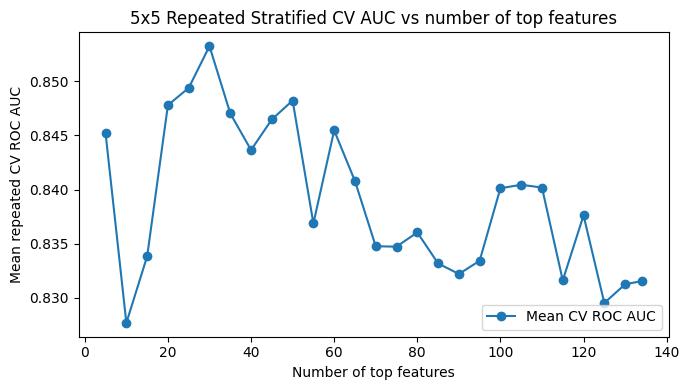


--- Top-1 model: using Top 30 features ---
Test Accuracy: 0.6061 | Precision: 0.6471 | Recall: 0.6111 | F1: 0.6286 | ROC AUC: 0.6185
Classification report:
              precision    recall  f1-score   support

           0      0.562     0.600     0.581        15
           1      0.647     0.611     0.629        18

    accuracy                          0.606        33
   macro avg      0.605     0.606     0.605        33
weighted avg      0.609     0.606     0.607        33


--- Top-2 model: using Top 25 features ---
Test Accuracy: 0.6061 | Precision: 0.6316 | Recall: 0.6667 | F1: 0.6486 | ROC AUC: 0.5685
Classification report:
              precision    recall  f1-score   support

           0      0.571     0.533     0.552        15
           1      0.632     0.667     0.649        18

    accuracy                          0.606        33
   macro avg      0.602     0.600     0.600        33
weighted avg      0.604     0.606     0.605        33


--- Top-3 model: using Top 50 f

In [ ]:
TRAIN_X_CSV = "in_chemico_x_train.csv"
TEST_X_CSV  = "in_chemico_x_test.csv"
TRAIN_Y_CSV = "in_chemico_y_train.csv"
TEST_Y_CSV  = "in_chemico_y_test.csv"
FEATURE_IMPORT_CSV = "top_features_best.csv"

STEP = 5
N_TRIALS = 50
EARLY_STOP = 30

RESULTS_CSV = "repeatedcv_subset_results.csv"
TOP3_TEST_CSV = "repeatedcv_top3_test_results.csv"
BEST_PARAMS_JSON = "repeatedcv_best_params_per_n.json"

# Load data
X_train = pd.read_csv(TRAIN_X_CSV)
X_test  = pd.read_csv(TEST_X_CSV)
y_train = pd.read_csv(TRAIN_Y_CSV).iloc[:, 0].astype(int).values
y_test  = pd.read_csv(TEST_Y_CSV).iloc[:, 0].astype(int).values
assert list(X_train.columns) == list(X_test.columns), "Train/Test feature columns misaligned."

feat_imp = pd.read_csv(FEATURE_IMPORT_CSV)
ranked_features = [f for f in feat_imp["feature"].tolist() if f in X_train.columns]
assert len(ranked_features) > 0, "No ranked features available."

# Class imbalance
pos = int((y_train == 1).sum())
neg = int((y_train == 0).sum())
scale_pos_weight = (neg / pos) if pos > 0 else 1.0

# Feature subset sizes
subset_sizes = list(range(STEP, len(ranked_features) + 1, STEP))
if subset_sizes[-1] != len(ranked_features):
    subset_sizes.append(len(ranked_features))

# Cross validation fold
rskf = RepeatedStratifiedKFold(n_splits=5, n_repeats=5, random_state=42)

def cv_auc_for_subset(top_feats, trial):
    """Compute mean AUC with repeated stratified CV."""
    params = {
        "objective": "binary:logistic",
        "eval_metric": "auc",
        "tree_method": "hist",
        "random_state": 42,
        "n_jobs": -1,
        "scale_pos_weight": scale_pos_weight,
        "n_estimators": trial.suggest_int("n_estimators", 20, 200),
        "learning_rate": trial.suggest_float("learning_rate", 0.02, 0.3, log=True),
        "max_depth": trial.suggest_int("max_depth", 3, 10),
        "min_child_weight": trial.suggest_int("min_child_weight", 1, 10),
        "subsample": trial.suggest_float("subsample", 0.7, 1.0),
        "colsample_bytree": trial.suggest_float("colsample_bytree", 0.6, 1.0),
        "gamma": trial.suggest_float("gamma", 0.0, 2.0),
        "reg_alpha": trial.suggest_float("reg_alpha", 0.0, 1.0),
        "reg_lambda": trial.suggest_float("reg_lambda", 0.5, 5.0),
        "early_stopping_rounds": EARLY_STOP,   # XGBoost >= 2.0
    }

    X_sub = X_train[top_feats].values
    aucs = []

    for tr_idx, va_idx in rskf.split(X_sub, y_train):
        X_tr, X_va = X_sub[tr_idx], X_sub[va_idx]
        y_tr, y_va = y_train[tr_idx], y_train[va_idx]

        model = xgb.XGBClassifier(**params)
        model.fit(X_tr, y_tr, eval_set=[(X_va, y_va)], verbose=False)
        prob = model.predict_proba(X_va)[:, 1]
        aucs.append(roc_auc_score(y_va, prob))

    return float(np.mean(aucs))

# Search for each N + 5
val_results = []
best_params_per_n = {}

for n in subset_sizes:
    top_feats = ranked_features[:n]

    def objective(trial):
        return cv_auc_for_subset(top_feats, trial)

    study = optuna.create_study(direction="maximize")
    study.optimize(objective, n_trials=N_TRIALS, show_progress_bar=False)

    best_auc = float(study.best_value)
    best_params_per_n[n] = study.best_trial.params
    val_results.append({"Top_N": n, "CV_ROC_AUC": best_auc})
    print(f"[Top {n:>4}] mean 5x5 CV AUC = {best_auc:.4f}")

res_df = pd.DataFrame(val_results).sort_values("Top_N").reset_index(drop=True)

# Pick top 3 subsets by CV AUC
top3_val = res_df.sort_values("CV_ROC_AUC", ascending=False).head(3)
print("\nTop 3 subsets by repeated CV AUC")
print(top3_val.to_string(index=False))

# Plot CV AUC curve
plt.figure(figsize=(7, 4))
plt.plot(res_df["Top_N"], res_df["CV_ROC_AUC"], marker="o", label="Mean CV ROC AUC")
plt.xlabel("Number of top features")
plt.ylabel("Mean repeated CV ROC AUC")
plt.title("5x5 Repeated Stratified CV AUC vs number of top features")
plt.legend(loc="lower right")
plt.tight_layout()
plt.show()

# Train top 3 on full train
top3_rows = []
for rank, (_, row) in enumerate(top3_val.iterrows(), start=1):
    n = int(row["Top_N"])
    feats = ranked_features[:n]
    params = best_params_per_n[n]

    model = xgb.XGBClassifier(
        **params,
        objective="binary:logistic",
        eval_metric="auc",
        tree_method="hist",
        random_state=42,
        n_jobs=-1,
        scale_pos_weight=scale_pos_weight,
    )
    model.fit(X_train[feats], y_train)

    y_pred = model.predict(X_test[feats])
    y_prob = model.predict_proba(X_test[feats])[:, 1]

    acc  = accuracy_score(y_test, y_pred)
    prec = precision_score(y_test, y_pred, zero_division=0)
    rec  = recall_score(y_test, y_pred, zero_division=0)
    f1   = f1_score(y_test, y_pred, zero_division=0)
    auc  = roc_auc_score(y_test, y_prob)

    print(f"\n--- Top-{rank} model: using Top {n} features ---")
    print(f"Test Accuracy: {acc:.4f} | Precision: {prec:.4f} | Recall: {rec:.4f} | F1: {f1:.4f} | ROC AUC: {auc:.4f}")
    print("Classification report:")
    print(classification_report(y_test, y_pred, digits=3, zero_division=0))

    top3_rows.append({
        "Rank": rank, "Top_N": n,
        "Test_Accuracy": acc, "Test_Precision": prec,
        "Test_Recall": rec, "Test_F1": f1, "Test_ROC_AUC": auc
    })


best_row = res_df.iloc[res_df["CV_ROC_AUC"].idxmax()]
print(f"\nBest number of features by repeated CV AUC: {int(best_row.Top_N)} (AUC = {best_row.CV_ROC_AUC:.4f})")